In [2]:
import os
import shutil
import numpy as np
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import warnings
warnings.filterwarnings("ignore")
import geopandas
import librosa
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tqdm import  tqdm

# Data description

## train-metadata.csv
A wide range of metadata is provided for the training data. The most directly relevant fields are:

 -  ***primary_label*** : a code for the bird species. You can review detailed information about the bird codes by appending the code to https://ebird.org/species/, such as https://ebird.org/species/amecro for the American Crow.

 - ***recodist***: the user who provided the recording.

 - ***latitude & longitude***: coordinates for where the recording was taken. Some bird species may have local call 'dialects,' so you may want to seek geographic diversity in your training data.

 - ***date***: while some bird calls can be made year round, such as an alarm call, some are restricted to a specific season. You may want to seek temporal diversity in your training data.

 - ***filename***: the name of the associated audio file.  
 
 
 ## test.csv
 Only the first three rows are available for download; the full test.csv is in the hidden test set.

 -  ***row_id***: ID code for the row.

 -  ***site***: Site ID.

 -  ***seconds***: the second ending the time window

 -  ***audio_id***: ID code for the audio file.
 
## train_soundscape_labels.csv  

 -  ***row_id***: ID code for the row.

 -  ***site***: Site ID.

 -  ***seconds***: the second ending the time window

 -  ***audio_id***: ID code for the audio file.

 -  ***birds***: space delimited list of any bird songs present in the 5 second window. The label nocall means that no call occurred.

## sample_submission.csv 
A properly formed sample submission file. Only the first three rows are public, the remainder will be provided to your notebook as part of the hidden test set.

 -  ***row_id***

 -  ***birds***: space delimited list of any bird songs present in the 5 second window. If there are no bird calls, use the label nocall.

In [23]:
train_soundscape_labels = pd.read_csv("/app/_data/train_soundscape_labels_orig.csv")
train_metadata = pd.read_csv("/app/_data/train_metadata_orig.csv")
test = pd.read_csv("/app/_data/test.csv")
test_dates = pd.read_csv("/app/_data/test_soundscapes/test_set_recording_dates.csv")

## train_soundscape_labels

In [24]:
train_soundscape_labels_full = pd.read_csv(
    "/app/_data/train_soundscape_labels_full.csv"
)

In [25]:
train_soundscape_labels.head(5)
train_soundscape_labels_full.head(5)

,row_id,site,audio_id,seconds,birds
0,7019_COR_5,COR,7019,5,nocall
1,7019_COR_10,COR,7019,10,nocall
2,7019_COR_15,COR,7019,15,nocall
3,7019_COR_20,COR,7019,20,nocall
4,7019_COR_25,COR,7019,25,nocall


,row_id,site,audio_id,seconds,birds,date,file_path,longitude,latitude,month,year
0,7019_COR_5,COR,7019,5,nocall,2019-09-04,/app/_data/birdclef-2021/train_soundscapes/701...,-84.51,10.12,9,2019
1,7019_COR_10,COR,7019,10,nocall,2019-09-04,/app/_data/birdclef-2021/train_soundscapes/701...,-84.51,10.12,9,2019
2,7019_COR_15,COR,7019,15,nocall,2019-09-04,/app/_data/birdclef-2021/train_soundscapes/701...,-84.51,10.12,9,2019
3,7019_COR_20,COR,7019,20,nocall,2019-09-04,/app/_data/birdclef-2021/train_soundscapes/701...,-84.51,10.12,9,2019
4,7019_COR_25,COR,7019,25,nocall,2019-09-04,/app/_data/birdclef-2021/train_soundscapes/701...,-84.51,10.12,9,2019


In [26]:
train_soundscape_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2400 entries, 0 to 2399
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   row_id    2400 non-null   object
 1   site      2400 non-null   object
 2   audio_id  2400 non-null   int64 
 3   seconds   2400 non-null   int64 
 4   birds     2400 non-null   object
dtypes: int64(2), object(3)
memory usage: 93.9+ KB


In [27]:
train_soundscape_labels_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2400 entries, 0 to 2399
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   row_id     2400 non-null   object 
 1   site       2400 non-null   object 
 2   audio_id   2400 non-null   int64  
 3   seconds    2400 non-null   int64  
 4   birds      2400 non-null   object 
 5   date       2400 non-null   object 
 6   file_path  2400 non-null   object 
 7   longitude  2400 non-null   float64
 8   latitude   2400 non-null   float64
 9   month      2400 non-null   int64  
 10  year       2400 non-null   int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 206.4+ KB


In [28]:
train_soundscape_labels["site"].value_counts()

COR    1200
SSW    1200
Name: site, dtype: int64

In [29]:
train_soundscape_labels["audio_id"].value_counts()

26709    120
14473    120
7954     120
20152    120
54955    120
18003    120
21767    120
31928    120
11254    120
2782     120
10534    120
28933    120
26746    120
44957    120
51010    120
50878    120
7843     120
7019     120
57610    120
42907    120
Name: audio_id, dtype: int64

In [30]:
len(train_soundscape_labels["birds"].unique())
train_soundscape_labels["birds"].value_counts().head(10)

109

nocall                   1529
rucwar                    149
bobfly1                    77
reevir1                    57
rewbla                     52
sonspa                     50
eawpew reevir1             37
bkcchi                     24
bkcchi eawpew reevir1      20
comyel                     20
Name: birds, dtype: int64

In [33]:
train_soundscape_labels

,row_id,site,audio_id,seconds,birds
0,7019_COR_5,COR,7019,5,nocall
1,7019_COR_10,COR,7019,10,nocall
2,7019_COR_15,COR,7019,15,nocall
3,7019_COR_20,COR,7019,20,nocall
4,7019_COR_25,COR,7019,25,nocall
...,...,...,...,...,...
2395,54955_SSW_580,SSW,54955,580,nocall
2396,54955_SSW_585,SSW,54955,585,grycat
2397,54955_SSW_590,SSW,54955,590,grycat
2398,54955_SSW_595,SSW,54955,595,nocall


In [35]:
ss_df = pd.DataFrame()
for mel_name in os.listdir("/app/_data/birdclef-2021/train_soundscapes/"):
    mel_name_full = mel_name
    mel_name = mel_name[:-4].split("_")
    ss_df = ss_df.append(
        {"audio_id": np.int(mel_name[0]), "date": mel_name[-1], 'file_path': "/app/_data/birdclef-2021/train_soundscapes/"+mel_name_full}, ignore_index=True
    )

In [36]:
# ss_df.info()

In [37]:
# ss_df

In [38]:
# train_soundscape_labels['site'].unique()

In [641]:
# train_soundscape_labels = train_soundscape_labels.merge(
#     ss_df, on="audio_id", how="outer"
# )

In [642]:
# train_soundscape_labels["date"] = pd.to_datetime(
#     train_soundscape_labels["date"], format="%Y%m%d"
# )

In [18]:
# train_soundscape_labels_full.to_csv("/app/_data/train_soundscape_labels_full.csv", index=False)

In [808]:
# train_soundscape_labels.sample()

,row_id,site,audio_id,seconds,birds,date,file_path,longitude,latitude
964,50878_COR_25,COR,50878,25,nocall,2019-10-04,/app/_data/birdclef-2021/train_soundscapes/508...,-84.51,10.12


In [40]:
list_sites = []
for file_name in os.listdir("/app/_data/test_soundscapes/txt"):
    if file_name[-3:] == "txt":
        with open("/app/_data/test_soundscapes/txt/" + file_name, "r") as f:
            site = f.readlines()
            list_sites.append([file_name.split("_")[0], site[-2:]])

In [41]:
list_sites

[['COR', ['Latitude: 10.12\n', 'Longitude: -84.51']],
 ['SNE', ['Latitude: 38.49\n', 'Longitude: -119.95']],
 ['SSW', ['Latitude: 42.47\n', 'Longitude: -76.45\n']],
 ['COL', ['Latitude: 5.57\n', 'Longitude: -75.85']]]

In [42]:
coord_sites = pd.DataFrame()
for i in list_sites:
    ids = i[0]
    coord_sites.loc[ids, "longitude"] = i[1][1].split(":")[1].split("\n")[0].split()[0]
    coord_sites.loc[ids, "latitude"] = i[1][0].split(":")[1].split("\n")[0].split()[0]
coord_sites = coord_sites.astype("float")
coord_sites["site"] = coord_sites.index

In [43]:
coord_sites

,longitude,latitude,site
COR,-84.51,10.12,COR
SNE,-119.95,38.49,SNE
SSW,-76.45,42.47,SSW
COL,-75.85,5.57,COL


In [44]:
# train_soundscape_labels = train_soundscape_labels.merge(coord_sites, on='site', how='left')

In [75]:
coord_sites.to_csv("/app/_data/coord_sites.csv", index=False)

## train_metadata

In [45]:
train_metadata.head(5)
train_metadata.shape

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url
0,acafly,['amegfi'],"['begging call', 'call', 'juvenile']",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605
1,acafly,[],['call'],9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,?,https://www.xeno-canto.org/11209
2,acafly,[],['call'],5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,15:20,https://www.xeno-canto.org/127032
3,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129974
4,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129981


(62874, 14)

## names of species

In [46]:
train_metadata["scientific_name"].unique().shape
train_metadata["scientific_name"].value_counts()
train_metadata["common_name"].unique().shape
train_metadata["common_name"].value_counts()

(397,)

Hirundo rustica              500
Henicorhina leucophrys       500
Melospiza melodia            500
Toxostoma curvirostre        500
Agelaius phoeniceus          500
                            ... 
Pionus senilis                12
Melozone leucotis             10
Campylorhynchus rufinucha      9
Psittacara finschi             8
Amazilia saucerottei           8
Name: scientific_name, Length: 397, dtype: int64

(397,)

House Sparrow                 500
Curve-billed Thrasher         500
Common Raven                  500
Northern Cardinal             500
Red Crossbill                 500
                             ... 
White-crowned Parrot           12
White-eared Ground-Sparrow     10
Rufous-naped Wren               9
Crimson-fronted Parakeet        8
Steely-vented Hummingbird       8
Name: common_name, Length: 397, dtype: int64

In [47]:
train_metadata["primary_label"].unique().shape[0]
train_metadata["primary_label"].value_counts()

397

comrav     500
sonspa     500
gbwwre1    500
eursta     500
cubthr     500
          ... 
whcpar      12
wegspa1     10
runwre1      9
stvhum2      8
crfpar       8
Name: primary_label, Length: 397, dtype: int64

In [48]:
train_metadata["secondary_labels"].unique().shape[0]
train_metadata["secondary_labels"].value_counts()

10918

[]                                                    41358
['rewbla']                                              292
['amerob']                                              235
['houspa']                                              218
['norcar']                                              205
                                                      ...  
['yelwar', 'whwdov', 'melbla1', 'clcrob']                 1
['bewwre', 'calqua']                                      1
['norcar', 'whwdov', 'incdov', 'bncfly', 'rewbla']        1
['amecro', 'chispa']                                      1
['wilsni1', 'swathr', 'westan']                           1
Name: secondary_labels, Length: 10918, dtype: int64

In [49]:
train_metadata["secondary_labels"] = train_metadata["secondary_labels"].str.replace(
    r"[\[\]\',]", ""
)

In [50]:
train_metadata["secondary_labels"].sample(5)

51250                 
11987    amerob rewbla
26751    killde greyel
31355    norwat amerob
9962                  
Name: secondary_labels, dtype: object

In [51]:
a = []
for i in train_metadata["secondary_labels"].values:
    a.extend(i.split(" "))

In [52]:
len(set(a))

394

only 394 species in secondary_labels

## type

In [53]:
train_metadata["type"] = train_metadata["type"].str.replace(r"[\[\]\'\"\(\)?]", "")
train_metadata["type"]

0                     begging call, call, juvenile
1                                             call
2                                             call
3                                             call
4                                             call
                           ...                    
62869                            adult, male, song
62870    life stage uncertain, sex uncertain, song
62871                            adult, male, song
62872                                    uncertain
62873                            adult, male, song
Name: type, Length: 62874, dtype: object

In [54]:
train_metadata["type"].unique().shape
train_metadata["type"].value_counts()[:20]

(3041,)

song                                         22608
call                                         15251
call, song                                    3311
flight call                                   1950
male, song                                    1577
adult, male, song                             1045
                                               886
alarm call                                     814
adult, sex uncertain, song                     726
adult, call, sex uncertain                     620
call, flight call                              598
call, male                                     541
nocturnal flight call                          343
calls                                          331
dawn song                                      310
adult, song                                    289
call, female                                   288
call, male, song                               280
call, life stage uncertain, sex uncertain      276
alarm call, call               

In [55]:
type_list = []
for i in train_metadata["type"]:
    type_list.extend(i.split())

In [56]:
len(type_list)
len(set(type_list))

108278

1642

## date

In [57]:
train_metadata["month"] = train_metadata["date"].apply(lambda x: x.split("-")[1])
train_metadata["month"] = train_metadata["month"].astype("int")
train_metadata["year"] = train_metadata["date"].apply(lambda x: x.split("-")[0])
train_metadata["year"] = train_metadata["year"].astype("int")

In [58]:
train_metadata["date_1"] = pd.to_datetime(
    train_metadata["date"], format="%Y-%m-%d", errors="coerce"
)

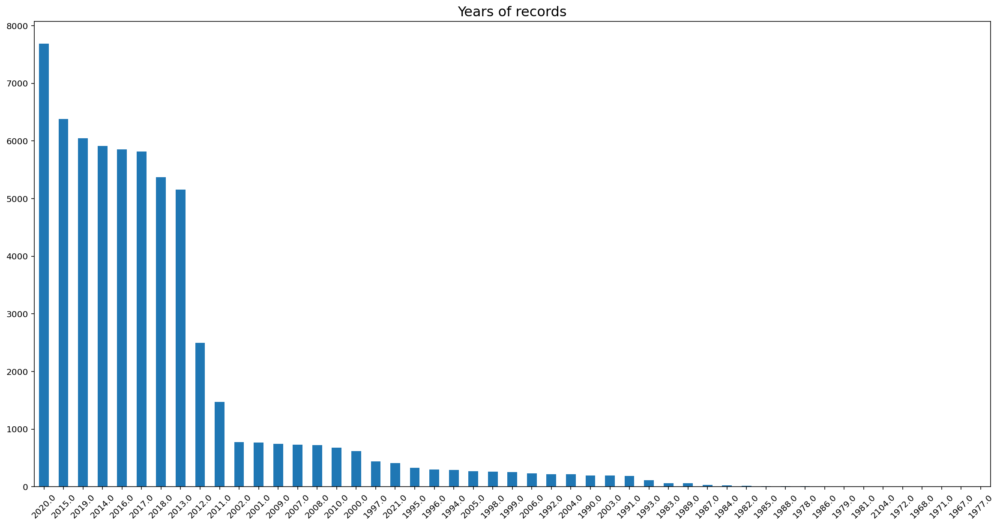

In [59]:
plt.figure(figsize=(20, 10))
plt.title("Years of records", fontsize=16)
train_metadata["date_1"].dt.year.value_counts().plot(kind="bar")
plt.xticks(rotation=45)
plt.show();

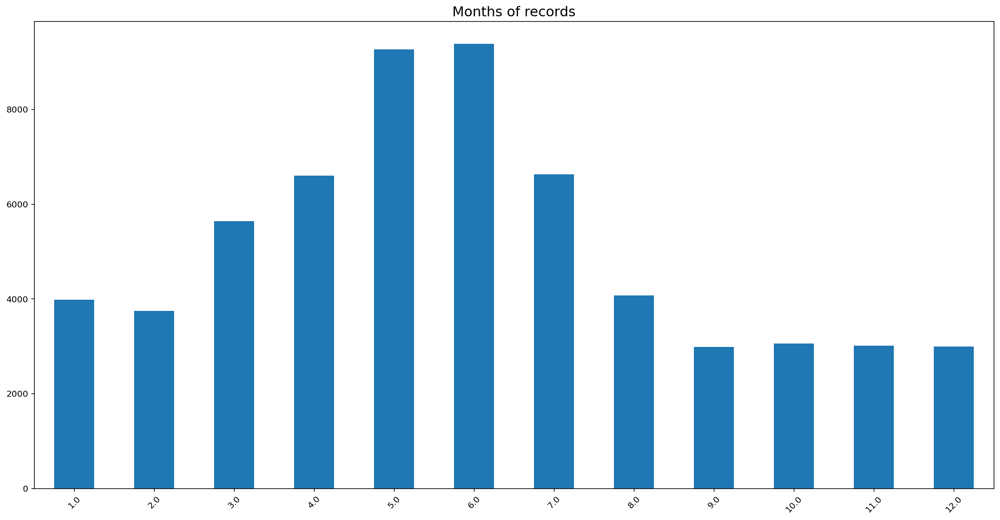

In [60]:
plt.figure(figsize=(20, 10))
plt.title("Months of records", fontsize=16)
train_metadata["date_1"].dt.month.value_counts().sort_index().plot(kind="bar")
plt.xticks(rotation=45)
plt.show();

In [61]:
train_metadata[train_metadata["date_1"].isna()]["date"]

26       2001-00-00
466      1992-12-00
801      0000-00-00
883      0000-00-00
1023     1999-03-00
            ...    
62316    2002-04-00
62317    2002-04-00
62352    2005-07-00
62443    0000-00-00
62791    0000-00-00
Name: date, Length: 1486, dtype: object

In [62]:
train_metadata[train_metadata["date"].str.contains("-00-")]["date"]

26       2001-00-00
801      0000-00-00
883      0000-00-00
1024     0000-00-00
1564     0000-00-00
            ...    
56243    1993-00-00
57056    0000-00-00
60505    2001-00-00
62443    0000-00-00
62791    0000-00-00
Name: date, Length: 155, dtype: object

In [63]:
train_metadata[train_metadata["month"] == 0]["primary_label"].value_counts()

chbwre1    24
lesvio1    11
roahaw      9
littin1     6
bkmtou1     6
           ..
linwoo1     1
blkpho      1
barswa      1
amerob      1
bulori      1
Name: primary_label, Length: 77, dtype: int64

In [64]:
train_metadata[train_metadata["primary_label"] == "chbwre1"]["month"].value_counts()

0     24
1     13
11    10
2      8
7      8
8      8
3      6
9      6
6      5
10     5
4      3
5      2
12     1
Name: month, dtype: int64

In [65]:
train_metadata[
    (train_metadata["primary_label"] == "chbwre1") & (train_metadata["month"] == 1)
]
train_metadata[
    (train_metadata["primary_label"] == "chbwre1") & (train_metadata["month"] == 0)
]

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url,month,year,date_1
14816,chbwre1,,song,5.7289,-76.2439,Cyphorhinus thoracicus,Chestnut-breasted Wren,David Edwards,2012-01-00,XC119653.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,08:00,https://www.xeno-canto.org/119653,1,2012,NaT
14817,chbwre1,,song,5.7289,-76.2439,Cyphorhinus thoracicus,Chestnut-breasted Wren,David Edwards,2012-01-00,XC119654.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,08:00,https://www.xeno-canto.org/119654,1,2012,NaT
14818,chbwre1,acowoo grethr1 mastro1,song,5.7160,-75.2583,Cyphorhinus thoracicus,Chestnut-breasted Wren,Oscar H. Marín-Gómez,2010-01-06,XC129247.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.5,07:30,https://www.xeno-canto.org/129247,1,2010,2010-01-06
14852,chbwre1,,call,4.7221,-75.5773,Cyphorhinus thoracicus,Chestnut-breasted Wren,Ross Gallardy,2017-01-13,XC354278.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,10:00,https://www.xeno-canto.org/354278,1,2017,2017-01-13
14853,chbwre1,,song,4.7221,-75.5773,Cyphorhinus thoracicus,Chestnut-breasted Wren,Ross Gallardy,2017-01-13,XC354279.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,07:30,https://www.xeno-canto.org/354279,1,2017,2017-01-13
14854,chbwre1,,song,4.7221,-75.5773,Cyphorhinus thoracicus,Chestnut-breasted Wren,Ross Gallardy,2017-01-13,XC354280.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,07:30,https://www.xeno-canto.org/354280,1,2017,2017-01-13
14855,chbwre1,,song,5.7908,-76.0744,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sebastián Berrío,2017-01-28,XC354322.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,08:00,https://www.xeno-canto.org/354322,1,2017,2017-01-28
14856,chbwre1,,song,5.2018,-76.0542,Cyphorhinus thoracicus,Chestnut-breasted Wren,Oswaldo Cortes,2017-01-27,XC366939.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.0,07:00,https://www.xeno-canto.org/366939,1,2017,2017-01-27
14857,chbwre1,,song,5.2431,-76.0964,Cyphorhinus thoracicus,Chestnut-breasted Wren,Oswaldo Cortes,2017-01-18,XC367845.ogg,Creative Commons Attribution-NonCommercial-Sha...,1.0,09:00,https://www.xeno-canto.org/367845,1,2017,2017-01-18
14858,chbwre1,,song,5.2431,-76.0964,Cyphorhinus thoracicus,Chestnut-breasted Wren,Oswaldo Cortes,2017-01-18,XC367846.ogg,Creative Commons Attribution-NonCommercial-Sha...,1.0,09:00,https://www.xeno-canto.org/367846,1,2017,2017-01-18


,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url,month,year,date_1
14791,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117818.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.0,?,https://www.xeno-canto.org/117818,0,0,NaT
14792,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117819.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117819,0,0,NaT
14793,chbwre1,gbwwre1,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117820.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.5,?,https://www.xeno-canto.org/117820,0,0,NaT
14794,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117821.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117821,0,0,NaT
14795,chbwre1,,"call, song",3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117822.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117822,0,0,NaT
14796,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117823.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117823,0,0,NaT
14797,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117824.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117824,0,0,NaT
14798,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117825.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117825,0,0,NaT
14799,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117826.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/117826,0,0,NaT
14800,chbwre1,,song,3.565778,-76.58430,Cyphorhinus thoracicus,Chestnut-breasted Wren,Sergio Córdoba Córdoba (Colección de Sonidos A...,0000-00-00,XC117827.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.0,?,https://www.xeno-canto.org/117827,0,0,NaT


In [66]:
train_metadata["year"].value_counts()

2020    7690
2015    6380
2019    6045
2014    5914
2016    5850
2017    5837
2018    5387
2013    5152
2012    2524
2011    1471
2002     839
2001     790
2009     789
2008     778
2007     776
2010     685
2000     629
1997     523
1996     429
2021     407
1995     393
2005     382
2003     375
1998     373
1994     332
2006     318
1999     310
2004     277
1992     245
1991     207
1990     201
1993     164
0        112
1989      72
1983      70
1987      40
1984      26
1982      19
1988      14
1985      12
1986       9
1978       7
1979       6
201        3
1981       3
1968       2
2104       1
199        1
1972       1
1971       1
202        1
1967       1
1977       1
Name: year, dtype: int64

## Geodata

In [67]:
world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))

In [68]:
list_top_10 = train_metadata["primary_label"].value_counts()[:10].index.tolist()
top_10 = train_metadata.query("primary_label in @list_top_10")

In [69]:
gdf_coord_sites = geopandas.GeoDataFrame(
    coord_sites,
    geometry=geopandas.points_from_xy(coord_sites.longitude, coord_sites.latitude),
)

In [70]:
gdf_top_10 = geopandas.GeoDataFrame(
    top_10, geometry=geopandas.points_from_xy(top_10.longitude, top_10.latitude)
)
gdf_all = geopandas.GeoDataFrame(
    train_metadata,
    geometry=geopandas.points_from_xy(
        train_metadata.longitude, train_metadata.latitude
    ),
)

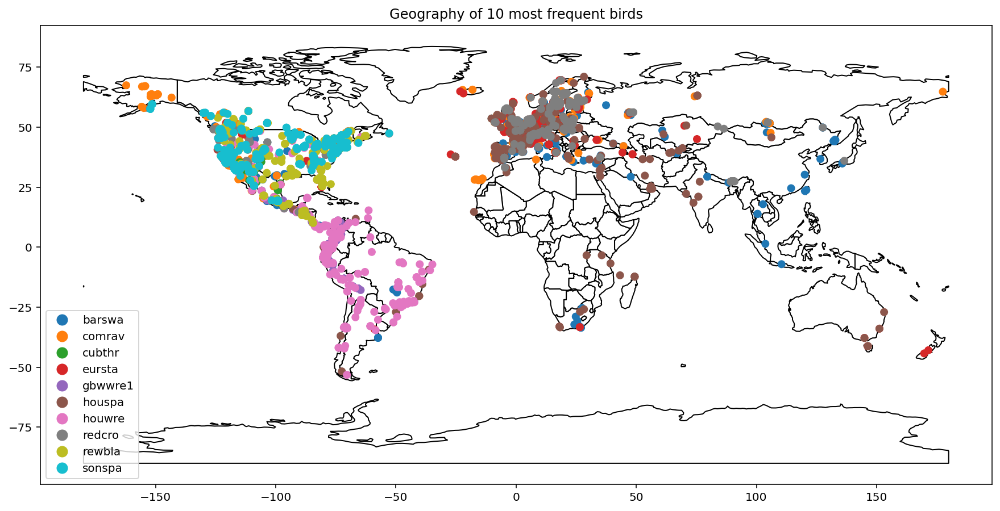

In [71]:
ax = world.plot(color="white", edgecolor="black", figsize=(15, 15))
plt.title("Geography of 10 most frequent birds")
gdf_top_10.plot(column="primary_label", ax=ax, categorical=True, legend=True)
plt.show();

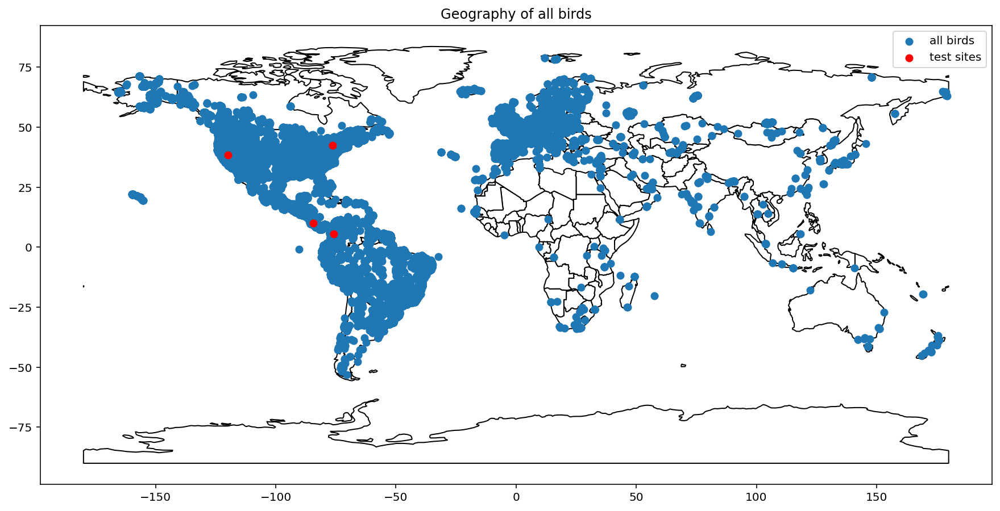

In [101]:
ax = world.plot(color="white", edgecolor="black", figsize=(15, 15))
plt.title("Geography of all birds")
gdf_all.plot(ax=ax, categorical=True, label="all birds")
gdf_coord_sites.plot(ax=ax, categorical=True, color="r", label="test sites")
plt.legend()
plt.show();

In [73]:
chbwre1 = train_metadata.query('primary_label == "chbwre1"')
gdf_chbwre1 = geopandas.GeoDataFrame(
    chbwre1, geometry=geopandas.points_from_xy(chbwre1.longitude, chbwre1.latitude)
)
gdf_chbwre1["month"] = (
    gdf_chbwre1["date"].apply(lambda x: x.split("-")[1]).astype("int")
)

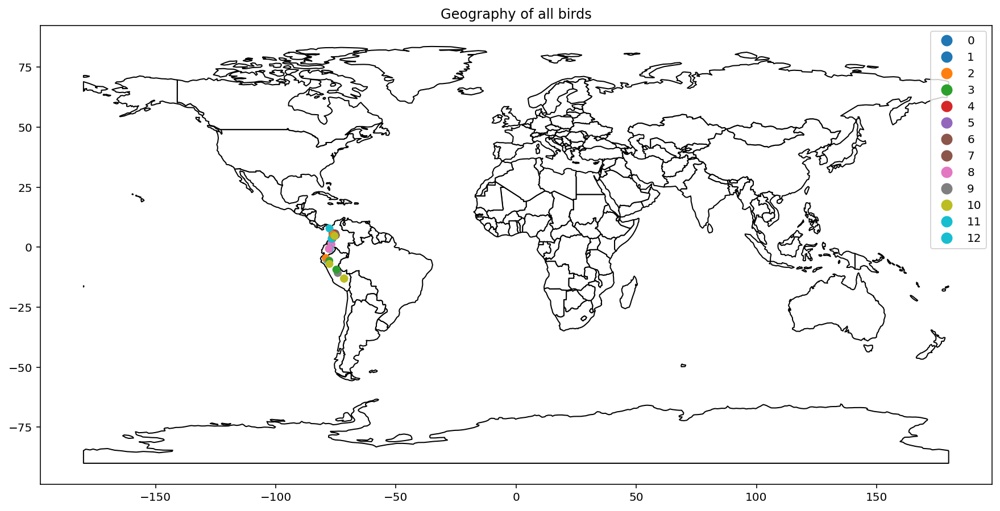

In [74]:
ax = world.plot(color="white", edgecolor="black", figsize=(15, 15))
plt.title("Geography of all birds")
gdf_chbwre1.plot(ax=ax, categorical=True, column="month", legend=True)
plt.show();

## Rating

In [44]:
train_metadata["rating"].value_counts().sort_index()

0.0     3334
0.5      154
1.0      212
1.5      674
2.0     1121
2.5     3484
3.0     5009
3.5    10660
4.0    14393
4.5    10423
5.0    13410
Name: rating, dtype: int64

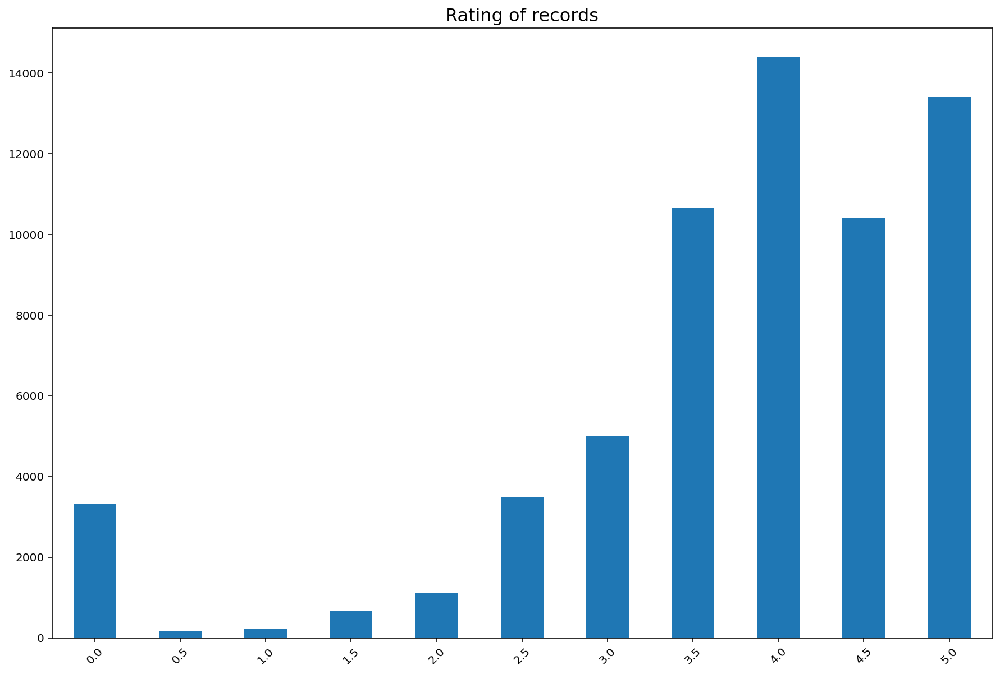

In [45]:
plt.figure(figsize=(15, 10))
plt.title("Rating of records", fontsize=16)
train_metadata["rating"].value_counts().sort_index().plot(kind="bar")
plt.xticks(rotation=45)
plt.show();

## test

In [46]:
test

,row_id,site,audio_id,seconds
0,3575_COL_5,COL,3575,5
1,3575_COL_10,COL,3575,10
2,3575_COL_15,COL,3575,15


In [47]:
test_dates.head()

,site,date
0,COL,20190914
1,COL,20191003
2,COL,20191105
3,COL,20191110
4,COR,20190901


## audio
https://www.kaggle.com/stefankahl/birdclef2021-processing-audio-data

In [84]:
# Pick a file
audio_path = "/app/_data/train_short_audio/amerob/XC129802.ogg"

In [85]:
# Listen to it
import IPython.display as ipd

ipd.Audio(audio_path, rate=32000)

In [86]:
sig, rate = librosa.load(audio_path, sr=32000)
print("SIGNAL SHAPE:", sig.shape)

SIGNAL SHAPE: (3242912,)


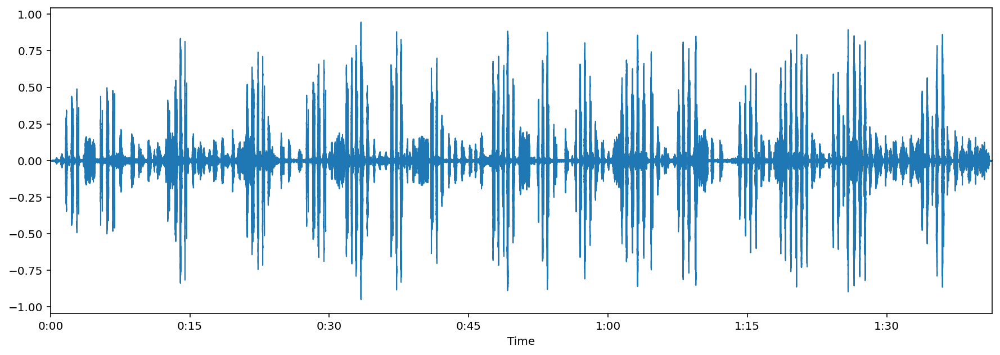

In [87]:
import librosa.display
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
librosa.display.waveplot(sig, sr=32000)
plt.plot();

In [88]:
repl = np.where(abs(sig) < 0.1, 0, sig)

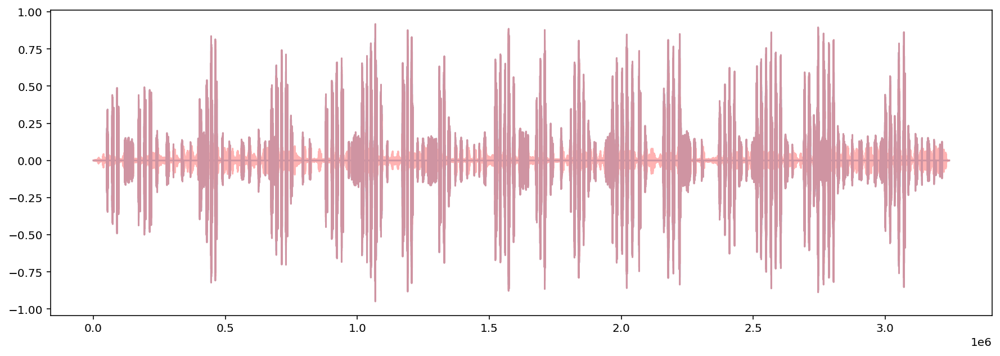

In [89]:
plt.figure(figsize=(15, 5))
plt.plot(repl, alpha=0.3)
plt.plot(sig, color="r", alpha=0.3)
plt.plot();

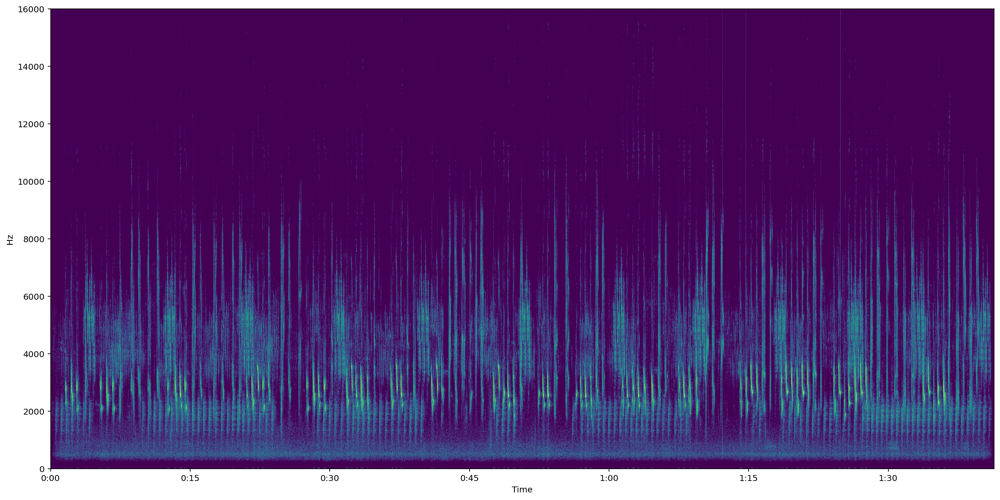

In [90]:
# First, compute the spectrogram using the "short-time Fourier transform" (stft)
spec = librosa.stft(sig, n_fft=2048)

# Scale the amplitudes according to the decibel scale
spec_db = librosa.amplitude_to_db(spec, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(20, 10))
librosa.display.specshow(
    spec_db, sr=32000, x_axis="time", y_axis="hz", cmap=plt.get_cmap("viridis")
)
plt.show();

In [91]:
print("SPEC SHAPE:", spec_db.shape)

SPEC SHAPE: (1025, 6334)


We need to consider some parameters which we can specify during the STFT: “window length” (and with that implicitly also the number of frequency bins, "n_fft") and “hop length”. Take a look at the librosa documentation to see what these values mean (https://librosa.org/doc/0.8.0/generated/librosa.stft.html).

Let’s try different values. Say, we want to have an overlap between frames of 50%, so our hop_length should be half of our win_length.

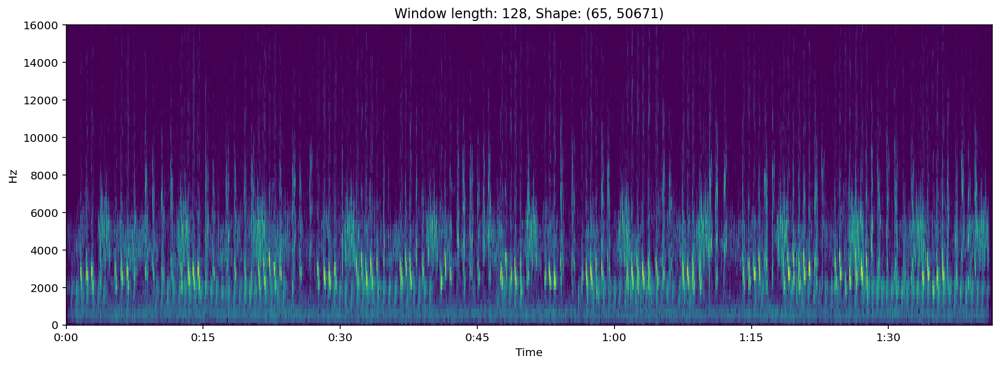

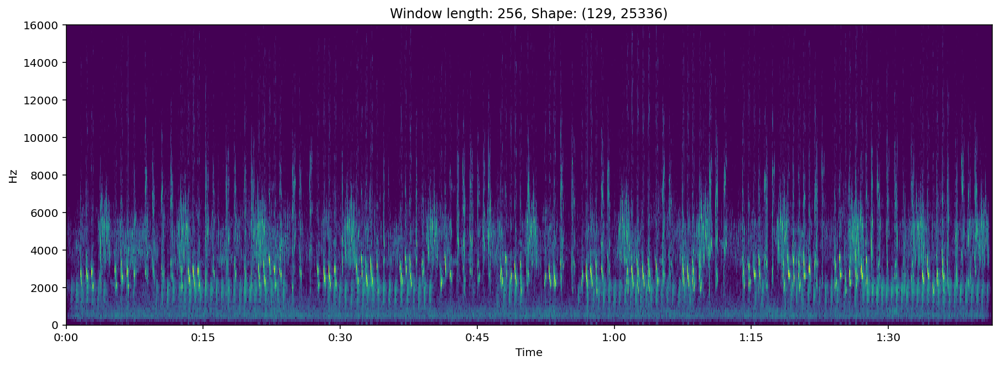

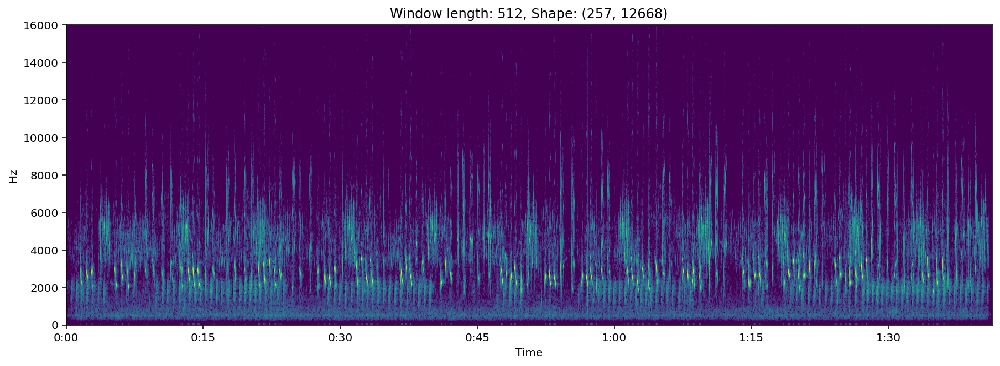

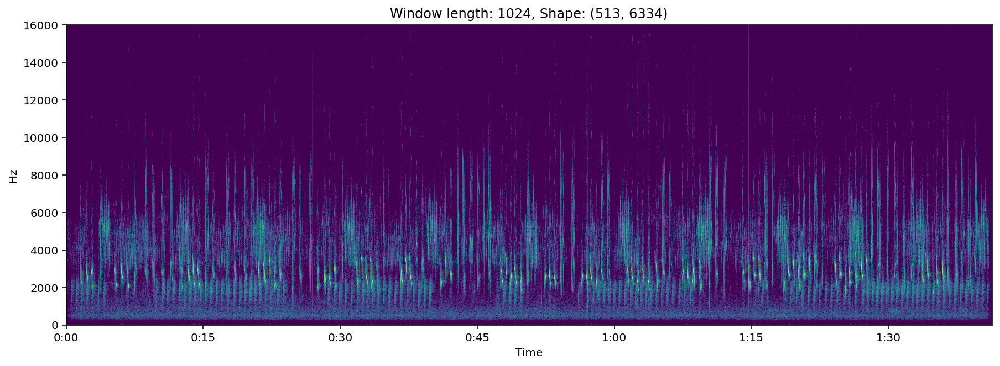

In [92]:
# Try a few window lengths (should be a power of 2)
for win_length in [128, 256, 512, 1024]:

    # We want 50% overlap between samples
    hop_length = win_length // 2

    # Compute spec (win_length implicity also sets n_fft and vice versa)
    spec = librosa.stft(sig, n_fft=win_length, hop_length=hop_length)

    # Scale to decibel scale
    spec_db = librosa.amplitude_to_db(spec, ref=np.max)

    # Show plot
    plt.figure(figsize=(15, 5))
    plt.title("Window length: " + str(win_length) + ", Shape: " + str(spec_db.shape))
    librosa.display.specshow(
        spec_db,
        sr=32000,
        hop_length=hop_length,
        x_axis="time",
        y_axis="hz",
        cmap=plt.get_cmap("viridis"),
    )
plt.show();

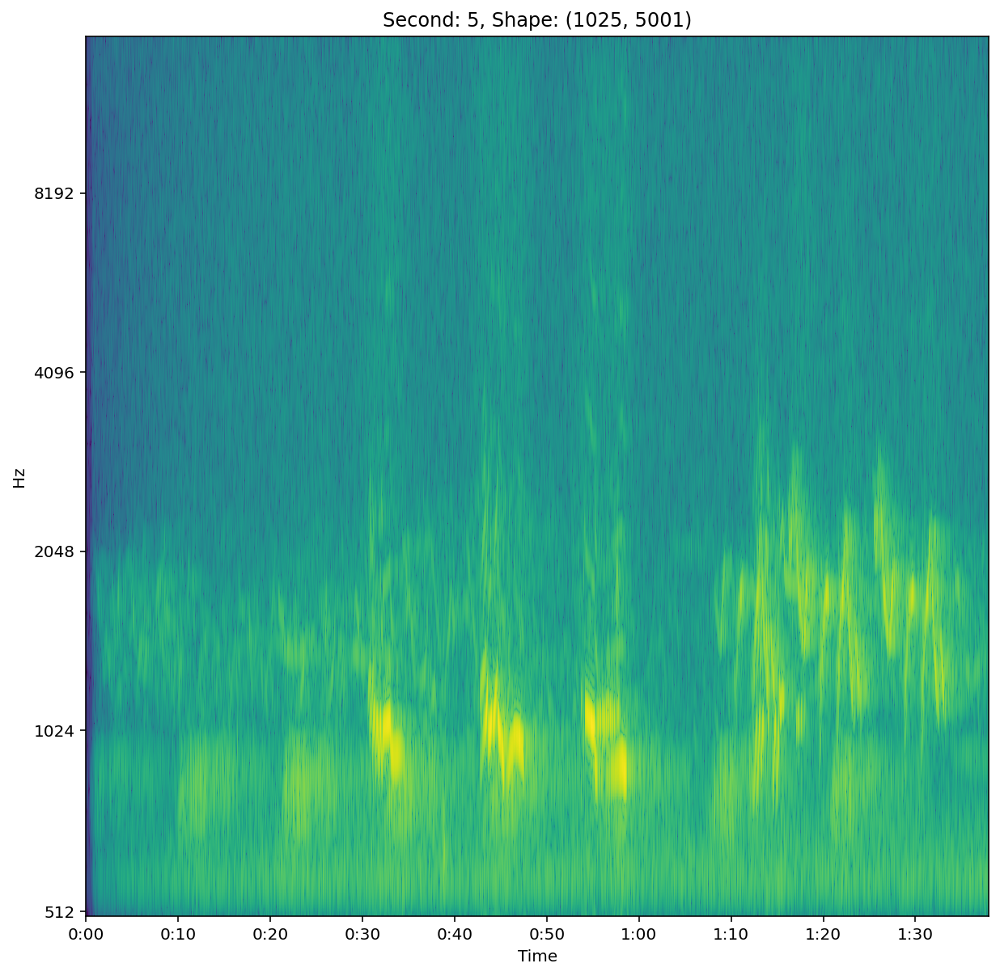

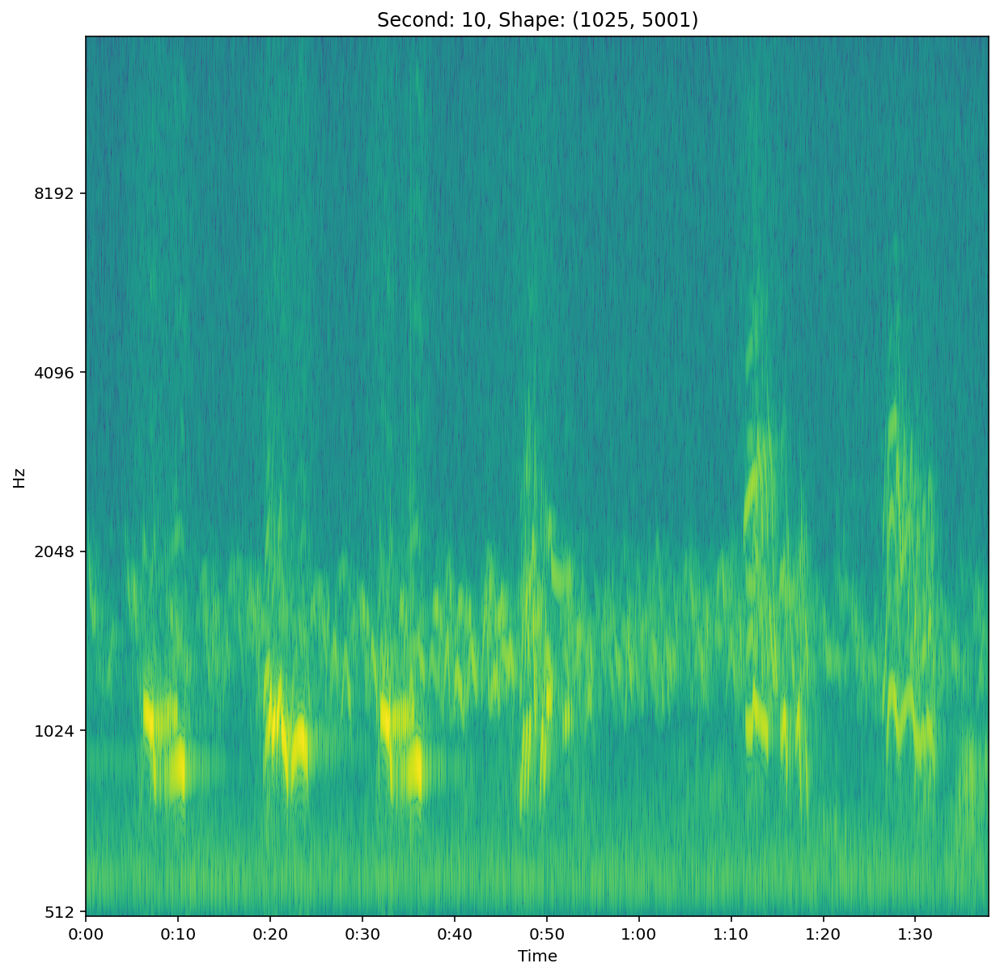

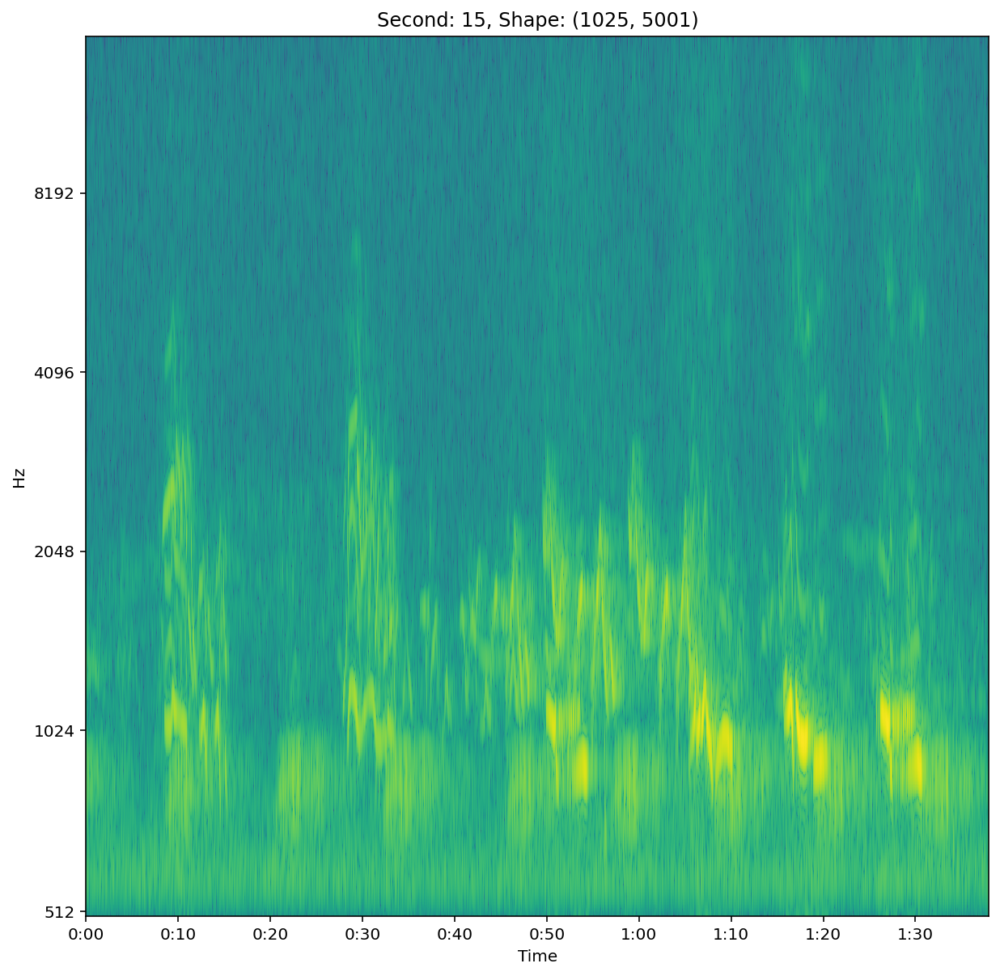

In [93]:
# Desired shape of the input spectrogram
SPEC_HEIGHT = 256
SPEC_WIDTH = 256

# Derive num_mels and hop_length from desired spec shape
# num_mels is easy, that's just spec_height
# hop_length is a bit more complicated
NUM_MELS = SPEC_HEIGHT
HOP_LENGTH = int(
    32000 * 5 / (SPEC_WIDTH - 1)
)  # sample rate * duration / spec width - 1 == 627

# High- and low-pass frequencies
# For many birds, these are a good choice
FMIN = 500
FMAX = 15000

# Let's get all three spectrograms
for second in [5, 10, 15]:

    # Get start and stop sample
    s_start = (second - 5) * 32000
    s_end = second * 32000

    # Compute the spectrogram and apply the mel scale
    mel_spec = librosa.stft(
        sig[s_start:s_end],
        n_fft=2048,
        win_length=128,
    )
    #     mel_spec = librosa.feature.melspectrogram(
    #         y=sig[s_start:s_end],
    #         sr=32000,
    #         n_fft=2048,
    #         hop_length=HOP_LENGTH,
    #         n_mels=NUM_MELS,
    #         fmin=FMIN,
    #         fmax=FMAX,
    #     )

    mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

    # Show the spec
    plt.figure(figsize=(10, 10))
    plt.title("Second: " + str(second) + ", Shape: " + str(mel_spec_db.shape))
    librosa.display.specshow(
        mel_spec_db,
        sr=32000,
        hop_length=HOP_LENGTH,
        x_axis="time",
        y_axis="mel",
        fmin=FMIN,
        fmax=FMAX,
        cmap=plt.get_cmap("viridis"),
    )
plt.show();

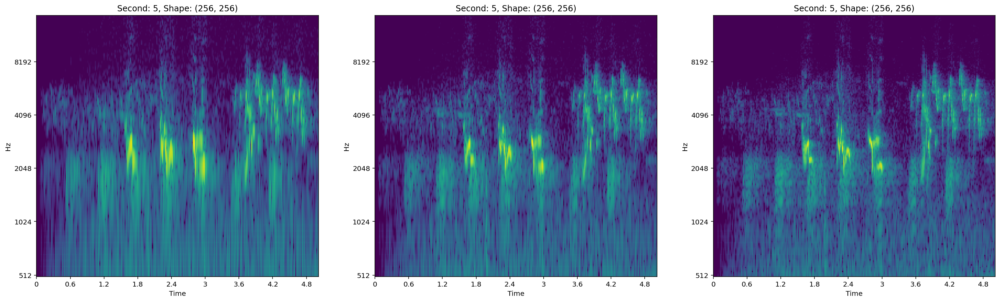

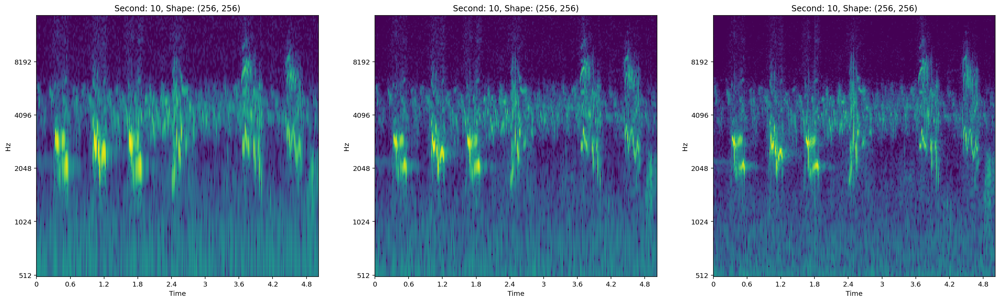

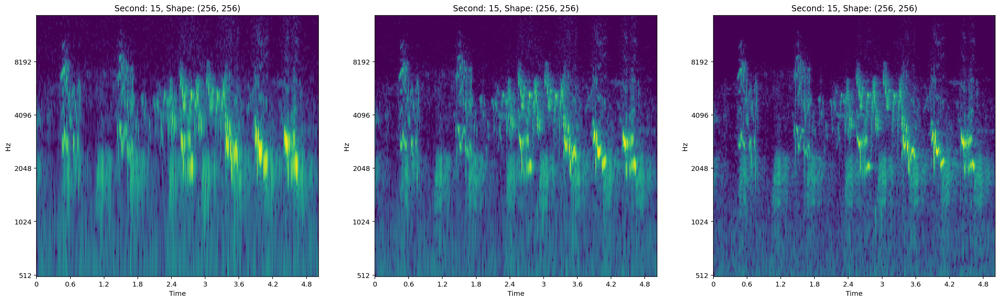

In [99]:
# Desired shape of the input spectrogram
SPEC_HEIGHT = 256
SPEC_WIDTH = 256

# Derive num_mels and hop_length from desired spec shape
# num_mels is easy, that's just spec_height
# hop_length is a bit more complicated
NUM_MELS = SPEC_HEIGHT
HOP_LENGTH = int(
    32000 * 5 / (SPEC_WIDTH - 1)
)  # sample rate * duration / spec width - 1 == 627

# High- and low-pass frequencies
# For many birds, these are a good choice
FMIN = 500
FMAX = 15000

for second in [5, 10, 15]:
    s_start = (second - 5) * 32000
    s_end = second * 32000
    plt.figure(figsize=(25, 7))
    for i, win_length in enumerate([128, 256, 512]):
        mel_spec = librosa.feature.melspectrogram(
            y=sig[s_start:s_end],
            sr=32000,
            n_fft=2048,
            win_length=win_length,
            hop_length=HOP_LENGTH,
            n_mels=NUM_MELS,
            fmin=FMIN,
            fmax=FMAX,
        )
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        # Show the spec
        plt.subplot(1, 3, i + 1)
        plt.title("Second: " + str(second) + ", Shape: " + str(mel_spec_db.shape))
        librosa.display.specshow(
            mel_spec_db,
            sr=32000,
            hop_length=HOP_LENGTH,
            x_axis="time",
            y_axis="mel",
            fmin=FMIN,
            fmax=FMAX,
            cmap=plt.get_cmap("viridis"),
        )
plt.show();

In [70]:
train_data["filename"]

0        XC109605.ogg
1         XC11209.ogg
2        XC127032.ogg
3        XC129974.ogg
4        XC129981.ogg
             ...     
62869    XC591680.ogg
62870    XC600085.ogg
62871    XC602701.ogg
62872    XC614733.ogg
62873    XC615888.ogg
Name: filename, Length: 62874, dtype: object

In [76]:
os.listdir("/app/_data/birdclef-2021/train_short_audio/ccbfin/")[:5]

['XC525847.ogg', 'XC529434.ogg', 'XC262694.ogg', 'XC609768.ogg', 'XC7779.ogg']

In [80]:
os.listdir("/app/_data/birdclef-2021/train_short_audio/ccbfin")[1]

'XC529434.ogg'

In [84]:
short_audio_path = "/app/_data/birdclef-2021/train_short_audio/"
copy_path = "/app/_data/labels/"

In [95]:
# for folder_name in os.listdir(short_audio_path)[2:]:
#     if not os.path.exists(copy_path+folder_name):
#         os.mkdir(copy_path+folder_name)
#     list_ogg = os.listdir(short_audio_path+folder_name)
#     r = np.random.randint(0, len(list_ogg), 5)
#     for i in r:
#         file_name = list_ogg[i]
#         new_folder_path = os.path.join(copy_path,folder_name, file_name[:-4])
#         if not os.path.exists(new_folder_path):
#             os.mkdir(new_folder_path)
#         shutil.copy(os.path.join(short_audio_path,folder_name, file_name), os.path.join(new_folder_path, file_name))
#         print(file_name, r, new_folder_path, os.path.join(short_audio_path,folder_name, file_name))

'/app/_data/labels/brebla/XC341513/XC341513.ogg'

'/app/_data/labels/brebla/XC416140/XC416140.ogg'

'/app/_data/labels/brebla/XC320269/XC320269.ogg'

'/app/_data/labels/brebla/XC205757/XC205757.ogg'

'/app/_data/labels/brebla/XC290133/XC290133.ogg'

'/app/_data/labels/grepew/XC322196/XC322196.ogg'

'/app/_data/labels/grepew/XC380637/XC380637.ogg'

'/app/_data/labels/grepew/XC324913/XC324913.ogg'

'/app/_data/labels/grepew/XC612957/XC612957.ogg'

'/app/_data/labels/grepew/XC447707/XC447707.ogg'

'/app/_data/labels/yefgra1/XC33709/XC33709.ogg'

'/app/_data/labels/yefgra1/XC376116/XC376116.ogg'

'/app/_data/labels/yefgra1/XC454476/XC454476.ogg'

'/app/_data/labels/yefgra1/XC137735/XC137735.ogg'

'/app/_data/labels/yefgra1/XC539706/XC539706.ogg'

'/app/_data/labels/rubwre1/XC113562/XC113562.ogg'

'/app/_data/labels/rubwre1/XC571672/XC571672.ogg'

'/app/_data/labels/rubwre1/XC366531/XC366531.ogg'

'/app/_data/labels/rubwre1/XC387887/XC387887.ogg'

'/app/_data/labels/rubwre1/XC408358/XC408358.ogg'

'/app/_data/labels/rewbla/XC383946/XC383946.ogg'

'/app/_data/labels/rewbla/XC579155/XC579155.ogg'

'/app/_data/labels/rewbla/XC526135/XC526135.ogg'

'/app/_data/labels/rewbla/XC192705/XC192705.ogg'

'/app/_data/labels/rewbla/XC181943/XC181943.ogg'

'/app/_data/labels/coltro1/XC595876/XC595876.ogg'

'/app/_data/labels/coltro1/XC382358/XC382358.ogg'

'/app/_data/labels/coltro1/XC174336/XC174336.ogg'

'/app/_data/labels/coltro1/XC129919/XC129919.ogg'

'/app/_data/labels/coltro1/XC239116/XC239116.ogg'

'/app/_data/labels/whbman1/XC425361/XC425361.ogg'

'/app/_data/labels/whbman1/XC71140/XC71140.ogg'

'/app/_data/labels/whbman1/XC8817/XC8817.ogg'

'/app/_data/labels/whbman1/XC130875/XC130875.ogg'

'/app/_data/labels/whbman1/XC419296/XC419296.ogg'

'/app/_data/labels/subfly/XC124023/XC124023.ogg'

'/app/_data/labels/subfly/XC234352/XC234352.ogg'

'/app/_data/labels/subfly/XC327619/XC327619.ogg'

'/app/_data/labels/subfly/XC511225/XC511225.ogg'

'/app/_data/labels/subfly/XC498074/XC498074.ogg'

'/app/_data/labels/orcpar/XC454406/XC454406.ogg'

'/app/_data/labels/orcpar/XC334715/XC334715.ogg'

'/app/_data/labels/orcpar/XC196773/XC196773.ogg'

'/app/_data/labels/orcpar/XC326400/XC326400.ogg'

'/app/_data/labels/orcpar/XC125464/XC125464.ogg'

'/app/_data/labels/chbchi/XC163621/XC163621.ogg'

'/app/_data/labels/chbchi/XC363140/XC363140.ogg'

'/app/_data/labels/chbchi/XC352289/XC352289.ogg'

'/app/_data/labels/chbchi/XC419796/XC419796.ogg'

'/app/_data/labels/chbchi/XC414894/XC414894.ogg'

'/app/_data/labels/naswar/XC178241/XC178241.ogg'

'/app/_data/labels/naswar/XC316057/XC316057.ogg'

'/app/_data/labels/naswar/XC185149/XC185149.ogg'

'/app/_data/labels/naswar/XC316057/XC316057.ogg'

'/app/_data/labels/naswar/XC216798/XC216798.ogg'

'/app/_data/labels/rubpep1/XC145442/XC145442.ogg'

'/app/_data/labels/rubpep1/XC306611/XC306611.ogg'

'/app/_data/labels/rubpep1/XC150915/XC150915.ogg'

'/app/_data/labels/rubpep1/XC376820/XC376820.ogg'

'/app/_data/labels/rubpep1/XC233065/XC233065.ogg'

'/app/_data/labels/whevir/XC434436/XC434436.ogg'

'/app/_data/labels/whevir/XC184317/XC184317.ogg'

'/app/_data/labels/whevir/XC263476/XC263476.ogg'

'/app/_data/labels/whevir/XC336342/XC336342.ogg'

'/app/_data/labels/whevir/XC558116/XC558116.ogg'

'/app/_data/labels/mutswa/XC180127/XC180127.ogg'

'/app/_data/labels/mutswa/XC608159/XC608159.ogg'

'/app/_data/labels/mutswa/XC304935/XC304935.ogg'

'/app/_data/labels/mutswa/XC515561/XC515561.ogg'

'/app/_data/labels/mutswa/XC348215/XC348215.ogg'

'/app/_data/labels/caskin/XC530990/XC530990.ogg'

'/app/_data/labels/caskin/XC321781/XC321781.ogg'

'/app/_data/labels/caskin/XC124201/XC124201.ogg'

'/app/_data/labels/caskin/XC147302/XC147302.ogg'

'/app/_data/labels/caskin/XC446121/XC446121.ogg'

'/app/_data/labels/categr/XC139953/XC139953.ogg'

'/app/_data/labels/categr/XC610382/XC610382.ogg'

'/app/_data/labels/categr/XC451817/XC451817.ogg'

'/app/_data/labels/categr/XC369827/XC369827.ogg'

'/app/_data/labels/categr/XC136312/XC136312.ogg'

'/app/_data/labels/roahaw/XC117962/XC117962.ogg'

'/app/_data/labels/roahaw/XC153988/XC153988.ogg'

'/app/_data/labels/roahaw/XC390628/XC390628.ogg'

'/app/_data/labels/roahaw/XC245043/XC245043.ogg'

'/app/_data/labels/roahaw/XC117665/XC117665.ogg'

'/app/_data/labels/yelgro/XC503240/XC503240.ogg'

'/app/_data/labels/yelgro/XC327522/XC327522.ogg'

'/app/_data/labels/yelgro/XC327621/XC327621.ogg'

'/app/_data/labels/yelgro/XC445823/XC445823.ogg'

'/app/_data/labels/yelgro/XC445724/XC445724.ogg'

'/app/_data/labels/ocbfly1/XC387952/XC387952.ogg'

'/app/_data/labels/ocbfly1/XC185895/XC185895.ogg'

'/app/_data/labels/ocbfly1/XC215997/XC215997.ogg'

'/app/_data/labels/ocbfly1/XC537980/XC537980.ogg'

'/app/_data/labels/ocbfly1/XC215997/XC215997.ogg'

'/app/_data/labels/robgro/XC498251/XC498251.ogg'

'/app/_data/labels/robgro/XC185556/XC185556.ogg'

'/app/_data/labels/robgro/XC572067/XC572067.ogg'

'/app/_data/labels/robgro/XC498251/XC498251.ogg'

'/app/_data/labels/robgro/XC572067/XC572067.ogg'

'/app/_data/labels/eawpew/XC252239/XC252239.ogg'

'/app/_data/labels/eawpew/XC393023/XC393023.ogg'

'/app/_data/labels/eawpew/XC203065/XC203065.ogg'

'/app/_data/labels/eawpew/XC136047/XC136047.ogg'

'/app/_data/labels/eawpew/XC526709/XC526709.ogg'

'/app/_data/labels/bawswa1/XC181554/XC181554.ogg'

'/app/_data/labels/bawswa1/XC387157/XC387157.ogg'

'/app/_data/labels/bawswa1/XC197497/XC197497.ogg'

'/app/_data/labels/bawswa1/XC211416/XC211416.ogg'

'/app/_data/labels/bawswa1/XC128192/XC128192.ogg'

'/app/_data/labels/semplo/XC406389/XC406389.ogg'

'/app/_data/labels/semplo/XC387662/XC387662.ogg'

'/app/_data/labels/semplo/XC139455/XC139455.ogg'

'/app/_data/labels/semplo/XC582528/XC582528.ogg'

'/app/_data/labels/semplo/XC145877/XC145877.ogg'

'/app/_data/labels/bkcchi/XC164791/XC164791.ogg'

'/app/_data/labels/bkcchi/XC262804/XC262804.ogg'

'/app/_data/labels/bkcchi/XC313677/XC313677.ogg'

'/app/_data/labels/bkcchi/XC357733/XC357733.ogg'

'/app/_data/labels/bkcchi/XC16903/XC16903.ogg'

'/app/_data/labels/cregua1/XC261550/XC261550.ogg'

'/app/_data/labels/cregua1/XC278628/XC278628.ogg'

'/app/_data/labels/cregua1/XC56857/XC56857.ogg'

'/app/_data/labels/cregua1/XC236553/XC236553.ogg'

'/app/_data/labels/cregua1/XC113121/XC113121.ogg'

'/app/_data/labels/astfly/XC170393/XC170393.ogg'

'/app/_data/labels/astfly/XC399574/XC399574.ogg'

'/app/_data/labels/astfly/XC122810/XC122810.ogg'

'/app/_data/labels/astfly/XC122806/XC122806.ogg'

'/app/_data/labels/astfly/XC184986/XC184986.ogg'

'/app/_data/labels/grasal1/XC51877/XC51877.ogg'

'/app/_data/labels/grasal1/XC120551/XC120551.ogg'

'/app/_data/labels/grasal1/XC320009/XC320009.ogg'

'/app/_data/labels/grasal1/XC389156/XC389156.ogg'

'/app/_data/labels/grasal1/XC156270/XC156270.ogg'

'/app/_data/labels/wesblu/XC618597/XC618597.ogg'

'/app/_data/labels/wesblu/XC347942/XC347942.ogg'

'/app/_data/labels/wesblu/XC417913/XC417913.ogg'

'/app/_data/labels/wesblu/XC481707/XC481707.ogg'

'/app/_data/labels/wesblu/XC552950/XC552950.ogg'

'/app/_data/labels/compau/XC252005/XC252005.ogg'

'/app/_data/labels/compau/XC130843/XC130843.ogg'

'/app/_data/labels/compau/XC257771/XC257771.ogg'

'/app/_data/labels/compau/XC353308/XC353308.ogg'

'/app/_data/labels/compau/XC408266/XC408266.ogg'

'/app/_data/labels/gartro1/XC120656/XC120656.ogg'

'/app/_data/labels/gartro1/XC454103/XC454103.ogg'

'/app/_data/labels/gartro1/XC239104/XC239104.ogg'

'/app/_data/labels/gartro1/XC387523/XC387523.ogg'

'/app/_data/labels/gartro1/XC180251/XC180251.ogg'

'/app/_data/labels/gryhaw2/XC577789/XC577789.ogg'

'/app/_data/labels/gryhaw2/XC445860/XC445860.ogg'

'/app/_data/labels/gryhaw2/XC604813/XC604813.ogg'

'/app/_data/labels/gryhaw2/XC272340/XC272340.ogg'

'/app/_data/labels/gryhaw2/XC357006/XC357006.ogg'

'/app/_data/labels/towsol/XC446640/XC446640.ogg'

'/app/_data/labels/towsol/XC393289/XC393289.ogg'

'/app/_data/labels/towsol/XC306800/XC306800.ogg'

'/app/_data/labels/towsol/XC603271/XC603271.ogg'

'/app/_data/labels/towsol/XC390198/XC390198.ogg'

'/app/_data/labels/bncfly/XC264111/XC264111.ogg'

'/app/_data/labels/bncfly/XC123108/XC123108.ogg'

'/app/_data/labels/bncfly/XC378047/XC378047.ogg'

'/app/_data/labels/bncfly/XC170378/XC170378.ogg'

'/app/_data/labels/bncfly/XC123283/XC123283.ogg'

'/app/_data/labels/scbwre1/XC520950/XC520950.ogg'

'/app/_data/labels/scbwre1/XC329231/XC329231.ogg'

'/app/_data/labels/scbwre1/XC211446/XC211446.ogg'

'/app/_data/labels/scbwre1/XC128382/XC128382.ogg'

'/app/_data/labels/scbwre1/XC318642/XC318642.ogg'

'/app/_data/labels/gwfgoo/XC406370/XC406370.ogg'

'/app/_data/labels/gwfgoo/XC306094/XC306094.ogg'

'/app/_data/labels/gwfgoo/XC349707/XC349707.ogg'

'/app/_data/labels/gwfgoo/XC442628/XC442628.ogg'

'/app/_data/labels/gwfgoo/XC593193/XC593193.ogg'

'/app/_data/labels/yehbla/XC185516/XC185516.ogg'

'/app/_data/labels/yehbla/XC325752/XC325752.ogg'

'/app/_data/labels/yehbla/XC545855/XC545855.ogg'

'/app/_data/labels/yehbla/XC325922/XC325922.ogg'

'/app/_data/labels/yehbla/XC54826/XC54826.ogg'

'/app/_data/labels/tenwar/XC181174/XC181174.ogg'

'/app/_data/labels/tenwar/XC215707/XC215707.ogg'

'/app/_data/labels/tenwar/XC174384/XC174384.ogg'

'/app/_data/labels/tenwar/XC389983/XC389983.ogg'

'/app/_data/labels/tenwar/XC385277/XC385277.ogg'

'/app/_data/labels/lesvio1/XC312979/XC312979.ogg'

'/app/_data/labels/lesvio1/XC41226/XC41226.ogg'

'/app/_data/labels/lesvio1/XC152381/XC152381.ogg'

'/app/_data/labels/lesvio1/XC592417/XC592417.ogg'

'/app/_data/labels/lesvio1/XC47227/XC47227.ogg'

'/app/_data/labels/strsal1/XC251479/XC251479.ogg'

'/app/_data/labels/strsal1/XC477821/XC477821.ogg'

'/app/_data/labels/strsal1/XC457291/XC457291.ogg'

'/app/_data/labels/strsal1/XC158029/XC158029.ogg'

'/app/_data/labels/strsal1/XC433577/XC433577.ogg'

'/app/_data/labels/cowscj1/XC128233/XC128233.ogg'

'/app/_data/labels/cowscj1/XC348775/XC348775.ogg'

'/app/_data/labels/cowscj1/XC360984/XC360984.ogg'

'/app/_data/labels/cowscj1/XC163705/XC163705.ogg'

'/app/_data/labels/cowscj1/XC545777/XC545777.ogg'

'/app/_data/labels/brbsol1/XC67082/XC67082.ogg'

'/app/_data/labels/brbsol1/XC353501/XC353501.ogg'

'/app/_data/labels/brbsol1/XC353501/XC353501.ogg'

'/app/_data/labels/brbsol1/XC609736/XC609736.ogg'

'/app/_data/labels/brbsol1/XC291668/XC291668.ogg'

'/app/_data/labels/socfly1/XC28596/XC28596.ogg'

'/app/_data/labels/socfly1/XC332601/XC332601.ogg'

'/app/_data/labels/socfly1/XC251897/XC251897.ogg'

'/app/_data/labels/socfly1/XC287000/XC287000.ogg'

'/app/_data/labels/socfly1/XC28596/XC28596.ogg'

'/app/_data/labels/sibtan2/XC243030/XC243030.ogg'

'/app/_data/labels/sibtan2/XC556549/XC556549.ogg'

'/app/_data/labels/sibtan2/XC505434/XC505434.ogg'

'/app/_data/labels/sibtan2/XC118881/XC118881.ogg'

'/app/_data/labels/sibtan2/XC214932/XC214932.ogg'

'/app/_data/labels/amerob/XC65361/XC65361.ogg'

'/app/_data/labels/amerob/XC165277/XC165277.ogg'

'/app/_data/labels/amerob/XC165295/XC165295.ogg'

'/app/_data/labels/amerob/XC315599/XC315599.ogg'

'/app/_data/labels/amerob/XC165312/XC165312.ogg'

'/app/_data/labels/magwar/XC187612/XC187612.ogg'

'/app/_data/labels/magwar/XC389099/XC389099.ogg'

'/app/_data/labels/magwar/XC501249/XC501249.ogg'

'/app/_data/labels/magwar/XC135639/XC135639.ogg'

'/app/_data/labels/magwar/XC501247/XC501247.ogg'

'/app/_data/labels/calqua/XC127191/XC127191.ogg'

'/app/_data/labels/calqua/XC508093/XC508093.ogg'

'/app/_data/labels/calqua/XC481114/XC481114.ogg'

'/app/_data/labels/calqua/XC198893/XC198893.ogg'

'/app/_data/labels/calqua/XC557423/XC557423.ogg'

'/app/_data/labels/saffin/XC498067/XC498067.ogg'

'/app/_data/labels/saffin/XC484923/XC484923.ogg'

'/app/_data/labels/saffin/XC325854/XC325854.ogg'

'/app/_data/labels/saffin/XC210395/XC210395.ogg'

'/app/_data/labels/saffin/XC344621/XC344621.ogg'

'/app/_data/labels/brwhaw/XC585449/XC585449.ogg'

'/app/_data/labels/brwhaw/XC454231/XC454231.ogg'

'/app/_data/labels/brwhaw/XC420965/XC420965.ogg'

'/app/_data/labels/brwhaw/XC313220/XC313220.ogg'

'/app/_data/labels/brwhaw/XC141896/XC141896.ogg'

'/app/_data/labels/norpar/XC545784/XC545784.ogg'

'/app/_data/labels/norpar/XC135031/XC135031.ogg'

'/app/_data/labels/norpar/XC309320/XC309320.ogg'

'/app/_data/labels/norpar/XC177847/XC177847.ogg'

'/app/_data/labels/norpar/XC370933/XC370933.ogg'

'/app/_data/labels/plawre1/XC165952/XC165952.ogg'

'/app/_data/labels/plawre1/XC332955/XC332955.ogg'

'/app/_data/labels/plawre1/XC499855/XC499855.ogg'

'/app/_data/labels/plawre1/XC189767/XC189767.ogg'

'/app/_data/labels/plawre1/XC319129/XC319129.ogg'

'/app/_data/labels/rebwoo/XC315603/XC315603.ogg'

'/app/_data/labels/rebwoo/XC293822/XC293822.ogg'

'/app/_data/labels/rebwoo/XC390602/XC390602.ogg'

'/app/_data/labels/rebwoo/XC165348/XC165348.ogg'

'/app/_data/labels/rebwoo/XC540326/XC540326.ogg'

'/app/_data/labels/wegspa1/XC399229/XC399229.ogg'

'/app/_data/labels/wegspa1/XC334215/XC334215.ogg'

'/app/_data/labels/wegspa1/XC404242/XC404242.ogg'

'/app/_data/labels/wegspa1/XC334218/XC334218.ogg'

'/app/_data/labels/wegspa1/XC404242/XC404242.ogg'

'/app/_data/labels/bulori/XC539958/XC539958.ogg'

'/app/_data/labels/bulori/XC440254/XC440254.ogg'

'/app/_data/labels/bulori/XC260193/XC260193.ogg'

'/app/_data/labels/bulori/XC256889/XC256889.ogg'

'/app/_data/labels/bulori/XC312033/XC312033.ogg'

'/app/_data/labels/ducfly/XC522019/XC522019.ogg'

'/app/_data/labels/ducfly/XC456416/XC456416.ogg'

'/app/_data/labels/ducfly/XC326390/XC326390.ogg'

'/app/_data/labels/ducfly/XC441633/XC441633.ogg'

'/app/_data/labels/ducfly/XC347784/XC347784.ogg'

'/app/_data/labels/linspa/XC452755/XC452755.ogg'

'/app/_data/labels/linspa/XC189329/XC189329.ogg'

'/app/_data/labels/linspa/XC535153/XC535153.ogg'

'/app/_data/labels/linspa/XC381721/XC381721.ogg'

'/app/_data/labels/linspa/XC248008/XC248008.ogg'

'/app/_data/labels/leafly/XC343896/XC343896.ogg'

'/app/_data/labels/leafly/XC185264/XC185264.ogg'

'/app/_data/labels/leafly/XC601505/XC601505.ogg'

'/app/_data/labels/leafly/XC509615/XC509615.ogg'

'/app/_data/labels/leafly/XC53849/XC53849.ogg'

'/app/_data/labels/reevir1/XC314882/XC314882.ogg'

'/app/_data/labels/reevir1/XC189296/XC189296.ogg'

'/app/_data/labels/reevir1/XC243442/XC243442.ogg'

'/app/_data/labels/reevir1/XC252956/XC252956.ogg'

'/app/_data/labels/reevir1/XC564808/XC564808.ogg'

'/app/_data/labels/easpho/XC184376/XC184376.ogg'

'/app/_data/labels/easpho/XC376069/XC376069.ogg'

'/app/_data/labels/easpho/XC344645/XC344645.ogg'

'/app/_data/labels/easpho/XC323217/XC323217.ogg'

'/app/_data/labels/easpho/XC465258/XC465258.ogg'

'/app/_data/labels/whcspa/XC535268/XC535268.ogg'

'/app/_data/labels/whcspa/XC324382/XC324382.ogg'

'/app/_data/labels/whcspa/XC453922/XC453922.ogg'

'/app/_data/labels/whcspa/XC398461/XC398461.ogg'

'/app/_data/labels/whcspa/XC54716/XC54716.ogg'

'/app/_data/labels/yebsee1/XC562562/XC562562.ogg'

'/app/_data/labels/yebsee1/XC6551/XC6551.ogg'

'/app/_data/labels/yebsee1/XC259848/XC259848.ogg'

'/app/_data/labels/yebsee1/XC212094/XC212094.ogg'

'/app/_data/labels/yebsee1/XC259848/XC259848.ogg'

'/app/_data/labels/palwar/XC17030/XC17030.ogg'

'/app/_data/labels/palwar/XC179094/XC179094.ogg'

'/app/_data/labels/palwar/XC607116/XC607116.ogg'

'/app/_data/labels/palwar/XC466921/XC466921.ogg'

'/app/_data/labels/palwar/XC189602/XC189602.ogg'

'/app/_data/labels/melbla1/XC177186/XC177186.ogg'

'/app/_data/labels/melbla1/XC155547/XC155547.ogg'

'/app/_data/labels/melbla1/XC394388/XC394388.ogg'

'/app/_data/labels/melbla1/XC350000/XC350000.ogg'

'/app/_data/labels/melbla1/XC286448/XC286448.ogg'

'/app/_data/labels/buhvir/XC192062/XC192062.ogg'

'/app/_data/labels/buhvir/XC420397/XC420397.ogg'

'/app/_data/labels/buhvir/XC188905/XC188905.ogg'

'/app/_data/labels/buhvir/XC568119/XC568119.ogg'

'/app/_data/labels/buhvir/XC358778/XC358778.ogg'

'/app/_data/labels/baleag/XC603731/XC603731.ogg'

'/app/_data/labels/baleag/XC165314/XC165314.ogg'

'/app/_data/labels/baleag/XC535116/XC535116.ogg'

'/app/_data/labels/baleag/XC518686/XC518686.ogg'

'/app/_data/labels/baleag/XC324581/XC324581.ogg'

'/app/_data/labels/brncre/XC368638/XC368638.ogg'

'/app/_data/labels/brncre/XC350742/XC350742.ogg'

'/app/_data/labels/brncre/XC189630/XC189630.ogg'

'/app/_data/labels/brncre/XC70721/XC70721.ogg'

'/app/_data/labels/brncre/XC462046/XC462046.ogg'

'/app/_data/labels/gohque1/XC241498/XC241498.ogg'

'/app/_data/labels/gohque1/XC192612/XC192612.ogg'

'/app/_data/labels/gohque1/XC145478/XC145478.ogg'

'/app/_data/labels/gohque1/XC260545/XC260545.ogg'

'/app/_data/labels/gohque1/XC47263/XC47263.ogg'

'/app/_data/labels/blbgra1/XC193069/XC193069.ogg'

'/app/_data/labels/blbgra1/XC120314/XC120314.ogg'

'/app/_data/labels/blbgra1/XC146538/XC146538.ogg'

'/app/_data/labels/blbgra1/XC520569/XC520569.ogg'

'/app/_data/labels/blbgra1/XC422201/XC422201.ogg'

'/app/_data/labels/casvir/XC189289/XC189289.ogg'

'/app/_data/labels/casvir/XC497907/XC497907.ogg'

'/app/_data/labels/casvir/XC482034/XC482034.ogg'

'/app/_data/labels/casvir/XC508155/XC508155.ogg'

'/app/_data/labels/casvir/XC309474/XC309474.ogg'

'/app/_data/labels/bnhcow/XC313062/XC313062.ogg'

'/app/_data/labels/bnhcow/XC572462/XC572462.ogg'

'/app/_data/labels/bnhcow/XC293440/XC293440.ogg'

'/app/_data/labels/bnhcow/XC341257/XC341257.ogg'

'/app/_data/labels/bnhcow/XC320357/XC320357.ogg'

'/app/_data/labels/pygnut/XC451192/XC451192.ogg'

'/app/_data/labels/pygnut/XC161389/XC161389.ogg'

'/app/_data/labels/pygnut/XC438514/XC438514.ogg'

'/app/_data/labels/pygnut/XC602584/XC602584.ogg'

'/app/_data/labels/pygnut/XC475187/XC475187.ogg'

'/app/_data/labels/btbwar/XC560659/XC560659.ogg'

'/app/_data/labels/btbwar/XC389096/XC389096.ogg'

'/app/_data/labels/btbwar/XC139610/XC139610.ogg'

'/app/_data/labels/btbwar/XC425583/XC425583.ogg'

'/app/_data/labels/btbwar/XC177839/XC177839.ogg'

'/app/_data/labels/amekes/XC593310/XC593310.ogg'

'/app/_data/labels/amekes/XC114061/XC114061.ogg'

'/app/_data/labels/amekes/XC432334/XC432334.ogg'

'/app/_data/labels/amekes/XC443522/XC443522.ogg'

'/app/_data/labels/amekes/XC593310/XC593310.ogg'

'/app/_data/labels/rutjac1/XC402069/XC402069.ogg'

'/app/_data/labels/rutjac1/XC520575/XC520575.ogg'

'/app/_data/labels/rutjac1/XC233566/XC233566.ogg'

'/app/_data/labels/rutjac1/XC489469/XC489469.ogg'

'/app/_data/labels/rutjac1/XC520572/XC520572.ogg'

'/app/_data/labels/barswa/XC433932/XC433932.ogg'

'/app/_data/labels/barswa/XC184604/XC184604.ogg'

'/app/_data/labels/barswa/XC464253/XC464253.ogg'

'/app/_data/labels/barswa/XC126103/XC126103.ogg'

'/app/_data/labels/barswa/XC361228/XC361228.ogg'

'/app/_data/labels/linwoo1/XC405083/XC405083.ogg'

'/app/_data/labels/linwoo1/XC260614/XC260614.ogg'

'/app/_data/labels/linwoo1/XC522519/XC522519.ogg'

'/app/_data/labels/linwoo1/XC198484/XC198484.ogg'

'/app/_data/labels/linwoo1/XC487246/XC487246.ogg'

'/app/_data/labels/brnthr/XC360937/XC360937.ogg'

'/app/_data/labels/brnthr/XC579016/XC579016.ogg'

'/app/_data/labels/brnthr/XC186853/XC186853.ogg'

'/app/_data/labels/brnthr/XC360938/XC360938.ogg'

'/app/_data/labels/brnthr/XC330231/XC330231.ogg'

'/app/_data/labels/paltan1/XC167930/XC167930.ogg'

'/app/_data/labels/paltan1/XC424719/XC424719.ogg'

'/app/_data/labels/paltan1/XC421602/XC421602.ogg'

'/app/_data/labels/paltan1/XC421601/XC421601.ogg'

'/app/_data/labels/paltan1/XC440804/XC440804.ogg'

'/app/_data/labels/brcvir1/XC518187/XC518187.ogg'

'/app/_data/labels/brcvir1/XC74810/XC74810.ogg'

'/app/_data/labels/brcvir1/XC180242/XC180242.ogg'

'/app/_data/labels/brcvir1/XC558368/XC558368.ogg'

'/app/_data/labels/brcvir1/XC513911/XC513911.ogg'

'/app/_data/labels/meapar/XC286832/XC286832.ogg'

'/app/_data/labels/meapar/XC424281/XC424281.ogg'

'/app/_data/labels/meapar/XC525455/XC525455.ogg'

'/app/_data/labels/meapar/XC580364/XC580364.ogg'

'/app/_data/labels/meapar/XC520731/XC520731.ogg'

'/app/_data/labels/plaxen1/XC80923/XC80923.ogg'

'/app/_data/labels/plaxen1/XC400075/XC400075.ogg'

'/app/_data/labels/plaxen1/XC263383/XC263383.ogg'

'/app/_data/labels/plaxen1/XC261945/XC261945.ogg'

'/app/_data/labels/plaxen1/XC568431/XC568431.ogg'

'/app/_data/labels/webwoo1/XC167615/XC167615.ogg'

'/app/_data/labels/webwoo1/XC579164/XC579164.ogg'

'/app/_data/labels/webwoo1/XC258257/XC258257.ogg'

'/app/_data/labels/webwoo1/XC394821/XC394821.ogg'

'/app/_data/labels/webwoo1/XC119118/XC119118.ogg'

'/app/_data/labels/belkin1/XC451359/XC451359.ogg'

'/app/_data/labels/belkin1/XC340786/XC340786.ogg'

'/app/_data/labels/belkin1/XC475171/XC475171.ogg'

'/app/_data/labels/belkin1/XC458037/XC458037.ogg'

'/app/_data/labels/belkin1/XC340666/XC340666.ogg'

'/app/_data/labels/gadwal/XC412762/XC412762.ogg'

'/app/_data/labels/gadwal/XC531307/XC531307.ogg'

'/app/_data/labels/gadwal/XC497856/XC497856.ogg'

'/app/_data/labels/gadwal/XC533879/XC533879.ogg'

'/app/_data/labels/gadwal/XC357526/XC357526.ogg'

'/app/_data/labels/clanut/XC492204/XC492204.ogg'

'/app/_data/labels/clanut/XC373515/XC373515.ogg'

'/app/_data/labels/clanut/XC210629/XC210629.ogg'

'/app/_data/labels/clanut/XC283280/XC283280.ogg'

'/app/_data/labels/clanut/XC283280/XC283280.ogg'

'/app/_data/labels/scatan/XC363656/XC363656.ogg'

'/app/_data/labels/scatan/XC416550/XC416550.ogg'

'/app/_data/labels/scatan/XC417438/XC417438.ogg'

'/app/_data/labels/scatan/XC235686/XC235686.ogg'

'/app/_data/labels/scatan/XC551316/XC551316.ogg'

'/app/_data/labels/bknsti/XC380496/XC380496.ogg'

'/app/_data/labels/bknsti/XC451853/XC451853.ogg'

'/app/_data/labels/bknsti/XC211355/XC211355.ogg'

'/app/_data/labels/bknsti/XC591674/XC591674.ogg'

'/app/_data/labels/bknsti/XC181041/XC181041.ogg'

'/app/_data/labels/annhum/XC328180/XC328180.ogg'

'/app/_data/labels/annhum/XC469881/XC469881.ogg'

'/app/_data/labels/annhum/XC373783/XC373783.ogg'

'/app/_data/labels/annhum/XC156822/XC156822.ogg'

'/app/_data/labels/annhum/XC282320/XC282320.ogg'

'/app/_data/labels/blbthr1/XC581238/XC581238.ogg'

'/app/_data/labels/blbthr1/XC181061/XC181061.ogg'

'/app/_data/labels/blbthr1/XC237554/XC237554.ogg'

'/app/_data/labels/blbthr1/XC462015/XC462015.ogg'

'/app/_data/labels/blbthr1/XC529280/XC529280.ogg'

'/app/_data/labels/scrtan1/XC459237/XC459237.ogg'

'/app/_data/labels/scrtan1/XC459237/XC459237.ogg'

'/app/_data/labels/scrtan1/XC240075/XC240075.ogg'

'/app/_data/labels/scrtan1/XC243161/XC243161.ogg'

'/app/_data/labels/scrtan1/XC436090/XC436090.ogg'

'/app/_data/labels/bushti/XC537968/XC537968.ogg'

'/app/_data/labels/bushti/XC545386/XC545386.ogg'

'/app/_data/labels/bushti/XC477229/XC477229.ogg'

'/app/_data/labels/bushti/XC256595/XC256595.ogg'

'/app/_data/labels/bushti/XC537968/XC537968.ogg'

'/app/_data/labels/banwre1/XC212935/XC212935.ogg'

'/app/_data/labels/banwre1/XC586160/XC586160.ogg'

'/app/_data/labels/banwre1/XC584575/XC584575.ogg'

'/app/_data/labels/banwre1/XC166221/XC166221.ogg'

'/app/_data/labels/banwre1/XC278371/XC278371.ogg'

'/app/_data/labels/killde/XC110105/XC110105.ogg'

'/app/_data/labels/killde/XC599292/XC599292.ogg'

'/app/_data/labels/killde/XC251993/XC251993.ogg'

'/app/_data/labels/killde/XC582540/XC582540.ogg'

'/app/_data/labels/killde/XC169200/XC169200.ogg'

'/app/_data/labels/lobgna5/XC170434/XC170434.ogg'

'/app/_data/labels/lobgna5/XC490598/XC490598.ogg'

'/app/_data/labels/lobgna5/XC323263/XC323263.ogg'

'/app/_data/labels/lobgna5/XC303845/XC303845.ogg'

'/app/_data/labels/lobgna5/XC202010/XC202010.ogg'

'/app/_data/labels/olsfly/XC482033/XC482033.ogg'

'/app/_data/labels/olsfly/XC386255/XC386255.ogg'

'/app/_data/labels/olsfly/XC487482/XC487482.ogg'

'/app/_data/labels/olsfly/XC406265/XC406265.ogg'

'/app/_data/labels/olsfly/XC132932/XC132932.ogg'

'/app/_data/labels/fiespa/XC141830/XC141830.ogg'

'/app/_data/labels/fiespa/XC154301/XC154301.ogg'

'/app/_data/labels/fiespa/XC289008/XC289008.ogg'

'/app/_data/labels/fiespa/XC601031/XC601031.ogg'

'/app/_data/labels/fiespa/XC167935/XC167935.ogg'

'/app/_data/labels/goftyr1/XC543490/XC543490.ogg'

'/app/_data/labels/goftyr1/XC264656/XC264656.ogg'

'/app/_data/labels/goftyr1/XC10692/XC10692.ogg'

'/app/_data/labels/goftyr1/XC610637/XC610637.ogg'

'/app/_data/labels/goftyr1/XC276675/XC276675.ogg'

'/app/_data/labels/labwoo/XC420115/XC420115.ogg'

'/app/_data/labels/labwoo/XC297512/XC297512.ogg'

'/app/_data/labels/labwoo/XC617948/XC617948.ogg'

'/app/_data/labels/labwoo/XC288232/XC288232.ogg'

'/app/_data/labels/labwoo/XC455610/XC455610.ogg'

'/app/_data/labels/rotbec/XC331360/XC331360.ogg'

'/app/_data/labels/rotbec/XC439838/XC439838.ogg'

'/app/_data/labels/rotbec/XC331360/XC331360.ogg'

'/app/_data/labels/rotbec/XC328482/XC328482.ogg'

'/app/_data/labels/rotbec/XC502241/XC502241.ogg'

'/app/_data/labels/purgal2/XC145703/XC145703.ogg'

'/app/_data/labels/purgal2/XC113926/XC113926.ogg'

'/app/_data/labels/purgal2/XC504760/XC504760.ogg'

'/app/_data/labels/purgal2/XC173809/XC173809.ogg'

'/app/_data/labels/purgal2/XC368526/XC368526.ogg'

'/app/_data/labels/veery/XC178548/XC178548.ogg'

'/app/_data/labels/veery/XC137106/XC137106.ogg'

'/app/_data/labels/veery/XC54461/XC54461.ogg'

'/app/_data/labels/veery/XC607989/XC607989.ogg'

'/app/_data/labels/veery/XC139292/XC139292.ogg'

'/app/_data/labels/buggna/XC465624/XC465624.ogg'

'/app/_data/labels/buggna/XC313272/XC313272.ogg'

'/app/_data/labels/buggna/XC144069/XC144069.ogg'

'/app/_data/labels/buggna/XC205431/XC205431.ogg'

'/app/_data/labels/buggna/XC606541/XC606541.ogg'

'/app/_data/labels/whbnut/XC599594/XC599594.ogg'

'/app/_data/labels/whbnut/XC490201/XC490201.ogg'

'/app/_data/labels/whbnut/XC459711/XC459711.ogg'

'/app/_data/labels/whbnut/XC287839/XC287839.ogg'

'/app/_data/labels/whbnut/XC350758/XC350758.ogg'

'/app/_data/labels/whcpar/XC401752/XC401752.ogg'

'/app/_data/labels/whcpar/XC497192/XC497192.ogg'

'/app/_data/labels/whcpar/XC375514/XC375514.ogg'

'/app/_data/labels/whcpar/XC375514/XC375514.ogg'

'/app/_data/labels/whcpar/XC460026/XC460026.ogg'

'/app/_data/labels/monoro1/XC367717/XC367717.ogg'

'/app/_data/labels/monoro1/XC442704/XC442704.ogg'

'/app/_data/labels/monoro1/XC404010/XC404010.ogg'

'/app/_data/labels/monoro1/XC363547/XC363547.ogg'

'/app/_data/labels/monoro1/XC475888/XC475888.ogg'

'/app/_data/labels/plsvir/XC612874/XC612874.ogg'

'/app/_data/labels/plsvir/XC294662/XC294662.ogg'

'/app/_data/labels/plsvir/XC450894/XC450894.ogg'

'/app/_data/labels/plsvir/XC181318/XC181318.ogg'

'/app/_data/labels/plsvir/XC475122/XC475122.ogg'

'/app/_data/labels/gocfly1/XC235993/XC235993.ogg'

'/app/_data/labels/gocfly1/XC275475/XC275475.ogg'

'/app/_data/labels/gocfly1/XC186877/XC186877.ogg'

'/app/_data/labels/gocfly1/XC443615/XC443615.ogg'

'/app/_data/labels/gocfly1/XC536717/XC536717.ogg'

'/app/_data/labels/greegr/XC257309/XC257309.ogg'

'/app/_data/labels/greegr/XC615283/XC615283.ogg'

'/app/_data/labels/greegr/XC598767/XC598767.ogg'

'/app/_data/labels/greegr/XC463359/XC463359.ogg'

'/app/_data/labels/greegr/XC171678/XC171678.ogg'

'/app/_data/labels/gnwtea/XC478886/XC478886.ogg'

'/app/_data/labels/gnwtea/XC356387/XC356387.ogg'

'/app/_data/labels/gnwtea/XC462900/XC462900.ogg'

'/app/_data/labels/gnwtea/XC552779/XC552779.ogg'

'/app/_data/labels/gnwtea/XC304197/XC304197.ogg'

'/app/_data/labels/rebsap/XC161654/XC161654.ogg'

'/app/_data/labels/rebsap/XC545890/XC545890.ogg'

'/app/_data/labels/rebsap/XC558993/XC558993.ogg'

'/app/_data/labels/rebsap/XC309486/XC309486.ogg'

'/app/_data/labels/rebsap/XC193771/XC193771.ogg'

'/app/_data/labels/brratt1/XC542277/XC542277.ogg'

'/app/_data/labels/brratt1/XC122724/XC122724.ogg'

'/app/_data/labels/brratt1/XC496783/XC496783.ogg'

'/app/_data/labels/brratt1/XC493833/XC493833.ogg'

'/app/_data/labels/brratt1/XC63145/XC63145.ogg'

'/app/_data/labels/redcro/XC390186/XC390186.ogg'

'/app/_data/labels/redcro/XC153767/XC153767.ogg'

'/app/_data/labels/redcro/XC291327/XC291327.ogg'

'/app/_data/labels/redcro/XC343883/XC343883.ogg'

'/app/_data/labels/redcro/XC291324/XC291324.ogg'

'/app/_data/labels/dusfly/XC123874/XC123874.ogg'

'/app/_data/labels/dusfly/XC348128/XC348128.ogg'

'/app/_data/labels/dusfly/XC315616/XC315616.ogg'

'/app/_data/labels/dusfly/XC149347/XC149347.ogg'

'/app/_data/labels/dusfly/XC324187/XC324187.ogg'

'/app/_data/labels/bkmtou1/XC341400/XC341400.ogg'

'/app/_data/labels/bkmtou1/XC244811/XC244811.ogg'

'/app/_data/labels/bkmtou1/XC117226/XC117226.ogg'

'/app/_data/labels/bkmtou1/XC238969/XC238969.ogg'

'/app/_data/labels/bkmtou1/XC511548/XC511548.ogg'

'/app/_data/labels/brbmot1/XC128582/XC128582.ogg'

'/app/_data/labels/brbmot1/XC102/XC102.ogg'

'/app/_data/labels/brbmot1/XC215452/XC215452.ogg'

'/app/_data/labels/brbmot1/XC257921/XC257921.ogg'

'/app/_data/labels/brbmot1/XC148093/XC148093.ogg'

'/app/_data/labels/rucwar/XC451136/XC451136.ogg'

'/app/_data/labels/rucwar/XC582212/XC582212.ogg'

'/app/_data/labels/rucwar/XC188220/XC188220.ogg'

'/app/_data/labels/rucwar/XC335317/XC335317.ogg'

'/app/_data/labels/rucwar/XC158388/XC158388.ogg'

'/app/_data/labels/ameavo/XC554601/XC554601.ogg'

'/app/_data/labels/ameavo/XC583593/XC583593.ogg'

'/app/_data/labels/ameavo/XC587206/XC587206.ogg'

'/app/_data/labels/ameavo/XC317972/XC317972.ogg'

'/app/_data/labels/ameavo/XC178760/XC178760.ogg'

'/app/_data/labels/sander/XC349749/XC349749.ogg'

'/app/_data/labels/sander/XC507933/XC507933.ogg'

'/app/_data/labels/sander/XC587248/XC587248.ogg'

'/app/_data/labels/sander/XC581442/XC581442.ogg'

'/app/_data/labels/sander/XC354708/XC354708.ogg'

'/app/_data/labels/yehcar1/XC204715/XC204715.ogg'

'/app/_data/labels/yehcar1/XC574764/XC574764.ogg'

'/app/_data/labels/yehcar1/XC85226/XC85226.ogg'

'/app/_data/labels/yehcar1/XC116102/XC116102.ogg'

'/app/_data/labels/yehcar1/XC85225/XC85225.ogg'

'/app/_data/labels/leasan/XC109319/XC109319.ogg'

'/app/_data/labels/leasan/XC328015/XC328015.ogg'

'/app/_data/labels/leasan/XC337948/XC337948.ogg'

'/app/_data/labels/leasan/XC416444/XC416444.ogg'

'/app/_data/labels/leasan/XC338291/XC338291.ogg'

'/app/_data/labels/tunswa/XC603833/XC603833.ogg'

'/app/_data/labels/tunswa/XC615229/XC615229.ogg'

'/app/_data/labels/tunswa/XC396645/XC396645.ogg'

'/app/_data/labels/tunswa/XC442622/XC442622.ogg'

'/app/_data/labels/tunswa/XC293956/XC293956.ogg'

'/app/_data/labels/gbwwre1/XC235810/XC235810.ogg'

'/app/_data/labels/gbwwre1/XC235809/XC235809.ogg'

'/app/_data/labels/gbwwre1/XC367134/XC367134.ogg'

'/app/_data/labels/gbwwre1/XC47397/XC47397.ogg'

'/app/_data/labels/gbwwre1/XC389870/XC389870.ogg'

'/app/_data/labels/bkbplo/XC594386/XC594386.ogg'

'/app/_data/labels/bkbplo/XC594762/XC594762.ogg'

'/app/_data/labels/bkbplo/XC493546/XC493546.ogg'

'/app/_data/labels/bkbplo/XC505604/XC505604.ogg'

'/app/_data/labels/bkbplo/XC612690/XC612690.ogg'

'/app/_data/labels/whcsee1/XC487253/XC487253.ogg'

'/app/_data/labels/whcsee1/XC188949/XC188949.ogg'

'/app/_data/labels/whcsee1/XC319272/XC319272.ogg'

'/app/_data/labels/whcsee1/XC429431/XC429431.ogg'

'/app/_data/labels/whcsee1/XC385756/XC385756.ogg'

'/app/_data/labels/wlswar/XC291413/XC291413.ogg'

'/app/_data/labels/wlswar/XC406215/XC406215.ogg'

'/app/_data/labels/wlswar/XC552563/XC552563.ogg'

'/app/_data/labels/wlswar/XC246836/XC246836.ogg'

'/app/_data/labels/wlswar/XC388446/XC388446.ogg'

'/app/_data/labels/thswar1/XC186764/XC186764.ogg'

'/app/_data/labels/thswar1/XC235122/XC235122.ogg'

'/app/_data/labels/thswar1/XC259484/XC259484.ogg'

'/app/_data/labels/thswar1/XC250541/XC250541.ogg'

'/app/_data/labels/thswar1/XC172349/XC172349.ogg'

'/app/_data/labels/amegfi/XC462056/XC462056.ogg'

'/app/_data/labels/amegfi/XC165034/XC165034.ogg'

'/app/_data/labels/amegfi/XC344971/XC344971.ogg'

'/app/_data/labels/amegfi/XC210754/XC210754.ogg'

'/app/_data/labels/amegfi/XC372211/XC372211.ogg'

'/app/_data/labels/incdov/XC542175/XC542175.ogg'

'/app/_data/labels/incdov/XC587391/XC587391.ogg'

'/app/_data/labels/incdov/XC440849/XC440849.ogg'

'/app/_data/labels/incdov/XC453810/XC453810.ogg'

'/app/_data/labels/incdov/XC461298/XC461298.ogg'

'/app/_data/labels/gocspa/XC297456/XC297456.ogg'

'/app/_data/labels/gocspa/XC347901/XC347901.ogg'

'/app/_data/labels/gocspa/XC506204/XC506204.ogg'

'/app/_data/labels/gocspa/XC446365/XC446365.ogg'

'/app/_data/labels/gocspa/XC192828/XC192828.ogg'

'/app/_data/labels/carwre/XC513675/XC513675.ogg'

'/app/_data/labels/carwre/XC600722/XC600722.ogg'

'/app/_data/labels/carwre/XC210852/XC210852.ogg'

'/app/_data/labels/carwre/XC52360/XC52360.ogg'

'/app/_data/labels/carwre/XC122452/XC122452.ogg'

'/app/_data/labels/batpig1/XC275195/XC275195.ogg'

'/app/_data/labels/batpig1/XC491894/XC491894.ogg'

'/app/_data/labels/batpig1/XC585340/XC585340.ogg'

'/app/_data/labels/batpig1/XC494322/XC494322.ogg'

'/app/_data/labels/batpig1/XC391144/XC391144.ogg'

'/app/_data/labels/savspa/XC583608/XC583608.ogg'

'/app/_data/labels/savspa/XC465387/XC465387.ogg'

'/app/_data/labels/savspa/XC335702/XC335702.ogg'

'/app/_data/labels/savspa/XC337960/XC337960.ogg'

'/app/_data/labels/savspa/XC509570/XC509570.ogg'

'/app/_data/labels/cangoo/XC470495/XC470495.ogg'

'/app/_data/labels/cangoo/XC608150/XC608150.ogg'

'/app/_data/labels/cangoo/XC553326/XC553326.ogg'

'/app/_data/labels/cangoo/XC236408/XC236408.ogg'

'/app/_data/labels/cangoo/XC586240/XC586240.ogg'

'/app/_data/labels/grnher/XC109032/XC109032.ogg'

'/app/_data/labels/grnher/XC371461/XC371461.ogg'

'/app/_data/labels/grnher/XC149430/XC149430.ogg'

'/app/_data/labels/grnher/XC58483/XC58483.ogg'

'/app/_data/labels/grnher/XC149425/XC149425.ogg'

'/app/_data/labels/blujay/XC497792/XC497792.ogg'

'/app/_data/labels/blujay/XC476525/XC476525.ogg'

'/app/_data/labels/blujay/XC313063/XC313063.ogg'

'/app/_data/labels/blujay/XC149305/XC149305.ogg'

'/app/_data/labels/blujay/XC381585/XC381585.ogg'

'/app/_data/labels/yerwar/XC602698/XC602698.ogg'

'/app/_data/labels/yerwar/XC509280/XC509280.ogg'

'/app/_data/labels/yerwar/XC137662/XC137662.ogg'

'/app/_data/labels/yerwar/XC130251/XC130251.ogg'

'/app/_data/labels/yerwar/XC535216/XC535216.ogg'

'/app/_data/labels/nrwswa/XC611744/XC611744.ogg'

'/app/_data/labels/nrwswa/XC134687/XC134687.ogg'

'/app/_data/labels/nrwswa/XC318458/XC318458.ogg'

'/app/_data/labels/nrwswa/XC581231/XC581231.ogg'

'/app/_data/labels/nrwswa/XC444712/XC444712.ogg'

'/app/_data/labels/thbeup1/XC259575/XC259575.ogg'

'/app/_data/labels/thbeup1/XC513925/XC513925.ogg'

'/app/_data/labels/thbeup1/XC371159/XC371159.ogg'

'/app/_data/labels/thbeup1/XC580696/XC580696.ogg'

'/app/_data/labels/thbeup1/XC259571/XC259571.ogg'

'/app/_data/labels/botgra/XC129853/XC129853.ogg'

'/app/_data/labels/botgra/XC460873/XC460873.ogg'

'/app/_data/labels/botgra/XC130524/XC130524.ogg'

'/app/_data/labels/botgra/XC153450/XC153450.ogg'

'/app/_data/labels/botgra/XC134012/XC134012.ogg'

'/app/_data/labels/lazbun/XC559554/XC559554.ogg'

'/app/_data/labels/lazbun/XC415453/XC415453.ogg'

'/app/_data/labels/lazbun/XC154997/XC154997.ogg'

'/app/_data/labels/lazbun/XC593947/XC593947.ogg'

'/app/_data/labels/lazbun/XC419780/XC419780.ogg'

'/app/_data/labels/yetvir/XC325519/XC325519.ogg'

'/app/_data/labels/yetvir/XC329017/XC329017.ogg'

'/app/_data/labels/yetvir/XC254792/XC254792.ogg'

'/app/_data/labels/yetvir/XC147074/XC147074.ogg'

'/app/_data/labels/yetvir/XC138160/XC138160.ogg'

'/app/_data/labels/caster1/XC557112/XC557112.ogg'

'/app/_data/labels/caster1/XC449723/XC449723.ogg'

'/app/_data/labels/caster1/XC203782/XC203782.ogg'

'/app/_data/labels/caster1/XC555555/XC555555.ogg'

'/app/_data/labels/caster1/XC436283/XC436283.ogg'

'/app/_data/labels/y00475/XC205983/XC205983.ogg'

'/app/_data/labels/y00475/XC160876/XC160876.ogg'

'/app/_data/labels/y00475/XC571706/XC571706.ogg'

'/app/_data/labels/y00475/XC163731/XC163731.ogg'

'/app/_data/labels/y00475/XC487936/XC487936.ogg'

'/app/_data/labels/chcant2/XC250076/XC250076.ogg'

'/app/_data/labels/chcant2/XC302211/XC302211.ogg'

'/app/_data/labels/chcant2/XC267703/XC267703.ogg'

'/app/_data/labels/chcant2/XC399018/XC399018.ogg'

'/app/_data/labels/chcant2/XC147995/XC147995.ogg'

'/app/_data/labels/rcatan1/XC297321/XC297321.ogg'

'/app/_data/labels/rcatan1/XC63475/XC63475.ogg'

'/app/_data/labels/rcatan1/XC419117/XC419117.ogg'

'/app/_data/labels/rcatan1/XC175044/XC175044.ogg'

'/app/_data/labels/rcatan1/XC113777/XC113777.ogg'

'/app/_data/labels/bkbmag1/XC578591/XC578591.ogg'

'/app/_data/labels/bkbmag1/XC284247/XC284247.ogg'

'/app/_data/labels/bkbmag1/XC416529/XC416529.ogg'

'/app/_data/labels/bkbmag1/XC387538/XC387538.ogg'

'/app/_data/labels/bkbmag1/XC301672/XC301672.ogg'

'/app/_data/labels/chswar/XC216959/XC216959.ogg'

'/app/_data/labels/chswar/XC568406/XC568406.ogg'

'/app/_data/labels/chswar/XC137632/XC137632.ogg'

'/app/_data/labels/chswar/XC110127/XC110127.ogg'

'/app/_data/labels/chswar/XC447905/XC447905.ogg'

'/app/_data/labels/spvear1/XC463197/XC463197.ogg'

'/app/_data/labels/spvear1/XC47225/XC47225.ogg'

'/app/_data/labels/spvear1/XC47225/XC47225.ogg'

'/app/_data/labels/spvear1/XC511503/XC511503.ogg'

'/app/_data/labels/spvear1/XC425849/XC425849.ogg'

'/app/_data/labels/comyel/XC478656/XC478656.ogg'

'/app/_data/labels/comyel/XC429261/XC429261.ogg'

'/app/_data/labels/comyel/XC370241/XC370241.ogg'

'/app/_data/labels/comyel/XC193776/XC193776.ogg'

'/app/_data/labels/comyel/XC86759/XC86759.ogg'

'/app/_data/labels/bkhgro/XC419049/XC419049.ogg'

'/app/_data/labels/bkhgro/XC376298/XC376298.ogg'

'/app/_data/labels/bkhgro/XC256761/XC256761.ogg'

'/app/_data/labels/bkhgro/XC135492/XC135492.ogg'

'/app/_data/labels/bkhgro/XC586945/XC586945.ogg'

'/app/_data/labels/babwar/XC389097/XC389097.ogg'

'/app/_data/labels/babwar/XC244408/XC244408.ogg'

'/app/_data/labels/babwar/XC137588/XC137588.ogg'

'/app/_data/labels/babwar/XC137588/XC137588.ogg'

'/app/_data/labels/babwar/XC253753/XC253753.ogg'

'/app/_data/labels/lotduc/XC124686/XC124686.ogg'

'/app/_data/labels/lotduc/XC378341/XC378341.ogg'

'/app/_data/labels/lotduc/XC378341/XC378341.ogg'

'/app/_data/labels/lotduc/XC344444/XC344444.ogg'

'/app/_data/labels/lotduc/XC476155/XC476155.ogg'

'/app/_data/labels/lesgol/XC264900/XC264900.ogg'

'/app/_data/labels/lesgol/XC578113/XC578113.ogg'

'/app/_data/labels/lesgol/XC522398/XC522398.ogg'

'/app/_data/labels/lesgol/XC146152/XC146152.ogg'

'/app/_data/labels/lesgol/XC348358/XC348358.ogg'

'/app/_data/labels/herthr/XC187275/XC187275.ogg'

'/app/_data/labels/herthr/XC301214/XC301214.ogg'

'/app/_data/labels/herthr/XC443195/XC443195.ogg'

'/app/_data/labels/herthr/XC289369/XC289369.ogg'

'/app/_data/labels/herthr/XC255129/XC255129.ogg'

'/app/_data/labels/rthhum/XC298963/XC298963.ogg'

'/app/_data/labels/rthhum/XC577496/XC577496.ogg'

'/app/_data/labels/rthhum/XC170413/XC170413.ogg'

'/app/_data/labels/rthhum/XC371411/XC371411.ogg'

'/app/_data/labels/rthhum/XC109598/XC109598.ogg'

'/app/_data/labels/woothr/XC370945/XC370945.ogg'

'/app/_data/labels/woothr/XC70694/XC70694.ogg'

'/app/_data/labels/woothr/XC580137/XC580137.ogg'

'/app/_data/labels/woothr/XC323226/XC323226.ogg'

'/app/_data/labels/woothr/XC178123/XC178123.ogg'

'/app/_data/labels/stejay/XC465642/XC465642.ogg'

'/app/_data/labels/stejay/XC131541/XC131541.ogg'

'/app/_data/labels/stejay/XC490775/XC490775.ogg'

'/app/_data/labels/stejay/XC605636/XC605636.ogg'

'/app/_data/labels/stejay/XC406987/XC406987.ogg'

'/app/_data/labels/rucspa1/XC538833/XC538833.ogg'

'/app/_data/labels/rucspa1/XC59463/XC59463.ogg'

'/app/_data/labels/rucspa1/XC288455/XC288455.ogg'

'/app/_data/labels/rucspa1/XC48760/XC48760.ogg'

'/app/_data/labels/rucspa1/XC84811/XC84811.ogg'

'/app/_data/labels/norsho/XC110104/XC110104.ogg'

'/app/_data/labels/norsho/XC246540/XC246540.ogg'

'/app/_data/labels/norsho/XC471481/XC471481.ogg'

'/app/_data/labels/norsho/XC611080/XC611080.ogg'

'/app/_data/labels/norsho/XC615990/XC615990.ogg'

'/app/_data/labels/treswa/XC17046/XC17046.ogg'

'/app/_data/labels/treswa/XC315286/XC315286.ogg'

'/app/_data/labels/treswa/XC373404/XC373404.ogg'

'/app/_data/labels/treswa/XC256197/XC256197.ogg'

'/app/_data/labels/treswa/XC313909/XC313909.ogg'

'/app/_data/labels/indbun/XC153557/XC153557.ogg'

'/app/_data/labels/indbun/XC327480/XC327480.ogg'

'/app/_data/labels/indbun/XC384026/XC384026.ogg'

'/app/_data/labels/indbun/XC318693/XC318693.ogg'

'/app/_data/labels/indbun/XC371492/XC371492.ogg'

'/app/_data/labels/comrav/XC265074/XC265074.ogg'

'/app/_data/labels/comrav/XC207803/XC207803.ogg'

'/app/_data/labels/comrav/XC417734/XC417734.ogg'

'/app/_data/labels/comrav/XC282932/XC282932.ogg'

'/app/_data/labels/comrav/XC535030/XC535030.ogg'

'/app/_data/labels/grycat/XC315298/XC315298.ogg'

'/app/_data/labels/grycat/XC318676/XC318676.ogg'

'/app/_data/labels/grycat/XC433089/XC433089.ogg'

'/app/_data/labels/grycat/XC320502/XC320502.ogg'

'/app/_data/labels/grycat/XC484146/XC484146.ogg'

'/app/_data/labels/acowoo/XC376035/XC376035.ogg'

'/app/_data/labels/acowoo/XC191753/XC191753.ogg'

'/app/_data/labels/acowoo/XC332645/XC332645.ogg'

'/app/_data/labels/acowoo/XC196706/XC196706.ogg'

'/app/_data/labels/acowoo/XC349104/XC349104.ogg'

'/app/_data/labels/easmea/XC244189/XC244189.ogg'

'/app/_data/labels/easmea/XC567185/XC567185.ogg'

'/app/_data/labels/easmea/XC254731/XC254731.ogg'

'/app/_data/labels/easmea/XC330237/XC330237.ogg'

'/app/_data/labels/easmea/XC16931/XC16931.ogg'

'/app/_data/labels/easkin/XC140649/XC140649.ogg'

'/app/_data/labels/easkin/XC185549/XC185549.ogg'

'/app/_data/labels/easkin/XC392867/XC392867.ogg'

'/app/_data/labels/easkin/XC429237/XC429237.ogg'

'/app/_data/labels/easkin/XC141310/XC141310.ogg'

'/app/_data/labels/gnttow/XC517450/XC517450.ogg'

'/app/_data/labels/gnttow/XC557066/XC557066.ogg'

'/app/_data/labels/gnttow/XC385810/XC385810.ogg'

'/app/_data/labels/gnttow/XC284476/XC284476.ogg'

'/app/_data/labels/gnttow/XC255172/XC255172.ogg'

'/app/_data/labels/orcwar/XC232496/XC232496.ogg'

'/app/_data/labels/orcwar/XC302553/XC302553.ogg'

'/app/_data/labels/orcwar/XC450715/XC450715.ogg'

'/app/_data/labels/orcwar/XC254076/XC254076.ogg'

'/app/_data/labels/orcwar/XC141868/XC141868.ogg'

'/app/_data/labels/snogoo/XC509698/XC509698.ogg'

'/app/_data/labels/snogoo/XC458914/XC458914.ogg'

'/app/_data/labels/snogoo/XC121402/XC121402.ogg'

'/app/_data/labels/snogoo/XC509699/XC509699.ogg'

'/app/_data/labels/snogoo/XC598117/XC598117.ogg'

'/app/_data/labels/sancra/XC451820/XC451820.ogg'

'/app/_data/labels/sancra/XC333395/XC333395.ogg'

'/app/_data/labels/sancra/XC453879/XC453879.ogg'

'/app/_data/labels/sancra/XC467749/XC467749.ogg'

'/app/_data/labels/sancra/XC342657/XC342657.ogg'

'/app/_data/labels/grnjay/XC146466/XC146466.ogg'

'/app/_data/labels/grnjay/XC130151/XC130151.ogg'

'/app/_data/labels/grnjay/XC375249/XC375249.ogg'

'/app/_data/labels/grnjay/XC456660/XC456660.ogg'

'/app/_data/labels/grnjay/XC127516/XC127516.ogg'

'/app/_data/labels/goowoo1/XC532668/XC532668.ogg'

'/app/_data/labels/goowoo1/XC186937/XC186937.ogg'

'/app/_data/labels/goowoo1/XC238176/XC238176.ogg'

'/app/_data/labels/goowoo1/XC114054/XC114054.ogg'

'/app/_data/labels/goowoo1/XC389864/XC389864.ogg'

'/app/_data/labels/saypho/XC124457/XC124457.ogg'

'/app/_data/labels/saypho/XC289237/XC289237.ogg'

'/app/_data/labels/saypho/XC388984/XC388984.ogg'

'/app/_data/labels/saypho/XC170898/XC170898.ogg'

'/app/_data/labels/saypho/XC322232/XC322232.ogg'

'/app/_data/labels/tromoc/XC199020/XC199020.ogg'

'/app/_data/labels/tromoc/XC237459/XC237459.ogg'

'/app/_data/labels/tromoc/XC245655/XC245655.ogg'

'/app/_data/labels/tromoc/XC115470/XC115470.ogg'

'/app/_data/labels/tromoc/XC287254/XC287254.ogg'

'/app/_data/labels/yegvir/XC307361/XC307361.ogg'

'/app/_data/labels/yegvir/XC450908/XC450908.ogg'

'/app/_data/labels/yegvir/XC407161/XC407161.ogg'

'/app/_data/labels/yegvir/XC165239/XC165239.ogg'

'/app/_data/labels/yegvir/XC28547/XC28547.ogg'

'/app/_data/labels/rocpig/XC536371/XC536371.ogg'

'/app/_data/labels/rocpig/XC615956/XC615956.ogg'

'/app/_data/labels/rocpig/XC387812/XC387812.ogg'

'/app/_data/labels/rocpig/XC144228/XC144228.ogg'

'/app/_data/labels/rocpig/XC286655/XC286655.ogg'

'/app/_data/labels/comloo/XC436668/XC436668.ogg'

'/app/_data/labels/comloo/XC191058/XC191058.ogg'

'/app/_data/labels/comloo/XC535066/XC535066.ogg'

'/app/_data/labels/comloo/XC193125/XC193125.ogg'

'/app/_data/labels/comloo/XC479222/XC479222.ogg'

'/app/_data/labels/whtspa/XC190052/XC190052.ogg'

'/app/_data/labels/whtspa/XC188416/XC188416.ogg'

'/app/_data/labels/whtspa/XC149198/XC149198.ogg'

'/app/_data/labels/whtspa/XC296908/XC296908.ogg'

'/app/_data/labels/whtspa/XC292044/XC292044.ogg'

'/app/_data/labels/ruckin/XC574353/XC574353.ogg'

'/app/_data/labels/ruckin/XC607318/XC607318.ogg'

'/app/_data/labels/ruckin/XC180327/XC180327.ogg'

'/app/_data/labels/ruckin/XC289253/XC289253.ogg'

'/app/_data/labels/ruckin/XC191466/XC191466.ogg'

'/app/_data/labels/rucwar1/XC145510/XC145510.ogg'

'/app/_data/labels/rucwar1/XC131797/XC131797.ogg'

'/app/_data/labels/rucwar1/XC128645/XC128645.ogg'

'/app/_data/labels/rucwar1/XC238528/XC238528.ogg'

'/app/_data/labels/rucwar1/XC376558/XC376558.ogg'

'/app/_data/labels/relpar/XC331641/XC331641.ogg'

'/app/_data/labels/relpar/XC414326/XC414326.ogg'

'/app/_data/labels/relpar/XC489580/XC489580.ogg'

'/app/_data/labels/relpar/XC282424/XC282424.ogg'

'/app/_data/labels/relpar/XC378819/XC378819.ogg'

'/app/_data/labels/prowar/XC320696/XC320696.ogg'

'/app/_data/labels/prowar/XC389965/XC389965.ogg'

'/app/_data/labels/prowar/XC173799/XC173799.ogg'

'/app/_data/labels/prowar/XC417435/XC417435.ogg'

'/app/_data/labels/prowar/XC321706/XC321706.ogg'

'/app/_data/labels/westan/XC537678/XC537678.ogg'

'/app/_data/labels/westan/XC179454/XC179454.ogg'

'/app/_data/labels/westan/XC172413/XC172413.ogg'

'/app/_data/labels/westan/XC190054/XC190054.ogg'

'/app/_data/labels/westan/XC442214/XC442214.ogg'

'/app/_data/labels/bucmot2/XC196738/XC196738.ogg'

'/app/_data/labels/bucmot2/XC548162/XC548162.ogg'

'/app/_data/labels/bucmot2/XC531450/XC531450.ogg'

'/app/_data/labels/bucmot2/XC319766/XC319766.ogg'

'/app/_data/labels/bucmot2/XC198367/XC198367.ogg'

'/app/_data/labels/crfpar/XC153986/XC153986.ogg'

'/app/_data/labels/crfpar/XC371529/XC371529.ogg'

'/app/_data/labels/crfpar/XC153986/XC153986.ogg'

'/app/_data/labels/crfpar/XC185833/XC185833.ogg'

'/app/_data/labels/crfpar/XC371529/XC371529.ogg'

'/app/_data/labels/btnwar/XC557517/XC557517.ogg'

'/app/_data/labels/btnwar/XC190939/XC190939.ogg'

'/app/_data/labels/btnwar/XC314840/XC314840.ogg'

'/app/_data/labels/btnwar/XC315228/XC315228.ogg'

'/app/_data/labels/btnwar/XC133794/XC133794.ogg'

'/app/_data/labels/compot1/XC465088/XC465088.ogg'

'/app/_data/labels/compot1/XC613978/XC613978.ogg'

'/app/_data/labels/compot1/XC518069/XC518069.ogg'

'/app/_data/labels/compot1/XC549966/XC549966.ogg'

'/app/_data/labels/compot1/XC506963/XC506963.ogg'

'/app/_data/labels/grekis/XC356485/XC356485.ogg'

'/app/_data/labels/grekis/XC540574/XC540574.ogg'

'/app/_data/labels/grekis/XC209063/XC209063.ogg'

'/app/_data/labels/grekis/XC438179/XC438179.ogg'

'/app/_data/labels/grekis/XC333001/XC333001.ogg'

'/app/_data/labels/stvhum2/XC617300/XC617300.ogg'

'/app/_data/labels/stvhum2/XC130712/XC130712.ogg'

'/app/_data/labels/stvhum2/XC127034/XC127034.ogg'

'/app/_data/labels/stvhum2/XC437827/XC437827.ogg'

'/app/_data/labels/stvhum2/XC130712/XC130712.ogg'

'/app/_data/labels/scamac1/XC84899/XC84899.ogg'

'/app/_data/labels/scamac1/XC384186/XC384186.ogg'

'/app/_data/labels/scamac1/XC525466/XC525466.ogg'

'/app/_data/labels/scamac1/XC9009/XC9009.ogg'

'/app/_data/labels/scamac1/XC520753/XC520753.ogg'

'/app/_data/labels/royter1/XC302821/XC302821.ogg'

'/app/_data/labels/royter1/XC601329/XC601329.ogg'

'/app/_data/labels/royter1/XC267304/XC267304.ogg'

'/app/_data/labels/royter1/XC302822/XC302822.ogg'

'/app/_data/labels/royter1/XC257585/XC257585.ogg'

'/app/_data/labels/caltow/XC150233/XC150233.ogg'

'/app/_data/labels/caltow/XC376176/XC376176.ogg'

'/app/_data/labels/caltow/XC580363/XC580363.ogg'

'/app/_data/labels/caltow/XC513781/XC513781.ogg'

'/app/_data/labels/caltow/XC135686/XC135686.ogg'

'/app/_data/labels/grcfly/XC139093/XC139093.ogg'

'/app/_data/labels/grcfly/XC451652/XC451652.ogg'

'/app/_data/labels/grcfly/XC610828/XC610828.ogg'

'/app/_data/labels/grcfly/XC564521/XC564521.ogg'

'/app/_data/labels/grcfly/XC278003/XC278003.ogg'

'/app/_data/labels/gockin/XC196469/XC196469.ogg'

'/app/_data/labels/gockin/XC287786/XC287786.ogg'

'/app/_data/labels/gockin/XC419365/XC419365.ogg'

'/app/_data/labels/gockin/XC305875/XC305875.ogg'

'/app/_data/labels/gockin/XC420312/XC420312.ogg'

'/app/_data/labels/cliswa/XC295948/XC295948.ogg'

'/app/_data/labels/cliswa/XC584842/XC584842.ogg'

'/app/_data/labels/cliswa/XC52071/XC52071.ogg'

'/app/_data/labels/cliswa/XC488249/XC488249.ogg'

'/app/_data/labels/cliswa/XC172655/XC172655.ogg'

'/app/_data/labels/rumfly1/XC82269/XC82269.ogg'

'/app/_data/labels/rumfly1/XC167312/XC167312.ogg'

'/app/_data/labels/rumfly1/XC120669/XC120669.ogg'

'/app/_data/labels/rumfly1/XC461014/XC461014.ogg'

'/app/_data/labels/rumfly1/XC303294/XC303294.ogg'

'/app/_data/labels/laufal1/XC175263/XC175263.ogg'

'/app/_data/labels/laufal1/XC85168/XC85168.ogg'

'/app/_data/labels/laufal1/XC425525/XC425525.ogg'

'/app/_data/labels/laufal1/XC203214/XC203214.ogg'

'/app/_data/labels/laufal1/XC206690/XC206690.ogg'

'/app/_data/labels/amtspa/XC177225/XC177225.ogg'

'/app/_data/labels/amtspa/XC177480/XC177480.ogg'

'/app/_data/labels/amtspa/XC301854/XC301854.ogg'

'/app/_data/labels/amtspa/XC168958/XC168958.ogg'

'/app/_data/labels/amtspa/XC205798/XC205798.ogg'

'/app/_data/labels/houfin/XC135065/XC135065.ogg'

'/app/_data/labels/houfin/XC412395/XC412395.ogg'

'/app/_data/labels/houfin/XC617984/XC617984.ogg'

'/app/_data/labels/houfin/XC70208/XC70208.ogg'

'/app/_data/labels/houfin/XC541408/XC541408.ogg'

'/app/_data/labels/tropar/XC314407/XC314407.ogg'

'/app/_data/labels/tropar/XC436752/XC436752.ogg'

'/app/_data/labels/tropar/XC200408/XC200408.ogg'

'/app/_data/labels/tropar/XC128454/XC128454.ogg'

'/app/_data/labels/tropar/XC541693/XC541693.ogg'

'/app/_data/labels/wrenti/XC544579/XC544579.ogg'

'/app/_data/labels/wrenti/XC413013/XC413013.ogg'

'/app/_data/labels/wrenti/XC443636/XC443636.ogg'

'/app/_data/labels/wrenti/XC351981/XC351981.ogg'

'/app/_data/labels/wrenti/XC279705/XC279705.ogg'

'/app/_data/labels/cubthr/XC406886/XC406886.ogg'

'/app/_data/labels/cubthr/XC256391/XC256391.ogg'

'/app/_data/labels/cubthr/XC584595/XC584595.ogg'

'/app/_data/labels/cubthr/XC305397/XC305397.ogg'

'/app/_data/labels/cubthr/XC256423/XC256423.ogg'

'/app/_data/labels/eletro/XC471363/XC471363.ogg'

'/app/_data/labels/eletro/XC511232/XC511232.ogg'

'/app/_data/labels/eletro/XC384908/XC384908.ogg'

'/app/_data/labels/eletro/XC511232/XC511232.ogg'

'/app/_data/labels/eletro/XC450734/XC450734.ogg'

'/app/_data/labels/rufhum/XC170401/XC170401.ogg'

'/app/_data/labels/rufhum/XC133585/XC133585.ogg'

'/app/_data/labels/rufhum/XC411405/XC411405.ogg'

'/app/_data/labels/rufhum/XC133552/XC133552.ogg'

'/app/_data/labels/rufhum/XC414930/XC414930.ogg'

'/app/_data/labels/grbher3/XC173601/XC173601.ogg'

'/app/_data/labels/grbher3/XC550627/XC550627.ogg'

'/app/_data/labels/grbher3/XC395485/XC395485.ogg'

'/app/_data/labels/grbher3/XC58482/XC58482.ogg'

'/app/_data/labels/grbher3/XC349159/XC349159.ogg'

'/app/_data/labels/whimbr/XC199162/XC199162.ogg'

'/app/_data/labels/whimbr/XC511512/XC511512.ogg'

'/app/_data/labels/whimbr/XC551828/XC551828.ogg'

'/app/_data/labels/whimbr/XC500127/XC500127.ogg'

'/app/_data/labels/whimbr/XC469532/XC469532.ogg'

'/app/_data/labels/baywre1/XC459998/XC459998.ogg'

'/app/_data/labels/baywre1/XC262397/XC262397.ogg'

'/app/_data/labels/baywre1/XC242316/XC242316.ogg'

'/app/_data/labels/baywre1/XC118055/XC118055.ogg'

'/app/_data/labels/baywre1/XC175160/XC175160.ogg'

'/app/_data/labels/purfin/XC195200/XC195200.ogg'

'/app/_data/labels/purfin/XC295936/XC295936.ogg'

'/app/_data/labels/purfin/XC182410/XC182410.ogg'

'/app/_data/labels/purfin/XC227870/XC227870.ogg'

'/app/_data/labels/purfin/XC227791/XC227791.ogg'

'/app/_data/labels/blcjay1/XC148309/XC148309.ogg'

'/app/_data/labels/blcjay1/XC388757/XC388757.ogg'

'/app/_data/labels/blcjay1/XC523854/XC523854.ogg'

'/app/_data/labels/blcjay1/XC423621/XC423621.ogg'

'/app/_data/labels/blcjay1/XC388757/XC388757.ogg'

'/app/_data/labels/btywar/XC370853/XC370853.ogg'

'/app/_data/labels/btywar/XC555143/XC555143.ogg'

'/app/_data/labels/btywar/XC51868/XC51868.ogg'

'/app/_data/labels/btywar/XC616345/XC616345.ogg'

'/app/_data/labels/btywar/XC390189/XC390189.ogg'

'/app/_data/labels/rudpig/XC506913/XC506913.ogg'

'/app/_data/labels/rudpig/XC71309/XC71309.ogg'

'/app/_data/labels/rudpig/XC504751/XC504751.ogg'

'/app/_data/labels/rudpig/XC524021/XC524021.ogg'

'/app/_data/labels/rudpig/XC261585/XC261585.ogg'

'/app/_data/labels/cocwoo1/XC433566/XC433566.ogg'

'/app/_data/labels/cocwoo1/XC254145/XC254145.ogg'

'/app/_data/labels/cocwoo1/XC433506/XC433506.ogg'

'/app/_data/labels/cocwoo1/XC113051/XC113051.ogg'

'/app/_data/labels/cocwoo1/XC398518/XC398518.ogg'

'/app/_data/labels/mouqua/XC146192/XC146192.ogg'

'/app/_data/labels/mouqua/XC329454/XC329454.ogg'

'/app/_data/labels/mouqua/XC372842/XC372842.ogg'

'/app/_data/labels/mouqua/XC329461/XC329461.ogg'

'/app/_data/labels/mouqua/XC304867/XC304867.ogg'

'/app/_data/labels/cacwre/XC437545/XC437545.ogg'

'/app/_data/labels/cacwre/XC549234/XC549234.ogg'

'/app/_data/labels/cacwre/XC469890/XC469890.ogg'

'/app/_data/labels/cacwre/XC511244/XC511244.ogg'

'/app/_data/labels/cacwre/XC319444/XC319444.ogg'

'/app/_data/labels/sobtyr1/XC201966/XC201966.ogg'

'/app/_data/labels/sobtyr1/XC337230/XC337230.ogg'

'/app/_data/labels/sobtyr1/XC344295/XC344295.ogg'

'/app/_data/labels/sobtyr1/XC615591/XC615591.ogg'

'/app/_data/labels/sobtyr1/XC419310/XC419310.ogg'

'/app/_data/labels/ribgul/XC417720/XC417720.ogg'

'/app/_data/labels/ribgul/XC125403/XC125403.ogg'

'/app/_data/labels/ribgul/XC164754/XC164754.ogg'

'/app/_data/labels/ribgul/XC513208/XC513208.ogg'

'/app/_data/labels/ribgul/XC452825/XC452825.ogg'

'/app/_data/labels/grbani/XC276858/XC276858.ogg'

'/app/_data/labels/grbani/XC368504/XC368504.ogg'

'/app/_data/labels/grbani/XC368507/XC368507.ogg'

'/app/_data/labels/grbani/XC265274/XC265274.ogg'

'/app/_data/labels/grbani/XC238206/XC238206.ogg'

'/app/_data/labels/comgol/XC351674/XC351674.ogg'

'/app/_data/labels/comgol/XC27175/XC27175.ogg'

'/app/_data/labels/comgol/XC234890/XC234890.ogg'

'/app/_data/labels/comgol/XC507254/XC507254.ogg'

'/app/_data/labels/comgol/XC462437/XC462437.ogg'

'/app/_data/labels/wesant1/XC403246/XC403246.ogg'

'/app/_data/labels/wesant1/XC495394/XC495394.ogg'

'/app/_data/labels/wesant1/XC288423/XC288423.ogg'

'/app/_data/labels/wesant1/XC276562/XC276562.ogg'

'/app/_data/labels/wesant1/XC529500/XC529500.ogg'

'/app/_data/labels/tuftit/XC316284/XC316284.ogg'

'/app/_data/labels/tuftit/XC287295/XC287295.ogg'

'/app/_data/labels/tuftit/XC373495/XC373495.ogg'

'/app/_data/labels/tuftit/XC308403/XC308403.ogg'

'/app/_data/labels/tuftit/XC316284/XC316284.ogg'

'/app/_data/labels/brnjay/XC618893/XC618893.ogg'

'/app/_data/labels/brnjay/XC352995/XC352995.ogg'

'/app/_data/labels/brnjay/XC433896/XC433896.ogg'

'/app/_data/labels/brnjay/XC617751/XC617751.ogg'

'/app/_data/labels/brnjay/XC518413/XC518413.ogg'

'/app/_data/labels/larspa/XC374093/XC374093.ogg'

'/app/_data/labels/larspa/XC383911/XC383911.ogg'

'/app/_data/labels/larspa/XC125446/XC125446.ogg'

'/app/_data/labels/larspa/XC368441/XC368441.ogg'

'/app/_data/labels/larspa/XC323787/XC323787.ogg'

'/app/_data/labels/obnthr1/XC328014/XC328014.ogg'

'/app/_data/labels/obnthr1/XC370921/XC370921.ogg'

'/app/_data/labels/obnthr1/XC577577/XC577577.ogg'

'/app/_data/labels/obnthr1/XC335814/XC335814.ogg'

'/app/_data/labels/obnthr1/XC126018/XC126018.ogg'

'/app/_data/labels/plupig2/XC180571/XC180571.ogg'

'/app/_data/labels/plupig2/XC129170/XC129170.ogg'

'/app/_data/labels/plupig2/XC127706/XC127706.ogg'

'/app/_data/labels/plupig2/XC588008/XC588008.ogg'

'/app/_data/labels/plupig2/XC400175/XC400175.ogg'

'/app/_data/labels/strcuc1/XC435949/XC435949.ogg'

'/app/_data/labels/strcuc1/XC391110/XC391110.ogg'

'/app/_data/labels/strcuc1/XC549962/XC549962.ogg'

'/app/_data/labels/strcuc1/XC521075/XC521075.ogg'

'/app/_data/labels/strcuc1/XC577354/XC577354.ogg'

'/app/_data/labels/belvir/XC564495/XC564495.ogg'

'/app/_data/labels/belvir/XC215727/XC215727.ogg'

'/app/_data/labels/belvir/XC240566/XC240566.ogg'

'/app/_data/labels/belvir/XC614127/XC614127.ogg'

'/app/_data/labels/belvir/XC416132/XC416132.ogg'

'/app/_data/labels/verdin/XC57967/XC57967.ogg'

'/app/_data/labels/verdin/XC120889/XC120889.ogg'

'/app/_data/labels/verdin/XC165353/XC165353.ogg'

'/app/_data/labels/verdin/XC323369/XC323369.ogg'

'/app/_data/labels/verdin/XC418530/XC418530.ogg'

'/app/_data/labels/mouchi/XC294688/XC294688.ogg'

'/app/_data/labels/mouchi/XC545917/XC545917.ogg'

'/app/_data/labels/mouchi/XC350737/XC350737.ogg'

'/app/_data/labels/mouchi/XC221628/XC221628.ogg'

'/app/_data/labels/mouchi/XC349466/XC349466.ogg'

'/app/_data/labels/cogdov/XC601761/XC601761.ogg'

'/app/_data/labels/cogdov/XC570418/XC570418.ogg'

'/app/_data/labels/cogdov/XC523842/XC523842.ogg'

'/app/_data/labels/cogdov/XC185228/XC185228.ogg'

'/app/_data/labels/cogdov/XC298048/XC298048.ogg'

'/app/_data/labels/eursta/XC129217/XC129217.ogg'

'/app/_data/labels/eursta/XC306104/XC306104.ogg'

'/app/_data/labels/eursta/XC513317/XC513317.ogg'

'/app/_data/labels/eursta/XC449752/XC449752.ogg'

'/app/_data/labels/eursta/XC310358/XC310358.ogg'

'/app/_data/labels/hutvir/XC297530/XC297530.ogg'

'/app/_data/labels/hutvir/XC156192/XC156192.ogg'

'/app/_data/labels/hutvir/XC577571/XC577571.ogg'

'/app/_data/labels/hutvir/XC405621/XC405621.ogg'

'/app/_data/labels/hutvir/XC11733/XC11733.ogg'

'/app/_data/labels/orfpar/XC455621/XC455621.ogg'

'/app/_data/labels/orfpar/XC455053/XC455053.ogg'

'/app/_data/labels/orfpar/XC278634/XC278634.ogg'

'/app/_data/labels/orfpar/XC291873/XC291873.ogg'

'/app/_data/labels/orfpar/XC334717/XC334717.ogg'

'/app/_data/labels/dowwoo/XC173585/XC173585.ogg'

'/app/_data/labels/dowwoo/XC546154/XC546154.ogg'

'/app/_data/labels/dowwoo/XC565022/XC565022.ogg'

'/app/_data/labels/dowwoo/XC167646/XC167646.ogg'

'/app/_data/labels/dowwoo/XC251303/XC251303.ogg'

'/app/_data/labels/mallar3/XC573932/XC573932.ogg'

'/app/_data/labels/mallar3/XC436407/XC436407.ogg'

'/app/_data/labels/mallar3/XC407142/XC407142.ogg'

'/app/_data/labels/mallar3/XC536943/XC536943.ogg'

'/app/_data/labels/mallar3/XC539513/XC539513.ogg'

'/app/_data/labels/grethr1/XC236398/XC236398.ogg'

'/app/_data/labels/grethr1/XC616265/XC616265.ogg'

'/app/_data/labels/grethr1/XC589690/XC589690.ogg'

'/app/_data/labels/grethr1/XC243238/XC243238.ogg'

'/app/_data/labels/grethr1/XC532924/XC532924.ogg'

'/app/_data/labels/aldfly/XC428334/XC428334.ogg'

'/app/_data/labels/aldfly/XC331564/XC331564.ogg'

'/app/_data/labels/aldfly/XC321024/XC321024.ogg'

'/app/_data/labels/aldfly/XC139577/XC139577.ogg'

'/app/_data/labels/aldfly/XC2628/XC2628.ogg'

'/app/_data/labels/wilfly/XC394359/XC394359.ogg'

'/app/_data/labels/wilfly/XC178706/XC178706.ogg'

'/app/_data/labels/wilfly/XC252670/XC252670.ogg'

'/app/_data/labels/wilfly/XC31220/XC31220.ogg'

'/app/_data/labels/wilfly/XC394360/XC394360.ogg'

'/app/_data/labels/flrtan1/XC240115/XC240115.ogg'

'/app/_data/labels/flrtan1/XC529521/XC529521.ogg'

'/app/_data/labels/flrtan1/XC529520/XC529520.ogg'

'/app/_data/labels/flrtan1/XC529518/XC529518.ogg'

'/app/_data/labels/flrtan1/XC442587/XC442587.ogg'

'/app/_data/labels/wbwwre1/XC344303/XC344303.ogg'

'/app/_data/labels/wbwwre1/XC335455/XC335455.ogg'

'/app/_data/labels/wbwwre1/XC420563/XC420563.ogg'

'/app/_data/labels/wbwwre1/XC180481/XC180481.ogg'

'/app/_data/labels/wbwwre1/XC373450/XC373450.ogg'

'/app/_data/labels/spotow/XC165694/XC165694.ogg'

'/app/_data/labels/spotow/XC126676/XC126676.ogg'

'/app/_data/labels/spotow/XC608843/XC608843.ogg'

'/app/_data/labels/spotow/XC127027/XC127027.ogg'

'/app/_data/labels/spotow/XC577594/XC577594.ogg'

'/app/_data/labels/blctan1/XC130723/XC130723.ogg'

'/app/_data/labels/blctan1/XC261188/XC261188.ogg'

'/app/_data/labels/blctan1/XC261188/XC261188.ogg'

'/app/_data/labels/blctan1/XC532485/XC532485.ogg'

'/app/_data/labels/blctan1/XC245047/XC245047.ogg'

'/app/_data/labels/orbspa1/XC250498/XC250498.ogg'

'/app/_data/labels/orbspa1/XC424478/XC424478.ogg'

'/app/_data/labels/orbspa1/XC250499/XC250499.ogg'

'/app/_data/labels/orbspa1/XC182003/XC182003.ogg'

'/app/_data/labels/orbspa1/XC388002/XC388002.ogg'

'/app/_data/labels/blkpho/XC191962/XC191962.ogg'

'/app/_data/labels/blkpho/XC486471/XC486471.ogg'

'/app/_data/labels/blkpho/XC124992/XC124992.ogg'

'/app/_data/labels/blkpho/XC615814/XC615814.ogg'

'/app/_data/labels/blkpho/XC617513/XC617513.ogg'

'/app/_data/labels/bongul/XC299017/XC299017.ogg'

'/app/_data/labels/bongul/XC516229/XC516229.ogg'

'/app/_data/labels/bongul/XC193659/XC193659.ogg'

'/app/_data/labels/bongul/XC441374/XC441374.ogg'

'/app/_data/labels/bongul/XC516226/XC516226.ogg'

'/app/_data/labels/blhpar1/XC197447/XC197447.ogg'

'/app/_data/labels/blhpar1/XC85344/XC85344.ogg'

'/app/_data/labels/blhpar1/XC148297/XC148297.ogg'

'/app/_data/labels/blhpar1/XC197447/XC197447.ogg'

'/app/_data/labels/blhpar1/XC131162/XC131162.ogg'

'/app/_data/labels/greyel/XC235150/XC235150.ogg'

'/app/_data/labels/greyel/XC606572/XC606572.ogg'

'/app/_data/labels/greyel/XC257508/XC257508.ogg'

'/app/_data/labels/greyel/XC584815/XC584815.ogg'

'/app/_data/labels/greyel/XC155054/XC155054.ogg'

'/app/_data/labels/sposan/XC531820/XC531820.ogg'

'/app/_data/labels/sposan/XC451683/XC451683.ogg'

'/app/_data/labels/sposan/XC606781/XC606781.ogg'

'/app/_data/labels/sposan/XC573903/XC573903.ogg'

'/app/_data/labels/sposan/XC422425/XC422425.ogg'

'/app/_data/labels/rubrob/XC417184/XC417184.ogg'

'/app/_data/labels/rubrob/XC448284/XC448284.ogg'

'/app/_data/labels/rubrob/XC448280/XC448280.ogg'

'/app/_data/labels/rubrob/XC515391/XC515391.ogg'

'/app/_data/labels/rubrob/XC500115/XC500115.ogg'

'/app/_data/labels/wooduc/XC509717/XC509717.ogg'

'/app/_data/labels/wooduc/XC66140/XC66140.ogg'

'/app/_data/labels/wooduc/XC540500/XC540500.ogg'

'/app/_data/labels/wooduc/XC480677/XC480677.ogg'

'/app/_data/labels/wooduc/XC512410/XC512410.ogg'

'/app/_data/labels/laugul/XC257576/XC257576.ogg'

'/app/_data/labels/laugul/XC143765/XC143765.ogg'

'/app/_data/labels/laugul/XC570048/XC570048.ogg'

'/app/_data/labels/laugul/XC571313/XC571313.ogg'

'/app/_data/labels/laugul/XC142543/XC142543.ogg'

'/app/_data/labels/comgra/XC160940/XC160940.ogg'

'/app/_data/labels/comgra/XC325907/XC325907.ogg'

'/app/_data/labels/comgra/XC320058/XC320058.ogg'

'/app/_data/labels/comgra/XC166090/XC166090.ogg'

'/app/_data/labels/comgra/XC82756/XC82756.ogg'

'/app/_data/labels/tropew1/XC380871/XC380871.ogg'

'/app/_data/labels/tropew1/XC176403/XC176403.ogg'

'/app/_data/labels/tropew1/XC139489/XC139489.ogg'

'/app/_data/labels/tropew1/XC330452/XC330452.ogg'

'/app/_data/labels/tropew1/XC337385/XC337385.ogg'

'/app/_data/labels/wewpew/XC378357/XC378357.ogg'

'/app/_data/labels/wewpew/XC494255/XC494255.ogg'

'/app/_data/labels/wewpew/XC275900/XC275900.ogg'

'/app/_data/labels/wewpew/XC199594/XC199594.ogg'

'/app/_data/labels/wewpew/XC421845/XC421845.ogg'

'/app/_data/labels/bugtan/XC167894/XC167894.ogg'

'/app/_data/labels/bugtan/XC206967/XC206967.ogg'

'/app/_data/labels/bugtan/XC244931/XC244931.ogg'

'/app/_data/labels/bugtan/XC259682/XC259682.ogg'

'/app/_data/labels/bugtan/XC236212/XC236212.ogg'

'/app/_data/labels/amewig/XC384955/XC384955.ogg'

'/app/_data/labels/amewig/XC384955/XC384955.ogg'

'/app/_data/labels/amewig/XC519618/XC519618.ogg'

'/app/_data/labels/amewig/XC519618/XC519618.ogg'

'/app/_data/labels/amewig/XC384955/XC384955.ogg'

'/app/_data/labels/orbeup1/XC243/XC243.ogg'

'/app/_data/labels/orbeup1/XC241255/XC241255.ogg'

'/app/_data/labels/orbeup1/XC495466/XC495466.ogg'

'/app/_data/labels/orbeup1/XC551578/XC551578.ogg'

'/app/_data/labels/orbeup1/XC241579/XC241579.ogg'

'/app/_data/labels/lotman1/XC125965/XC125965.ogg'

'/app/_data/labels/lotman1/XC332572/XC332572.ogg'

'/app/_data/labels/lotman1/XC543143/XC543143.ogg'

'/app/_data/labels/lotman1/XC65697/XC65697.ogg'

'/app/_data/labels/lotman1/XC334566/XC334566.ogg'

'/app/_data/labels/gbbgul/XC143325/XC143325.ogg'

'/app/_data/labels/gbbgul/XC441470/XC441470.ogg'

'/app/_data/labels/gbbgul/XC199853/XC199853.ogg'

'/app/_data/labels/gbbgul/XC341656/XC341656.ogg'

'/app/_data/labels/gbbgul/XC442003/XC442003.ogg'

'/app/_data/labels/solsan/XC312714/XC312714.ogg'

'/app/_data/labels/solsan/XC350124/XC350124.ogg'

'/app/_data/labels/solsan/XC448920/XC448920.ogg'

'/app/_data/labels/solsan/XC152799/XC152799.ogg'

'/app/_data/labels/solsan/XC175550/XC175550.ogg'

'/app/_data/labels/strfly1/XC391960/XC391960.ogg'

'/app/_data/labels/strfly1/XC251900/XC251900.ogg'

'/app/_data/labels/strfly1/XC322502/XC322502.ogg'

'/app/_data/labels/strfly1/XC157381/XC157381.ogg'

'/app/_data/labels/strfly1/XC259014/XC259014.ogg'

'/app/_data/labels/daejun/XC195804/XC195804.ogg'

'/app/_data/labels/daejun/XC319370/XC319370.ogg'

'/app/_data/labels/daejun/XC283695/XC283695.ogg'

'/app/_data/labels/daejun/XC212141/XC212141.ogg'

'/app/_data/labels/daejun/XC218804/XC218804.ogg'

'/app/_data/labels/higmot1/XC130105/XC130105.ogg'

'/app/_data/labels/higmot1/XC202799/XC202799.ogg'

'/app/_data/labels/higmot1/XC211211/XC211211.ogg'

'/app/_data/labels/higmot1/XC244723/XC244723.ogg'

'/app/_data/labels/higmot1/XC130092/XC130092.ogg'

'/app/_data/labels/reshaw/XC615035/XC615035.ogg'

'/app/_data/labels/reshaw/XC149538/XC149538.ogg'

'/app/_data/labels/reshaw/XC132923/XC132923.ogg'

'/app/_data/labels/reshaw/XC179308/XC179308.ogg'

'/app/_data/labels/reshaw/XC132923/XC132923.ogg'

'/app/_data/labels/barant1/XC357244/XC357244.ogg'

'/app/_data/labels/barant1/XC248768/XC248768.ogg'

'/app/_data/labels/barant1/XC385153/XC385153.ogg'

'/app/_data/labels/barant1/XC354235/XC354235.ogg'

'/app/_data/labels/barant1/XC220934/XC220934.ogg'

'/app/_data/labels/pasfly/XC400450/XC400450.ogg'

'/app/_data/labels/pasfly/XC353035/XC353035.ogg'

'/app/_data/labels/pasfly/XC158532/XC158532.ogg'

'/app/_data/labels/pasfly/XC473432/XC473432.ogg'

'/app/_data/labels/pasfly/XC497705/XC497705.ogg'

'/app/_data/labels/whfpar1/XC283197/XC283197.ogg'

'/app/_data/labels/whfpar1/XC614143/XC614143.ogg'

'/app/_data/labels/whfpar1/XC447753/XC447753.ogg'

'/app/_data/labels/whfpar1/XC447607/XC447607.ogg'

'/app/_data/labels/whfpar1/XC447608/XC447608.ogg'

'/app/_data/labels/norcar/XC434584/XC434584.ogg'

'/app/_data/labels/norcar/XC439897/XC439897.ogg'

'/app/_data/labels/norcar/XC362753/XC362753.ogg'

'/app/_data/labels/norcar/XC497288/XC497288.ogg'

'/app/_data/labels/norcar/XC415887/XC415887.ogg'

'/app/_data/labels/rebnut/XC211324/XC211324.ogg'

'/app/_data/labels/rebnut/XC389302/XC389302.ogg'

'/app/_data/labels/rebnut/XC488530/XC488530.ogg'

'/app/_data/labels/rebnut/XC319180/XC319180.ogg'

'/app/_data/labels/rebnut/XC338429/XC338429.ogg'

'/app/_data/labels/gilwoo/XC278953/XC278953.ogg'

'/app/_data/labels/gilwoo/XC451285/XC451285.ogg'

'/app/_data/labels/gilwoo/XC501921/XC501921.ogg'

'/app/_data/labels/gilwoo/XC284197/XC284197.ogg'

'/app/_data/labels/gilwoo/XC401120/XC401120.ogg'

'/app/_data/labels/yebela1/XC123219/XC123219.ogg'

'/app/_data/labels/yebela1/XC243470/XC243470.ogg'

'/app/_data/labels/yebela1/XC592637/XC592637.ogg'

'/app/_data/labels/yebela1/XC433657/XC433657.ogg'

'/app/_data/labels/yebela1/XC81535/XC81535.ogg'

'/app/_data/labels/gretin1/XC129750/XC129750.ogg'

'/app/_data/labels/gretin1/XC556639/XC556639.ogg'

'/app/_data/labels/gretin1/XC117351/XC117351.ogg'

'/app/_data/labels/gretin1/XC85067/XC85067.ogg'

'/app/_data/labels/gretin1/XC537922/XC537922.ogg'

'/app/_data/labels/rawwre1/XC415571/XC415571.ogg'

'/app/_data/labels/rawwre1/XC145823/XC145823.ogg'

'/app/_data/labels/rawwre1/XC132051/XC132051.ogg'

'/app/_data/labels/rawwre1/XC494982/XC494982.ogg'

'/app/_data/labels/rawwre1/XC145823/XC145823.ogg'

'/app/_data/labels/stbori/XC166302/XC166302.ogg'

'/app/_data/labels/stbori/XC447251/XC447251.ogg'

'/app/_data/labels/stbori/XC446924/XC446924.ogg'

'/app/_data/labels/stbori/XC31500/XC31500.ogg'

'/app/_data/labels/stbori/XC499325/XC499325.ogg'

'/app/_data/labels/littin1/XC20501/XC20501.ogg'

'/app/_data/labels/littin1/XC323921/XC323921.ogg'

'/app/_data/labels/littin1/XC120036/XC120036.ogg'

'/app/_data/labels/littin1/XC204089/XC204089.ogg'

'/app/_data/labels/littin1/XC582797/XC582797.ogg'

'/app/_data/labels/azaspi1/XC414142/XC414142.ogg'

'/app/_data/labels/azaspi1/XC128608/XC128608.ogg'

'/app/_data/labels/azaspi1/XC616297/XC616297.ogg'

'/app/_data/labels/azaspi1/XC258100/XC258100.ogg'

'/app/_data/labels/azaspi1/XC187004/XC187004.ogg'

'/app/_data/labels/clcrob/XC334862/XC334862.ogg'

'/app/_data/labels/clcrob/XC327643/XC327643.ogg'

'/app/_data/labels/clcrob/XC146153/XC146153.ogg'

'/app/_data/labels/clcrob/XC198374/XC198374.ogg'

'/app/_data/labels/clcrob/XC516118/XC516118.ogg'

'/app/_data/labels/rinkin1/XC286817/XC286817.ogg'

'/app/_data/labels/rinkin1/XC147486/XC147486.ogg'

'/app/_data/labels/rinkin1/XC537719/XC537719.ogg'

'/app/_data/labels/rinkin1/XC148286/XC148286.ogg'

'/app/_data/labels/rinkin1/XC148286/XC148286.ogg'

'/app/_data/labels/wiltur/XC254929/XC254929.ogg'

'/app/_data/labels/wiltur/XC561706/XC561706.ogg'

'/app/_data/labels/wiltur/XC428566/XC428566.ogg'

'/app/_data/labels/wiltur/XC538558/XC538558.ogg'

'/app/_data/labels/wiltur/XC104532/XC104532.ogg'

'/app/_data/labels/osprey/XC257344/XC257344.ogg'

'/app/_data/labels/osprey/XC400997/XC400997.ogg'

'/app/_data/labels/osprey/XC466216/XC466216.ogg'

'/app/_data/labels/osprey/XC118482/XC118482.ogg'

'/app/_data/labels/osprey/XC166110/XC166110.ogg'

'/app/_data/labels/bewwre/XC436822/XC436822.ogg'

'/app/_data/labels/bewwre/XC371800/XC371800.ogg'

'/app/_data/labels/bewwre/XC351040/XC351040.ogg'

'/app/_data/labels/bewwre/XC551057/XC551057.ogg'

'/app/_data/labels/bewwre/XC351052/XC351052.ogg'

'/app/_data/labels/brwpar1/XC238875/XC238875.ogg'

'/app/_data/labels/brwpar1/XC238869/XC238869.ogg'

'/app/_data/labels/brwpar1/XC147989/XC147989.ogg'

'/app/_data/labels/brwpar1/XC238875/XC238875.ogg'

'/app/_data/labels/brwpar1/XC158441/XC158441.ogg'

'/app/_data/labels/creoro1/XC427851/XC427851.ogg'

'/app/_data/labels/creoro1/XC167967/XC167967.ogg'

'/app/_data/labels/creoro1/XC424590/XC424590.ogg'

'/app/_data/labels/creoro1/XC538014/XC538014.ogg'

'/app/_data/labels/creoro1/XC356486/XC356486.ogg'

'/app/_data/labels/kebtou1/XC460024/XC460024.ogg'

'/app/_data/labels/kebtou1/XC166433/XC166433.ogg'

'/app/_data/labels/kebtou1/XC28448/XC28448.ogg'

'/app/_data/labels/kebtou1/XC332598/XC332598.ogg'

'/app/_data/labels/kebtou1/XC367772/XC367772.ogg'

'/app/_data/labels/haiwoo/XC577483/XC577483.ogg'

'/app/_data/labels/haiwoo/XC369888/XC369888.ogg'

'/app/_data/labels/haiwoo/XC577420/XC577420.ogg'

'/app/_data/labels/haiwoo/XC577485/XC577485.ogg'

'/app/_data/labels/haiwoo/XC256085/XC256085.ogg'

'/app/_data/labels/lesgre1/XC470276/XC470276.ogg'

'/app/_data/labels/lesgre1/XC275518/XC275518.ogg'

'/app/_data/labels/lesgre1/XC409304/XC409304.ogg'

'/app/_data/labels/lesgre1/XC442647/XC442647.ogg'

'/app/_data/labels/lesgre1/XC28322/XC28322.ogg'

'/app/_data/labels/yebsap/XC406359/XC406359.ogg'

'/app/_data/labels/yebsap/XC421277/XC421277.ogg'

'/app/_data/labels/yebsap/XC379662/XC379662.ogg'

'/app/_data/labels/yebsap/XC387634/XC387634.ogg'

'/app/_data/labels/yebsap/XC211063/XC211063.ogg'

'/app/_data/labels/scptyr1/XC217462/XC217462.ogg'

'/app/_data/labels/scptyr1/XC518031/XC518031.ogg'

'/app/_data/labels/scptyr1/XC411735/XC411735.ogg'

'/app/_data/labels/scptyr1/XC554237/XC554237.ogg'

'/app/_data/labels/scptyr1/XC406005/XC406005.ogg'

'/app/_data/labels/coohaw/XC384903/XC384903.ogg'

'/app/_data/labels/coohaw/XC508129/XC508129.ogg'

'/app/_data/labels/coohaw/XC113375/XC113375.ogg'

'/app/_data/labels/coohaw/XC177264/XC177264.ogg'

'/app/_data/labels/coohaw/XC582549/XC582549.ogg'

'/app/_data/labels/sthwoo1/XC275367/XC275367.ogg'

'/app/_data/labels/sthwoo1/XC490157/XC490157.ogg'

'/app/_data/labels/sthwoo1/XC65700/XC65700.ogg'

'/app/_data/labels/sthwoo1/XC331469/XC331469.ogg'

'/app/_data/labels/sthwoo1/XC367782/XC367782.ogg'

'/app/_data/labels/bkbwar/XC331288/XC331288.ogg'

'/app/_data/labels/bkbwar/XC421303/XC421303.ogg'

'/app/_data/labels/bkbwar/XC317727/XC317727.ogg'

'/app/_data/labels/bkbwar/XC564802/XC564802.ogg'

'/app/_data/labels/bkbwar/XC217955/XC217955.ogg'

'/app/_data/labels/vigswa/XC168034/XC168034.ogg'

'/app/_data/labels/vigswa/XC575306/XC575306.ogg'

'/app/_data/labels/vigswa/XC348942/XC348942.ogg'

'/app/_data/labels/vigswa/XC410186/XC410186.ogg'

'/app/_data/labels/vigswa/XC109942/XC109942.ogg'

'/app/_data/labels/yeteup1/XC531695/XC531695.ogg'

'/app/_data/labels/yeteup1/XC436170/XC436170.ogg'

'/app/_data/labels/yeteup1/XC126540/XC126540.ogg'

'/app/_data/labels/yeteup1/XC317584/XC317584.ogg'

'/app/_data/labels/yeteup1/XC474389/XC474389.ogg'

'/app/_data/labels/pabspi1/XC479882/XC479882.ogg'

'/app/_data/labels/pabspi1/XC20499/XC20499.ogg'

'/app/_data/labels/pabspi1/XC169954/XC169954.ogg'

'/app/_data/labels/pabspi1/XC279245/XC279245.ogg'

'/app/_data/labels/pabspi1/XC147217/XC147217.ogg'

'/app/_data/labels/norfli/XC323227/XC323227.ogg'

'/app/_data/labels/norfli/XC418665/XC418665.ogg'

'/app/_data/labels/norfli/XC466876/XC466876.ogg'

'/app/_data/labels/norfli/XC301210/XC301210.ogg'

'/app/_data/labels/norfli/XC418665/XC418665.ogg'

'/app/_data/labels/rudtur/XC144538/XC144538.ogg'

'/app/_data/labels/rudtur/XC587300/XC587300.ogg'

'/app/_data/labels/rudtur/XC593282/XC593282.ogg'

'/app/_data/labels/rudtur/XC593286/XC593286.ogg'

'/app/_data/labels/rudtur/XC587224/XC587224.ogg'

'/app/_data/labels/soulap1/XC475624/XC475624.ogg'

'/app/_data/labels/soulap1/XC116245/XC116245.ogg'

'/app/_data/labels/soulap1/XC384669/XC384669.ogg'

'/app/_data/labels/soulap1/XC1883/XC1883.ogg'

'/app/_data/labels/soulap1/XC457796/XC457796.ogg'

'/app/_data/labels/blugrb1/XC254068/XC254068.ogg'

'/app/_data/labels/blugrb1/XC135026/XC135026.ogg'

'/app/_data/labels/blugrb1/XC124496/XC124496.ogg'

'/app/_data/labels/blugrb1/XC255800/XC255800.ogg'

'/app/_data/labels/blugrb1/XC28786/XC28786.ogg'

'/app/_data/labels/lobdow/XC113148/XC113148.ogg'

'/app/_data/labels/lobdow/XC162029/XC162029.ogg'

'/app/_data/labels/lobdow/XC113148/XC113148.ogg'

'/app/_data/labels/lobdow/XC490404/XC490404.ogg'

'/app/_data/labels/lobdow/XC161344/XC161344.ogg'

'/app/_data/labels/chbant1/XC116968/XC116968.ogg'

'/app/_data/labels/chbant1/XC199004/XC199004.ogg'

'/app/_data/labels/chbant1/XC186792/XC186792.ogg'

'/app/_data/labels/chbant1/XC153980/XC153980.ogg'

'/app/_data/labels/chbant1/XC17189/XC17189.ogg'

'/app/_data/labels/smbani/XC361196/XC361196.ogg'

'/app/_data/labels/smbani/XC446419/XC446419.ogg'

'/app/_data/labels/smbani/XC401625/XC401625.ogg'

'/app/_data/labels/smbani/XC607627/XC607627.ogg'

'/app/_data/labels/smbani/XC148299/XC148299.ogg'

'/app/_data/labels/chbwre1/XC367846/XC367846.ogg'

'/app/_data/labels/chbwre1/XC117834/XC117834.ogg'

'/app/_data/labels/chbwre1/XC408269/XC408269.ogg'

'/app/_data/labels/chbwre1/XC204957/XC204957.ogg'

'/app/_data/labels/chbwre1/XC20773/XC20773.ogg'

'/app/_data/labels/colcha1/XC386842/XC386842.ogg'

'/app/_data/labels/colcha1/XC353644/XC353644.ogg'

'/app/_data/labels/colcha1/XC532414/XC532414.ogg'

'/app/_data/labels/colcha1/XC172435/XC172435.ogg'

'/app/_data/labels/colcha1/XC388024/XC388024.ogg'

'/app/_data/labels/yebori1/XC235846/XC235846.ogg'

'/app/_data/labels/yebori1/XC10771/XC10771.ogg'

'/app/_data/labels/yebori1/XC199066/XC199066.ogg'

'/app/_data/labels/yebori1/XC188198/XC188198.ogg'

'/app/_data/labels/yebori1/XC235847/XC235847.ogg'

'/app/_data/labels/hofwoo1/XC278374/XC278374.ogg'

'/app/_data/labels/hofwoo1/XC199854/XC199854.ogg'

'/app/_data/labels/hofwoo1/XC278374/XC278374.ogg'

'/app/_data/labels/hofwoo1/XC199854/XC199854.ogg'

'/app/_data/labels/hofwoo1/XC278374/XC278374.ogg'

'/app/_data/labels/rtlhum/XC312441/XC312441.ogg'

'/app/_data/labels/rtlhum/XC237941/XC237941.ogg'

'/app/_data/labels/rtlhum/XC387716/XC387716.ogg'

'/app/_data/labels/rtlhum/XC539975/XC539975.ogg'

'/app/_data/labels/rtlhum/XC298897/XC298897.ogg'

'/app/_data/labels/rethaw/XC603734/XC603734.ogg'

'/app/_data/labels/rethaw/XC483974/XC483974.ogg'

'/app/_data/labels/rethaw/XC139902/XC139902.ogg'

'/app/_data/labels/rethaw/XC173878/XC173878.ogg'

'/app/_data/labels/rethaw/XC321315/XC321315.ogg'

'/app/_data/labels/cobtan1/XC532885/XC532885.ogg'

'/app/_data/labels/cobtan1/XC213542/XC213542.ogg'

'/app/_data/labels/cobtan1/XC333677/XC333677.ogg'

'/app/_data/labels/cobtan1/XC147227/XC147227.ogg'

'/app/_data/labels/cobtan1/XC586429/XC586429.ogg'

'/app/_data/labels/oaktit/XC350984/XC350984.ogg'

'/app/_data/labels/oaktit/XC350938/XC350938.ogg'

'/app/_data/labels/oaktit/XC350941/XC350941.ogg'

'/app/_data/labels/oaktit/XC309866/XC309866.ogg'

'/app/_data/labels/oaktit/XC350985/XC350985.ogg'

'/app/_data/labels/easblu/XC217747/XC217747.ogg'

'/app/_data/labels/easblu/XC446664/XC446664.ogg'

'/app/_data/labels/easblu/XC350776/XC350776.ogg'

'/app/_data/labels/easblu/XC337447/XC337447.ogg'

'/app/_data/labels/easblu/XC601011/XC601011.ogg'

'/app/_data/labels/commer/XC558549/XC558549.ogg'

'/app/_data/labels/commer/XC380009/XC380009.ogg'

'/app/_data/labels/commer/XC541153/XC541153.ogg'

'/app/_data/labels/commer/XC134882/XC134882.ogg'

'/app/_data/labels/commer/XC485914/XC485914.ogg'

'/app/_data/labels/pavpig2/XC465893/XC465893.ogg'

'/app/_data/labels/pavpig2/XC221559/XC221559.ogg'

'/app/_data/labels/pavpig2/XC410078/XC410078.ogg'

'/app/_data/labels/pavpig2/XC592238/XC592238.ogg'

'/app/_data/labels/pavpig2/XC2644/XC2644.ogg'

'/app/_data/labels/grtgra/XC437105/XC437105.ogg'

'/app/_data/labels/grtgra/XC185232/XC185232.ogg'

'/app/_data/labels/grtgra/XC570596/XC570596.ogg'

'/app/_data/labels/grtgra/XC8840/XC8840.ogg'

'/app/_data/labels/grtgra/XC56186/XC56186.ogg'

'/app/_data/labels/pinsis/XC70423/XC70423.ogg'

'/app/_data/labels/pinsis/XC510894/XC510894.ogg'

'/app/_data/labels/pinsis/XC471037/XC471037.ogg'

'/app/_data/labels/pinsis/XC77573/XC77573.ogg'

'/app/_data/labels/pinsis/XC227404/XC227404.ogg'

'/app/_data/labels/cinfly2/XC532401/XC532401.ogg'

'/app/_data/labels/cinfly2/XC298271/XC298271.ogg'

'/app/_data/labels/cinfly2/XC161339/XC161339.ogg'

'/app/_data/labels/cinfly2/XC71098/XC71098.ogg'

'/app/_data/labels/cinfly2/XC152913/XC152913.ogg'

'/app/_data/labels/yebcha/XC579913/XC579913.ogg'

'/app/_data/labels/yebcha/XC440542/XC440542.ogg'

'/app/_data/labels/yebcha/XC549200/XC549200.ogg'

'/app/_data/labels/yebcha/XC316536/XC316536.ogg'

'/app/_data/labels/yebcha/XC418356/XC418356.ogg'

'/app/_data/labels/willet1/XC558328/XC558328.ogg'

'/app/_data/labels/willet1/XC444584/XC444584.ogg'

'/app/_data/labels/willet1/XC64554/XC64554.ogg'

'/app/_data/labels/willet1/XC131057/XC131057.ogg'

'/app/_data/labels/willet1/XC148079/XC148079.ogg'

'/app/_data/labels/nutwoo/XC349352/XC349352.ogg'

'/app/_data/labels/nutwoo/XC548577/XC548577.ogg'

'/app/_data/labels/nutwoo/XC583970/XC583970.ogg'

'/app/_data/labels/nutwoo/XC373784/XC373784.ogg'

'/app/_data/labels/nutwoo/XC548577/XC548577.ogg'

'/app/_data/labels/hergul/XC598975/XC598975.ogg'

'/app/_data/labels/hergul/XC550689/XC550689.ogg'

'/app/_data/labels/hergul/XC581435/XC581435.ogg'

'/app/_data/labels/hergul/XC578666/XC578666.ogg'

'/app/_data/labels/hergul/XC122446/XC122446.ogg'

'/app/_data/labels/whwbec1/XC420977/XC420977.ogg'

'/app/_data/labels/whwbec1/XC500149/XC500149.ogg'

'/app/_data/labels/whwbec1/XC119094/XC119094.ogg'

'/app/_data/labels/whwbec1/XC459816/XC459816.ogg'

'/app/_data/labels/whwbec1/XC19552/XC19552.ogg'

'/app/_data/labels/ovenbi1/XC308458/XC308458.ogg'

'/app/_data/labels/ovenbi1/XC420847/XC420847.ogg'

'/app/_data/labels/ovenbi1/XC396713/XC396713.ogg'

'/app/_data/labels/ovenbi1/XC479481/XC479481.ogg'

'/app/_data/labels/ovenbi1/XC557111/XC557111.ogg'

'/app/_data/labels/grhcha1/XC343001/XC343001.ogg'

'/app/_data/labels/grhcha1/XC199022/XC199022.ogg'

'/app/_data/labels/grhcha1/XC331639/XC331639.ogg'

'/app/_data/labels/grhcha1/XC199021/XC199021.ogg'

'/app/_data/labels/grhcha1/XC337395/XC337395.ogg'

'/app/_data/labels/whiwre1/XC30815/XC30815.ogg'

'/app/_data/labels/whiwre1/XC448634/XC448634.ogg'

'/app/_data/labels/whiwre1/XC382477/XC382477.ogg'

'/app/_data/labels/whiwre1/XC128076/XC128076.ogg'

'/app/_data/labels/whiwre1/XC494339/XC494339.ogg'

'/app/_data/labels/swathr/XC177489/XC177489.ogg'

'/app/_data/labels/swathr/XC501029/XC501029.ogg'

'/app/_data/labels/swathr/XC192897/XC192897.ogg'

'/app/_data/labels/swathr/XC168122/XC168122.ogg'

'/app/_data/labels/swathr/XC355206/XC355206.ogg'

'/app/_data/labels/bcnher/XC537658/XC537658.ogg'

'/app/_data/labels/bcnher/XC119210/XC119210.ogg'

'/app/_data/labels/bcnher/XC477651/XC477651.ogg'

'/app/_data/labels/bcnher/XC433153/XC433153.ogg'

'/app/_data/labels/bcnher/XC604399/XC604399.ogg'

'/app/_data/labels/whwdov/XC571331/XC571331.ogg'

'/app/_data/labels/whwdov/XC123412/XC123412.ogg'

'/app/_data/labels/whwdov/XC542240/XC542240.ogg'

'/app/_data/labels/whwdov/XC610812/XC610812.ogg'

'/app/_data/labels/whwdov/XC189069/XC189069.ogg'

'/app/_data/labels/yebfly/XC166053/XC166053.ogg'

'/app/_data/labels/yebfly/XC189406/XC189406.ogg'

'/app/_data/labels/yebfly/XC482823/XC482823.ogg'

'/app/_data/labels/yebfly/XC209844/XC209844.ogg'

'/app/_data/labels/yebfly/XC333959/XC333959.ogg'

'/app/_data/labels/houspa/XC127677/XC127677.ogg'

'/app/_data/labels/houspa/XC587149/XC587149.ogg'

'/app/_data/labels/houspa/XC293981/XC293981.ogg'

'/app/_data/labels/houspa/XC544142/XC544142.ogg'

'/app/_data/labels/houspa/XC260080/XC260080.ogg'

'/app/_data/labels/weskin/XC139839/XC139839.ogg'

'/app/_data/labels/weskin/XC184924/XC184924.ogg'

'/app/_data/labels/weskin/XC161768/XC161768.ogg'

'/app/_data/labels/weskin/XC418581/XC418581.ogg'

'/app/_data/labels/weskin/XC325380/XC325380.ogg'

'/app/_data/labels/eucdov/XC134642/XC134642.ogg'

'/app/_data/labels/eucdov/XC242071/XC242071.ogg'

'/app/_data/labels/eucdov/XC316794/XC316794.ogg'

'/app/_data/labels/eucdov/XC343135/XC343135.ogg'

'/app/_data/labels/eucdov/XC322745/XC322745.ogg'

'/app/_data/labels/grhowl/XC473806/XC473806.ogg'

'/app/_data/labels/grhowl/XC283402/XC283402.ogg'

'/app/_data/labels/grhowl/XC199503/XC199503.ogg'

'/app/_data/labels/grhowl/XC167607/XC167607.ogg'

'/app/_data/labels/grhowl/XC351290/XC351290.ogg'

'/app/_data/labels/amered/XC483200/XC483200.ogg'

'/app/_data/labels/amered/XC144562/XC144562.ogg'

'/app/_data/labels/amered/XC371695/XC371695.ogg'

'/app/_data/labels/amered/XC479496/XC479496.ogg'

'/app/_data/labels/amered/XC315997/XC315997.ogg'

'/app/_data/labels/banana/XC494058/XC494058.ogg'

'/app/_data/labels/banana/XC372724/XC372724.ogg'

'/app/_data/labels/banana/XC346009/XC346009.ogg'

'/app/_data/labels/banana/XC247113/XC247113.ogg'

'/app/_data/labels/banana/XC288954/XC288954.ogg'

'/app/_data/labels/lucwar/XC323607/XC323607.ogg'

'/app/_data/labels/lucwar/XC247516/XC247516.ogg'

'/app/_data/labels/lucwar/XC573623/XC573623.ogg'

'/app/_data/labels/lucwar/XC323607/XC323607.ogg'

'/app/_data/labels/lucwar/XC323617/XC323617.ogg'

'/app/_data/labels/yelwar/XC407529/XC407529.ogg'

'/app/_data/labels/yelwar/XC307530/XC307530.ogg'

'/app/_data/labels/yelwar/XC571035/XC571035.ogg'

'/app/_data/labels/yelwar/XC121473/XC121473.ogg'

'/app/_data/labels/yelwar/XC602545/XC602545.ogg'

'/app/_data/labels/mastro1/XC216583/XC216583.ogg'

'/app/_data/labels/mastro1/XC64313/XC64313.ogg'

'/app/_data/labels/mastro1/XC251678/XC251678.ogg'

'/app/_data/labels/mastro1/XC64313/XC64313.ogg'

'/app/_data/labels/mastro1/XC236224/XC236224.ogg'

'/app/_data/labels/andsol1/XC30336/XC30336.ogg'

'/app/_data/labels/andsol1/XC448929/XC448929.ogg'

'/app/_data/labels/andsol1/XC242839/XC242839.ogg'

'/app/_data/labels/andsol1/XC276217/XC276217.ogg'

'/app/_data/labels/andsol1/XC242851/XC242851.ogg'

'/app/_data/labels/mouwar/XC336365/XC336365.ogg'

'/app/_data/labels/mouwar/XC31282/XC31282.ogg'

'/app/_data/labels/mouwar/XC371636/XC371636.ogg'

'/app/_data/labels/mouwar/XC173752/XC173752.ogg'

'/app/_data/labels/mouwar/XC318088/XC318088.ogg'

'/app/_data/labels/putfru1/XC188113/XC188113.ogg'

'/app/_data/labels/putfru1/XC347621/XC347621.ogg'

'/app/_data/labels/putfru1/XC225277/XC225277.ogg'

'/app/_data/labels/putfru1/XC419369/XC419369.ogg'

'/app/_data/labels/putfru1/XC262289/XC262289.ogg'

'/app/_data/labels/warvir/XC189297/XC189297.ogg'

'/app/_data/labels/warvir/XC479439/XC479439.ogg'

'/app/_data/labels/warvir/XC296038/XC296038.ogg'

'/app/_data/labels/warvir/XC478067/XC478067.ogg'

'/app/_data/labels/warvir/XC323250/XC323250.ogg'

'/app/_data/labels/banswa/XC564647/XC564647.ogg'

'/app/_data/labels/banswa/XC575760/XC575760.ogg'

'/app/_data/labels/banswa/XC448123/XC448123.ogg'

'/app/_data/labels/banswa/XC31293/XC31293.ogg'

'/app/_data/labels/banswa/XC329682/XC329682.ogg'

'/app/_data/labels/pirfly1/XC259029/XC259029.ogg'

'/app/_data/labels/pirfly1/XC383419/XC383419.ogg'

'/app/_data/labels/pirfly1/XC63591/XC63591.ogg'

'/app/_data/labels/pirfly1/XC397534/XC397534.ogg'

'/app/_data/labels/pirfly1/XC245387/XC245387.ogg'

'/app/_data/labels/sthant1/XC532704/XC532704.ogg'

'/app/_data/labels/sthant1/XC262927/XC262927.ogg'

'/app/_data/labels/sthant1/XC382595/XC382595.ogg'

'/app/_data/labels/sthant1/XC294028/XC294028.ogg'

'/app/_data/labels/sthant1/XC250272/XC250272.ogg'

'/app/_data/labels/phivir/XC189442/XC189442.ogg'

'/app/_data/labels/phivir/XC189425/XC189425.ogg'

'/app/_data/labels/phivir/XC189073/XC189073.ogg'

'/app/_data/labels/phivir/XC189425/XC189425.ogg'

'/app/_data/labels/phivir/XC189425/XC189425.ogg'

'/app/_data/labels/ruboro1/XC196102/XC196102.ogg'

'/app/_data/labels/ruboro1/XC260001/XC260001.ogg'

'/app/_data/labels/ruboro1/XC438799/XC438799.ogg'

'/app/_data/labels/ruboro1/XC437633/XC437633.ogg'

'/app/_data/labels/ruboro1/XC59785/XC59785.ogg'

'/app/_data/labels/wesmea/XC355373/XC355373.ogg'

'/app/_data/labels/wesmea/XC398813/XC398813.ogg'

'/app/_data/labels/wesmea/XC500165/XC500165.ogg'

'/app/_data/labels/wesmea/XC510710/XC510710.ogg'

'/app/_data/labels/wesmea/XC374030/XC374030.ogg'

'/app/_data/labels/rugdov/XC353900/XC353900.ogg'

'/app/_data/labels/rugdov/XC552746/XC552746.ogg'

'/app/_data/labels/rugdov/XC167299/XC167299.ogg'

'/app/_data/labels/rugdov/XC17582/XC17582.ogg'

'/app/_data/labels/rugdov/XC264412/XC264412.ogg'

'/app/_data/labels/buwtea/XC612616/XC612616.ogg'

'/app/_data/labels/buwtea/XC173306/XC173306.ogg'

'/app/_data/labels/buwtea/XC184981/XC184981.ogg'

'/app/_data/labels/buwtea/XC162091/XC162091.ogg'

'/app/_data/labels/buwtea/XC139897/XC139897.ogg'

'/app/_data/labels/sumtan/XC127610/XC127610.ogg'

'/app/_data/labels/sumtan/XC351420/XC351420.ogg'

'/app/_data/labels/sumtan/XC368753/XC368753.ogg'

'/app/_data/labels/sumtan/XC402849/XC402849.ogg'

'/app/_data/labels/sumtan/XC513092/XC513092.ogg'

'/app/_data/labels/heptan/XC572736/XC572736.ogg'

'/app/_data/labels/heptan/XC155707/XC155707.ogg'

'/app/_data/labels/heptan/XC551877/XC551877.ogg'

'/app/_data/labels/heptan/XC437816/XC437816.ogg'

'/app/_data/labels/heptan/XC617017/XC617017.ogg'

'/app/_data/labels/swaspa/XC140240/XC140240.ogg'

'/app/_data/labels/swaspa/XC451738/XC451738.ogg'

'/app/_data/labels/swaspa/XC379754/XC379754.ogg'

'/app/_data/labels/swaspa/XC302566/XC302566.ogg'

'/app/_data/labels/swaspa/XC317301/XC317301.ogg'

'/app/_data/labels/sinwre1/XC431283/XC431283.ogg'

'/app/_data/labels/sinwre1/XC376237/XC376237.ogg'

'/app/_data/labels/sinwre1/XC431284/XC431284.ogg'

'/app/_data/labels/sinwre1/XC217286/XC217286.ogg'

'/app/_data/labels/sinwre1/XC451642/XC451642.ogg'

'/app/_data/labels/chispa/XC404846/XC404846.ogg'

'/app/_data/labels/chispa/XC325938/XC325938.ogg'

'/app/_data/labels/chispa/XC76506/XC76506.ogg'

'/app/_data/labels/chispa/XC373257/XC373257.ogg'

'/app/_data/labels/chispa/XC125183/XC125183.ogg'

'/app/_data/labels/bbwduc/XC490743/XC490743.ogg'

'/app/_data/labels/bbwduc/XC415841/XC415841.ogg'

'/app/_data/labels/bbwduc/XC332999/XC332999.ogg'

'/app/_data/labels/bbwduc/XC367072/XC367072.ogg'

'/app/_data/labels/bbwduc/XC614542/XC614542.ogg'

'/app/_data/labels/rehbar1/XC71254/XC71254.ogg'

'/app/_data/labels/rehbar1/XC459602/XC459602.ogg'

'/app/_data/labels/rehbar1/XC275977/XC275977.ogg'

'/app/_data/labels/rehbar1/XC507173/XC507173.ogg'

'/app/_data/labels/rehbar1/XC459603/XC459603.ogg'

'/app/_data/labels/acafly/XC130750/XC130750.ogg'

'/app/_data/labels/acafly/XC321796/XC321796.ogg'

'/app/_data/labels/acafly/XC428400/XC428400.ogg'

'/app/_data/labels/acafly/XC375317/XC375317.ogg'

'/app/_data/labels/acafly/XC402426/XC402426.ogg'

'/app/_data/labels/sltred/XC295631/XC295631.ogg'

'/app/_data/labels/sltred/XC291501/XC291501.ogg'

'/app/_data/labels/sltred/XC494291/XC494291.ogg'

'/app/_data/labels/sltred/XC128598/XC128598.ogg'

'/app/_data/labels/sltred/XC201096/XC201096.ogg'

'/app/_data/labels/cotfly1/XC489569/XC489569.ogg'

'/app/_data/labels/cotfly1/XC258798/XC258798.ogg'

'/app/_data/labels/cotfly1/XC309045/XC309045.ogg'

'/app/_data/labels/cotfly1/XC56455/XC56455.ogg'

'/app/_data/labels/cotfly1/XC480016/XC480016.ogg'

'/app/_data/labels/cacgoo1/XC530562/XC530562.ogg'

'/app/_data/labels/cacgoo1/XC530562/XC530562.ogg'

'/app/_data/labels/cacgoo1/XC320750/XC320750.ogg'

'/app/_data/labels/cacgoo1/XC144042/XC144042.ogg'

'/app/_data/labels/cacgoo1/XC578139/XC578139.ogg'

'/app/_data/labels/fepowl/XC214246/XC214246.ogg'

'/app/_data/labels/fepowl/XC428284/XC428284.ogg'

'/app/_data/labels/fepowl/XC158390/XC158390.ogg'

'/app/_data/labels/fepowl/XC381589/XC381589.ogg'

'/app/_data/labels/fepowl/XC289240/XC289240.ogg'

'/app/_data/labels/sonspa/XC31272/XC31272.ogg'

'/app/_data/labels/sonspa/XC466633/XC466633.ogg'

'/app/_data/labels/sonspa/XC172442/XC172442.ogg'

'/app/_data/labels/sonspa/XC428329/XC428329.ogg'

'/app/_data/labels/sonspa/XC386586/XC386586.ogg'

'/app/_data/labels/casfin/XC373516/XC373516.ogg'

'/app/_data/labels/casfin/XC389307/XC389307.ogg'

'/app/_data/labels/casfin/XC218070/XC218070.ogg'

'/app/_data/labels/casfin/XC173002/XC173002.ogg'

'/app/_data/labels/casfin/XC253943/XC253943.ogg'

'/app/_data/labels/pibgre/XC161377/XC161377.ogg'

'/app/_data/labels/pibgre/XC287250/XC287250.ogg'

'/app/_data/labels/pibgre/XC451361/XC451361.ogg'

'/app/_data/labels/pibgre/XC384472/XC384472.ogg'

'/app/_data/labels/pibgre/XC345275/XC345275.ogg'

'/app/_data/labels/macwar/XC141438/XC141438.ogg'

'/app/_data/labels/macwar/XC284340/XC284340.ogg'

'/app/_data/labels/macwar/XC192524/XC192524.ogg'

'/app/_data/labels/macwar/XC478699/XC478699.ogg'

'/app/_data/labels/macwar/XC378420/XC378420.ogg'

'/app/_data/labels/gcrwar/XC457367/XC457367.ogg'

'/app/_data/labels/gcrwar/XC28445/XC28445.ogg'

'/app/_data/labels/gcrwar/XC388383/XC388383.ogg'

'/app/_data/labels/gcrwar/XC457367/XC457367.ogg'

'/app/_data/labels/gcrwar/XC374492/XC374492.ogg'

'/app/_data/labels/trogna1/XC242996/XC242996.ogg'

'/app/_data/labels/trogna1/XC603452/XC603452.ogg'

'/app/_data/labels/trogna1/XC262994/XC262994.ogg'

'/app/_data/labels/trogna1/XC286990/XC286990.ogg'

'/app/_data/labels/trogna1/XC477760/XC477760.ogg'

'/app/_data/labels/canwar/XC512275/XC512275.ogg'

'/app/_data/labels/canwar/XC436649/XC436649.ogg'

'/app/_data/labels/canwar/XC182158/XC182158.ogg'

'/app/_data/labels/canwar/XC250587/XC250587.ogg'

'/app/_data/labels/canwar/XC217567/XC217567.ogg'

'/app/_data/labels/balori/XC335645/XC335645.ogg'

'/app/_data/labels/balori/XC367801/XC367801.ogg'

'/app/_data/labels/balori/XC174751/XC174751.ogg'

'/app/_data/labels/balori/XC564813/XC564813.ogg'

'/app/_data/labels/balori/XC217804/XC217804.ogg'

'/app/_data/labels/eastow/XC177347/XC177347.ogg'

'/app/_data/labels/eastow/XC52459/XC52459.ogg'

'/app/_data/labels/eastow/XC17151/XC17151.ogg'

'/app/_data/labels/eastow/XC141854/XC141854.ogg'

'/app/_data/labels/eastow/XC568797/XC568797.ogg'

'/app/_data/labels/burwar1/XC355607/XC355607.ogg'

'/app/_data/labels/burwar1/XC523973/XC523973.ogg'

'/app/_data/labels/burwar1/XC343940/XC343940.ogg'

'/app/_data/labels/burwar1/XC413287/XC413287.ogg'

'/app/_data/labels/burwar1/XC242888/XC242888.ogg'

'/app/_data/labels/foxspa/XC235244/XC235244.ogg'

'/app/_data/labels/foxspa/XC328697/XC328697.ogg'

'/app/_data/labels/foxspa/XC194721/XC194721.ogg'

'/app/_data/labels/foxspa/XC177478/XC177478.ogg'

'/app/_data/labels/foxspa/XC338711/XC338711.ogg'

'/app/_data/labels/whtdov/XC590152/XC590152.ogg'

'/app/_data/labels/whtdov/XC369815/XC369815.ogg'

'/app/_data/labels/whtdov/XC180945/XC180945.ogg'

'/app/_data/labels/whtdov/XC147509/XC147509.ogg'

'/app/_data/labels/whtdov/XC200395/XC200395.ogg'

'/app/_data/labels/runwre1/XC489364/XC489364.ogg'

'/app/_data/labels/runwre1/XC585397/XC585397.ogg'

'/app/_data/labels/runwre1/XC615393/XC615393.ogg'

'/app/_data/labels/runwre1/XC585399/XC585399.ogg'

'/app/_data/labels/runwre1/XC540006/XC540006.ogg'

'/app/_data/labels/wilsni1/XC451485/XC451485.ogg'

'/app/_data/labels/wilsni1/XC511840/XC511840.ogg'

'/app/_data/labels/wilsni1/XC342368/XC342368.ogg'

'/app/_data/labels/wilsni1/XC179591/XC179591.ogg'

'/app/_data/labels/wilsni1/XC188823/XC188823.ogg'

'/app/_data/labels/herwar/XC434007/XC434007.ogg'

'/app/_data/labels/herwar/XC412530/XC412530.ogg'

'/app/_data/labels/herwar/XC143155/XC143155.ogg'

'/app/_data/labels/herwar/XC143037/XC143037.ogg'

'/app/_data/labels/herwar/XC447417/XC447417.ogg'

'/app/_data/labels/norwat/XC167846/XC167846.ogg'

'/app/_data/labels/norwat/XC284441/XC284441.ogg'

'/app/_data/labels/norwat/XC288930/XC288930.ogg'

'/app/_data/labels/norwat/XC313485/XC313485.ogg'

'/app/_data/labels/norwat/XC134270/XC134270.ogg'

'/app/_data/labels/blsspa1/XC415389/XC415389.ogg'

'/app/_data/labels/blsspa1/XC429201/XC429201.ogg'

'/app/_data/labels/blsspa1/XC284607/XC284607.ogg'

'/app/_data/labels/blsspa1/XC193808/XC193808.ogg'

'/app/_data/labels/blsspa1/XC573177/XC573177.ogg'

'/app/_data/labels/carchi/XC167822/XC167822.ogg'

'/app/_data/labels/carchi/XC269614/XC269614.ogg'

'/app/_data/labels/carchi/XC293294/XC293294.ogg'

'/app/_data/labels/carchi/XC173464/XC173464.ogg'

'/app/_data/labels/carchi/XC71556/XC71556.ogg'

'/app/_data/labels/shicow/XC609465/XC609465.ogg'

'/app/_data/labels/shicow/XC583625/XC583625.ogg'

'/app/_data/labels/shicow/XC414069/XC414069.ogg'

'/app/_data/labels/shicow/XC253534/XC253534.ogg'

'/app/_data/labels/shicow/XC414069/XC414069.ogg'

'/app/_data/labels/mouela1/XC526149/XC526149.ogg'

'/app/_data/labels/mouela1/XC481335/XC481335.ogg'

'/app/_data/labels/mouela1/XC532467/XC532467.ogg'

'/app/_data/labels/mouela1/XC312985/XC312985.ogg'

'/app/_data/labels/mouela1/XC532467/XC532467.ogg'

'/app/_data/labels/gamqua/XC297489/XC297489.ogg'

'/app/_data/labels/gamqua/XC321971/XC321971.ogg'

'/app/_data/labels/gamqua/XC357940/XC357940.ogg'

'/app/_data/labels/gamqua/XC321971/XC321971.ogg'

'/app/_data/labels/gamqua/XC321971/XC321971.ogg'

'/app/_data/labels/amepip/XC202807/XC202807.ogg'

'/app/_data/labels/amepip/XC509512/XC509512.ogg'

'/app/_data/labels/amepip/XC51412/XC51412.ogg'

'/app/_data/labels/amepip/XC325263/XC325263.ogg'

'/app/_data/labels/amepip/XC338292/XC338292.ogg'

'/app/_data/labels/pilwoo/XC64546/XC64546.ogg'

'/app/_data/labels/pilwoo/XC349766/XC349766.ogg'

'/app/_data/labels/pilwoo/XC413135/XC413135.ogg'

'/app/_data/labels/pilwoo/XC451059/XC451059.ogg'

'/app/_data/labels/pilwoo/XC149513/XC149513.ogg'

'/app/_data/labels/moudov/XC586168/XC586168.ogg'

'/app/_data/labels/moudov/XC141497/XC141497.ogg'

'/app/_data/labels/moudov/XC16936/XC16936.ogg'

'/app/_data/labels/moudov/XC138056/XC138056.ogg'

'/app/_data/labels/moudov/XC161007/XC161007.ogg'

'/app/_data/labels/marwre/XC253305/XC253305.ogg'

'/app/_data/labels/marwre/XC583937/XC583937.ogg'

'/app/_data/labels/marwre/XC500664/XC500664.ogg'

'/app/_data/labels/marwre/XC385530/XC385530.ogg'

'/app/_data/labels/marwre/XC130783/XC130783.ogg'

'/app/_data/labels/bobfly1/XC290415/XC290415.ogg'

'/app/_data/labels/bobfly1/XC29655/XC29655.ogg'

'/app/_data/labels/bobfly1/XC349995/XC349995.ogg'

'/app/_data/labels/bobfly1/XC290415/XC290415.ogg'

'/app/_data/labels/bobfly1/XC517729/XC517729.ogg'

'/app/_data/labels/thbkin/XC446139/XC446139.ogg'

'/app/_data/labels/thbkin/XC327727/XC327727.ogg'

'/app/_data/labels/thbkin/XC327702/XC327702.ogg'

'/app/_data/labels/thbkin/XC446177/XC446177.ogg'

'/app/_data/labels/thbkin/XC446160/XC446160.ogg'

'/app/_data/labels/trokin/XC200922/XC200922.ogg'

'/app/_data/labels/trokin/XC557431/XC557431.ogg'

'/app/_data/labels/trokin/XC443541/XC443541.ogg'

'/app/_data/labels/trokin/XC67068/XC67068.ogg'

'/app/_data/labels/trokin/XC124257/XC124257.ogg'

'/app/_data/labels/bawwar/XC150220/XC150220.ogg'

'/app/_data/labels/bawwar/XC375898/XC375898.ogg'

'/app/_data/labels/bawwar/XC234658/XC234658.ogg'

'/app/_data/labels/bawwar/XC422147/XC422147.ogg'

'/app/_data/labels/bawwar/XC476272/XC476272.ogg'

'/app/_data/labels/butsal1/XC302438/XC302438.ogg'

'/app/_data/labels/butsal1/XC245459/XC245459.ogg'

'/app/_data/labels/butsal1/XC536468/XC536468.ogg'

'/app/_data/labels/butsal1/XC180661/XC180661.ogg'

'/app/_data/labels/butsal1/XC587964/XC587964.ogg'

'/app/_data/labels/squcuc1/XC124818/XC124818.ogg'

'/app/_data/labels/squcuc1/XC346504/XC346504.ogg'

'/app/_data/labels/squcuc1/XC502530/XC502530.ogg'

'/app/_data/labels/squcuc1/XC260414/XC260414.ogg'

'/app/_data/labels/squcuc1/XC245289/XC245289.ogg'

'/app/_data/labels/logshr/XC255283/XC255283.ogg'

'/app/_data/labels/logshr/XC255134/XC255134.ogg'

'/app/_data/labels/logshr/XC149439/XC149439.ogg'

'/app/_data/labels/logshr/XC614737/XC614737.ogg'

'/app/_data/labels/logshr/XC235781/XC235781.ogg'

'/app/_data/labels/amecro/XC569711/XC569711.ogg'

'/app/_data/labels/amecro/XC244670/XC244670.ogg'

'/app/_data/labels/amecro/XC464018/XC464018.ogg'

'/app/_data/labels/amecro/XC293291/XC293291.ogg'

'/app/_data/labels/amecro/XC191952/XC191952.ogg'

'/app/_data/labels/cedwax/XC512254/XC512254.ogg'

'/app/_data/labels/cedwax/XC374142/XC374142.ogg'

'/app/_data/labels/cedwax/XC618292/XC618292.ogg'

'/app/_data/labels/cedwax/XC37648/XC37648.ogg'

'/app/_data/labels/cedwax/XC37652/XC37652.ogg'

'/app/_data/labels/houwre/XC385117/XC385117.ogg'

'/app/_data/labels/houwre/XC127066/XC127066.ogg'

'/app/_data/labels/houwre/XC343091/XC343091.ogg'

'/app/_data/labels/houwre/XC424146/XC424146.ogg'

'/app/_data/labels/houwre/XC154049/XC154049.ogg'

'/app/_data/labels/oliwoo1/XC483476/XC483476.ogg'

'/app/_data/labels/oliwoo1/XC294732/XC294732.ogg'

'/app/_data/labels/oliwoo1/XC258261/XC258261.ogg'

'/app/_data/labels/oliwoo1/XC365746/XC365746.ogg'

'/app/_data/labels/oliwoo1/XC114492/XC114492.ogg'

'/app/_data/labels/normoc/XC131455/XC131455.ogg'

'/app/_data/labels/normoc/XC357943/XC357943.ogg'

'/app/_data/labels/normoc/XC370950/XC370950.ogg'

'/app/_data/labels/normoc/XC287850/XC287850.ogg'

'/app/_data/labels/normoc/XC185490/XC185490.ogg'

In [89]:
import os
import warnings

warnings.filterwarnings(action="ignore")

import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import soundfile
import tensorflow as tf
from PIL import Image
from sklearn.utils import shuffle
from tqdm import tqdm

In [94]:
# Global vars
RANDOM_SEED = 42
SAMPLE_RATE = 32000
SIGNAL_LENGTH = 5  # seconds
SPEC_SHAPE = (256, 256)  # height x width
FMIN = 500
FMAX = 15000
MAX_AUDIO_FILES = 100
AUDIO_PATH = "/app/_data/birdclef-2021/train_short_audio/"

In [77]:
train = train_metadata.query("rating>=4")

In [85]:
most_represented_birds = train.primary_label.value_counts()[
    train.primary_label.value_counts() >= 200
].index.tolist()

In [86]:
TRAIN = train.query("primary_label in @most_represented_birds")
LABELS = sorted(TRAIN.primary_label.unique())

# Let's see how many species and samples we have left
print("NUMBER OF SPECIES IN TRAIN DATA:", len(LABELS))
print("NUMBER OF SAMPLES IN TRAIN DATA:", len(TRAIN))
print("LABELS:", most_represented_birds)

NUMBER OF SPECIES IN TRAIN DATA: 27
NUMBER OF SAMPLES IN TRAIN DATA: 8548
LABELS: ['redcro', 'houwre', 'comrav', 'houspa', 'gbwwre1', 'eursta', 'sonspa', 'barswa', 'spotow', 'rewbla', 'norcar', 'mallar3', 'carwre', 'amerob', 'bncfly', 'rucspa1', 'rubpep1', 'bewwre', 'comyel', 'grekis', 'blujay', 'roahaw', 'wbwwre1', 'yeofly1', 'normoc', 'compau', 'wesmea']


In [ ]:
# Shuffle the training data and limit the number of audio files to MAX_AUDIO_FILES
TRAIN = TRAIN.sample(100, random_state=RANDOM_SEED)

In [90]:
def get_audio_info(filepath):
    """Get some properties from  an audio file"""
    with soundfile.SoundFile(filepath) as f:
        sr = f.samplerate
        frames = f.frames
        duration = float(frames) / sr
    return {"frames": frames, "sr": sr, "duration": duration}

In [92]:
get_audio_info("/app/_data/birdclef-2021/train_short_audio/bewwre/XC139088.ogg")

{'frames': 660829, 'sr': 32000, 'duration': 20.65090625}

In [98]:
train_metadata

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url,date_1,geometry
0,acafly,amegfi,"begging call, call, juvenile",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605,2012-08-12,POINT (-84.12500 35.38600)
1,acafly,,call,9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,?,https://www.xeno-canto.org/11209,2000-12-26,POINT (-79.65010 9.13340)
2,acafly,,call,5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,15:20,https://www.xeno-canto.org/127032,2012-01-10,POINT (-75.74520 5.78130)
3,acafly,whwbec1,call,4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129974,2009-06-19,POINT (-75.62830 4.67170)
4,acafly,whwbec1,call,4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129981,2009-06-19,POINT (-75.62830 4.67170)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62869,yetvir,,"adult, male, song",30.2150,-97.6505,Vireo flavifrons,Yellow-throated Vireo,Caleb Helsel,2020-07-10,XC591680.ogg,Creative Commons Attribution-NonCommercial-Sha...,1.0,08:30,https://www.xeno-canto.org/591680,2020-07-10,POINT (-97.65050 30.21500)
62870,yetvir,,"life stage uncertain, sex uncertain, song",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2019-05-31,XC600085.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,09:30,https://www.xeno-canto.org/600085,2019-05-31,POINT (-72.58770 42.30050)
62871,yetvir,amered eawpew norcar reevir1,"adult, male, song",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2020-06-02,XC602701.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.5,08:30,https://www.xeno-canto.org/602701,2020-06-02,POINT (-72.58770 42.30050)
62872,yetvir,,uncertain,32.2357,-99.8811,Vireo flavifrons,Yellow-throated Vireo,Brad Banner,2019-04-27,XC614733.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.0,17:30,https://www.xeno-canto.org/614733,2019-04-27,POINT (-99.88110 32.23570)


In [102]:
for ids in train_metadata.index.tolist():
    bird = train_metadata.loc[ids, "primary_label"]
    path = AUDIO_PATH + bird
    record = train_metadata.loc[ids, "filename"]
    audio_info = get_audio_info(os.path.join(path, record))
    #     print(audio_info)
    train_metadata.loc[ids, "file_path"] = os.path.join(path, record)
    train_metadata.loc[ids, "frames"] = audio_info["frames"]
    train_metadata.loc[ids, "sr"] = audio_info["sr"]
    train_metadata.loc[ids, "duration"] = audio_info["duration"]

In [121]:
train_metadata

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,...,rating,time,url,date_1,geometry,file_path,frames,sr,duration,label_id
0,acafly,amegfi,"begging call, call, juvenile",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,...,2.5,09:30,https://www.xeno-canto.org/109605,2012-08-12,POINT (-84.12500 35.38600),/app/_data/birdclef-2021/train_short_audio/aca...,2037586.0,32000.0,63.674563,0
1,acafly,,call,9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,...,3.0,?,https://www.xeno-canto.org/11209,2000-12-26,POINT (-79.65010 9.13340),/app/_data/birdclef-2021/train_short_audio/aca...,532933.0,32000.0,16.654156,0
2,acafly,,call,5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,...,3.0,15:20,https://www.xeno-canto.org/127032,2012-01-10,POINT (-75.74520 5.78130),/app/_data/birdclef-2021/train_short_audio/aca...,1508450.0,32000.0,47.139063,0
3,acafly,whwbec1,call,4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,...,3.5,07:50,https://www.xeno-canto.org/129974,2009-06-19,POINT (-75.62830 4.67170),/app/_data/birdclef-2021/train_short_audio/aca...,450177.0,32000.0,14.068031,0
4,acafly,whwbec1,call,4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,...,3.5,07:50,https://www.xeno-canto.org/129981,2009-06-19,POINT (-75.62830 4.67170),/app/_data/birdclef-2021/train_short_audio/aca...,1301142.0,32000.0,40.660688,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62869,yetvir,,"adult, male, song",30.2150,-97.6505,Vireo flavifrons,Yellow-throated Vireo,Caleb Helsel,2020-07-10,XC591680.ogg,...,1.0,08:30,https://www.xeno-canto.org/591680,2020-07-10,POINT (-97.65050 30.21500),/app/_data/birdclef-2021/train_short_audio/yet...,1424288.0,32000.0,44.509000,396
62870,yetvir,,"life stage uncertain, sex uncertain, song",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2019-05-31,XC600085.ogg,...,5.0,09:30,https://www.xeno-canto.org/600085,2019-05-31,POINT (-72.58770 42.30050),/app/_data/birdclef-2021/train_short_audio/yet...,2510240.0,32000.0,78.445000,396
62871,yetvir,amered eawpew norcar reevir1,"adult, male, song",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2020-06-02,XC602701.ogg,...,4.5,08:30,https://www.xeno-canto.org/602701,2020-06-02,POINT (-72.58770 42.30050),/app/_data/birdclef-2021/train_short_audio/yet...,3259808.0,32000.0,101.869000,396
62872,yetvir,,uncertain,32.2357,-99.8811,Vireo flavifrons,Yellow-throated Vireo,Brad Banner,2019-04-27,XC614733.ogg,...,4.0,17:30,https://www.xeno-canto.org/614733,2019-04-27,POINT (-99.88110 32.23570),/app/_data/birdclef-2021/train_short_audio/yet...,525410.0,32000.0,16.419062,396


In [280]:
train_metadata.to_csv("/app/_data/birdclef-2021/train_metadata.csv", index=False)

In [105]:
train_metadata["primary_label"] = train_metadata["primary_label"].astype("category")

In [118]:
train_metadata["label_id"] = train_metadata["primary_label"].cat.codes

In [116]:
dict_birds = dict(
    zip(train_metadata["primary_label"].cat.codes, train_metadata["primary_label"])
)

In [122]:
class MelSpecComputer:
    def __init__(self, sr, n_mels, fmin, fmax, **kwargs):
        self.sr = sr
        self.n_mels = n_mels
        self.fmin = fmin
        self.fmax = fmax
        kwargs["n_fft"] = kwargs.get("n_fft", self.sr // 10)
        kwargs["hop_length"] = kwargs.get("hop_length", self.sr // (10 * 4))
        self.kwargs = kwargs

    def __call__(self, y):

        melspec = lb.feature.melspectrogram(
            y,
            sr=self.sr,
            n_mels=self.n_mels,
            fmin=self.fmin,
            fmax=self.fmax,
            **self.kwargs,
        )

        melspec = lb.power_to_db(melspec).astype(np.float32)
        return melspec

In [129]:
train_metadata["sr"].describe()

count    62874.0
mean     32000.0
std          0.0
min      32000.0
25%      32000.0
50%      32000.0
75%      32000.0
max      32000.0
Name: sr, dtype: float64

In [276]:
train_metadata.sample()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,...,rating,time,url,date_1,geometry,file_path,frames,sr,duration,label_id
11426,buhvir,,song,46.555,-70.058,Vireo solitarius,Blue-headed Vireo,Martin St-Michel,2017-05-21,XC389434.ogg,...,5.0,10:09,https://www.xeno-canto.org/389434,2017-05-21,POINT (-70.05800 46.55500),/app/_data/birdclef-2021/train_short_audio/buh...,4571255,32000,142.851719,70


In [149]:
train_metadata[["frames", "sr"]] = train_metadata[["frames", "sr"]].astype("int")

In [172]:
SPEC_SHAPE[0]

256

In [501]:
sig, rate = librosa.load(train_metadata.loc[62020, "file_path"], sr=32000)

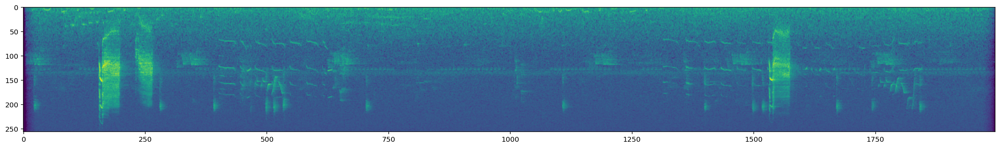

In [502]:
# First, compute the spectrogram using the "short-time Fourier transform" (stft)
spec_db = librosa.feature.melspectrogram(
    y=sig,
    sr=32000,
    n_fft=2048,
    hop_length=627,
    n_mels=256,
    fmin=FMIN,
    fmax=FMAX,
)
spec_db = librosa.power_to_db(spec_db, ref=np.max)
# Plot the spectrogram
plt.figure(figsize=(25, 15))
# librosa.display.specshow(
#     spec_db, sr=32000, x_axis="time", y_axis="hz", cmap=plt.get_cmap("viridis")
# )
plt.imshow(spec_db)
plt.show();

In [598]:
file_name = train_metadata.sample()["filename"].values[0]
ids = train_metadata[train_metadata["filename"] == file_name]
a = get_spectrograms(
    train_metadata,
    file_name=file_name,
    signal_lenght=SIGNAL_LENGTH,
    hop_length=None,
    output_dir="/app/_data/npy/",
    save=False,
)
file_name
ids
a[1].shape

'XC507581.ogg'

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,...,rating,time,url,date_1,geometry,file_path,frames,sr,duration,label_id
1173,amepip,,"call, flight call",34.7138,132.1765,Anthus rubescens,American Pipit,Anon Torimi,2019-11-17,XC507581.ogg,...,3.5,09:55,https://www.xeno-canto.org/507581,2019-11-17,POINT (132.17650 34.71380),/app/_data/birdclef-2021/train_short_audio/ame...,403366,32000,12.605187,7


(256, 256)

In [599]:
len(a)

3

In [600]:
for i in a:
    print(i.min(), i.max())

0.0 1.0
0.0 1.0
0.0 1.0


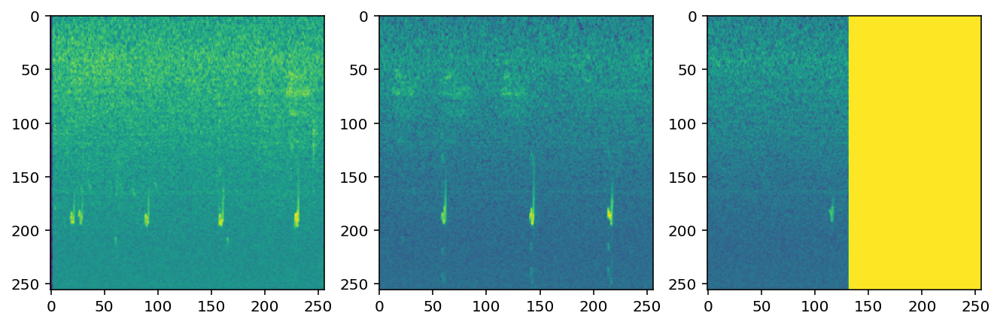

In [601]:
plt.figure(figsize=(15, 20))
for i in range(len(a)):
    plt.subplot(len(a) // 4 + 1, 4, i + 1)
    plt.imshow(a[i])
plt.show();

In [593]:
# Define a function that splits an audio file,
# extracts spectrograms and saves them in a working directory
def get_spectrograms(
    df,
    file_name,
    hop_length,
    output_dir=None,
    output_size=SPEC_SHAPE,
    signal_lenght=SIGNAL_LENGTH,
    sample_rate=SAMPLE_RATE,
    freq_min=FMIN,
    freq_max=FMAX,
    n_fft=2048,
    save=False,
):
    file_path = df[df["filename"] == file_name]["file_path"].values[0]
    duration = df[df["filename"] == file_name]["duration"].values[0]
    frames = df[df["filename"] == file_name]["frames"].values[0]
    label = df[df["filename"] == file_name]["primary_label"].values[0]
    secondary_label = df[df["filename"] == file_name]["secondary_labels"].values[0]
    hop_length = int(signal_lenght * sample_rate / (output_size[1] - 1))
    sig, rate = librosa.load(file_path, sr=sample_rate)
    mel_spec_full = librosa.feature.melspectrogram(
        y=sig,
        sr=sample_rate,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=output_size[0],
        fmin=freq_min,
        fmax=freq_max,
    )
    mel_spec_full = librosa.power_to_db(mel_spec_full, ref=np.max)

    signal_splits = []
    for i in range(0, mel_spec_full.shape[1], output_size[0]):
        if i + output_size[0] < mel_spec_full.shape[1]:
            split = mel_spec_full[:, i : i + output_size[0]]
            split -= split.min()
            split /= split.max()
        else:
            split = mel_spec_full[:, i : mel_spec_full.shape[1]]
            split = np.append(
                split,
                np.zeros((split.shape[0], split.shape[0] - split.shape[1])),
                axis=1,
            )
            split -= split.min()
            split /= split.max()

        if save and output_dir is not None:
            save_dir = os.path.join(output_dir, label)
            if not os.path.exists(save_dir):
                os.makedirs(save_dir)
            new_filename = file_name[:-4] + "_" + str(i // 256 + 1)
            np.save(os.path.join(save_dir, new_filename), split)
        signal_splits.append(split)
    return signal_splits

In [515]:
# Define a function that splits an audio file,
# extracts spectrograms and saves them in a working directory
def get_spectrograms(
    df,
    file_name,
    hop_length,
    output_dir=None,
    output_size=SPEC_SHAPE,
    signal_lenght=SIGNAL_LENGTH,
    sample_rate=SAMPLE_RATE,
    freq_min=FMIN,
    freq_max=FMAX,
    n_fft=2048,
    save=False,
):
    file_path = df[df["filename"] == file_name]["file_path"].values[0]
    duration = df[df["filename"] == file_name]["duration"].values[0]
    frames = df[df["filename"] == file_name]["frames"].values[0]
    label = df[df["filename"] == file_name]["primary_label"].values[0]
    secondary_label = df[df["filename"] == file_name]["secondary_labels"].values[0]
    hop_length = int(signal_lenght * sample_rate / (output_size[1] - 1))
    sig, rate = librosa.load(file_path, sr=sample_rate)
    signal_splits = []
    for i in range(0, frames, signal_lenght * sample_rate):
        if i + signal_lenght * sample_rate < frames:
            split = sig[i : i + signal_lenght * sample_rate]
        else:
            split = sig[i:frames]
            split = np.append(split, np.zeros(i + signal_lenght * sample_rate - frames))
        signal_splits.append(split)

    #     return signal_splits
    # Extract mel spectrograms for each audio chunk
    saved_samples = []
    for i in range(len(signal_splits)):
        mel_spec = librosa.feature.melspectrogram(
            y=signal_splits[i],
            sr=sample_rate,
            n_fft=n_fft,
            hop_length=hop_length,
            n_mels=output_size[0],
            fmin=freq_min,
            fmax=freq_max,
        )

        mel_spec = librosa.power_to_db(mel_spec, ref=np.max)

        # Normalize
        mel_spec -= mel_spec.min()
        mel_spec /= mel_spec.max()
        if save and output_dir is not None:
            save_dir = os.path.join(output_dir, label)
            if not os.path.exists(save_dir):
                os.makedirs(save_dir)
            new_filename = file_name[:-4] + "_" + str(i + 1)
            np.save(os.path.join(save_dir, new_filename), mel_spec)
        saved_samples.append(mel_spec)
    return saved_samples

In [284]:
a = get_spectrograms(
    train_metadata,
    file_name="XC539173.ogg",
    signal_lenght=SIGNAL_LENGTH,
    hop_length=None,
    output_dir="/app/_data/npy/",
    save=False,
)

In [260]:
a[0]

0.016771216

In [265]:
c = np.load("/app/_data/npy/mallar3/XC539173_.npy")

In [267]:
c.shape

(256, 256)

In [56]:
all_audio = pd.read_csv("/app/_data/all_audio_initial.csv", index_col=[0])

In [7]:
long_audio_df = all_audio[
    all_audio["file_path"].str.contains("train_soundscapes")
].reset_index(drop=True)
long_audio_df["end_sec"] = long_audio_df["row_id"].apply(
    lambda x: int(x.split("_")[-1])
)
long_audio_df["start_sec"] = long_audio_df["end_sec"] - 5

In [57]:
col = [
    'filemane'
    "rating",
    "year",
    "file_path",
    "frames",
    "duration",
    "row_id",
    "sin_month",
    "cos_month",
    "sin_longitude",
    "cos_longitude",
    "norm_latitude",
    "label_id",
    "class_weights",
    "start_sec",
    "end_sec",
    "secondary_labels_id",
]

In [59]:
all_audio.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65030 entries, 0 to 65273
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   primary_label        65030 non-null  object 
 1   secondary_labels     65030 non-null  object 
 2   latitude             65030 non-null  float64
 3   longitude            65030 non-null  float64
 4   date                 65030 non-null  object 
 5   filename             65030 non-null  object 
 6   rating               65030 non-null  float64
 7   month                65030 non-null  int64  
 8   year                 65030 non-null  int64  
 9   file_path            65030 non-null  object 
 10  frames               65030 non-null  float64
 11  duration             65030 non-null  float64
 12  row_id               2156 non-null   object 
 13  sin_month            65030 non-null  float64
 14  cos_month            65030 non-null  float64
 15  sin_longitude        65030 non-null 

In [61]:
all_audio[col].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65030 entries, 0 to 65273
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rating               65030 non-null  float64
 1   year                 65030 non-null  int64  
 2   file_path            65030 non-null  object 
 3   frames               65030 non-null  float64
 4   duration             65030 non-null  float64
 5   row_id               2156 non-null   object 
 6   sin_month            65030 non-null  float64
 7   cos_month            65030 non-null  float64
 8   sin_longitude        65030 non-null  float64
 9   cos_longitude        65030 non-null  float64
 10  norm_latitude        65030 non-null  float64
 11  label_id             65030 non-null  int64  
 12  class_weights        65030 non-null  float64
 13  start_sec            65030 non-null  int64  
 14  end_sec              65030 non-null  int64  
 15  secondary_labels_id  65030 non-null 

In [62]:
all_audio[["start_sec", "end_sec", "rating"]] = all_audio[
    ["start_sec", "end_sec", "rating"]
].astype("float16")
all_audio[["year", "label_id"]] = all_audio[["year", "label_id"]].astype("int16")

In [63]:
all_audio[col].info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65030 entries, 0 to 65273
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rating               65030 non-null  float16
 1   year                 65030 non-null  int16  
 2   file_path            65030 non-null  object 
 3   frames               65030 non-null  float64
 4   duration             65030 non-null  float64
 5   row_id               2156 non-null   object 
 6   sin_month            65030 non-null  float64
 7   cos_month            65030 non-null  float64
 8   sin_longitude        65030 non-null  float64
 9   cos_longitude        65030 non-null  float64
 10  norm_latitude        65030 non-null  float64
 11  label_id             65030 non-null  int16  
 12  class_weights        65030 non-null  float64
 13  start_sec            65030 non-null  float16
 14  end_sec              65030 non-null  float16
 15  secondary_labels_id  65030 non-null 